In [1]:
from collections import Counter,defaultdict
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.pylab as plb
import pickle
from sklearn.metrics import adjusted_rand_score
from scipy.spatial import distance
import seaborn as sns
import tqdm

In [2]:
#from simulate_data import *
#from topic_model import *
from lda_clust.topic_model import *
from lda_clust.simulate_data import *

In [3]:
def ari_trace_fun(true_lab,post_draw_lab):
    trace_ari=np.zeros(len(post_draw_lab))
    for i in range(len(post_draw_lab)):
        trace_ari[i]=adjusted_rand_score(true_lab,post_draw_lab[i])
    return trace_ari

In [4]:
def clust_trace(post_draw):
    cl_trace=np.zeros(len(post_draw))
    for i in range(len(post_draw)):
        cl_trace[i]=len(np.unique(post_draw[i]))
    return cl_trace

In [5]:
def comm_clust_trace(data): #data: dict of form data['s']
    c=np.zeros(len(data[0]))
    #make values (lists) of inner dic, a single list
    for i in range(len(data[0])):
        ls_temp=list()
        for k,v in data.items():
            ls_temp.extend(np.unique(v[i]))
        c[i]=len(np.unique(ls_temp))
    return c    

In [6]:
def hamm_z(data,real_data):    
    c={}
    for i in tqdm.tqdm(range(len(data))):
        dic_temp={}
        for j in range(len(data[i])):
            ls_temp=list()
            for k in range(len(data[i][j])):
                ls_temp.append(distance.hamming(data[i][j][k],real_data[i][j]))
            dic_temp[j]=np.mean(ls_temp)
        c[i]=dic_temp
    return c

In [7]:
def ari_z(data,real_data):    
    c={}
    for i in tqdm.tqdm(range(len(data))):
        dic_temp={}
        for j in range(len(data[i])):
            ls_temp=list()
            for k in range(len(data[i][j])):
                ls_temp.append(adjusted_rand_score(data[i][j][k],real_data[i][j]))
            dic_temp[j]=np.mean(ls_temp)
        c[i]=dic_temp
    return c

### Results for model 1 simulated data

#### CASE 1:
#### --K 20 --fx-k --H 0 --fx-h --fx-v --gamma 1 --eta 1 --alpha 1 --alpha-zero 1 --tau 1 --iter 100000 --burn 10000 --size 10 --verbose --calc-ll --return-t --thinning 100 --mod-init "custom"

In [5]:
# Simulation results
with open('./results/simul_results/topic_model_1_custom_init.pkl','rb') as file:
    sim_m1_custom=pickle.load(file)

In [6]:
# True model 1
with open('./data/data_m1.pkl','rb') as file:
    data_m1=pickle.load(file)

In [7]:
sim_m1_custom.keys()

dict_keys(['loglik', 't'])

In [8]:
ari_trace=ari_trace_fun(data_m1['t'],sim_m1_custom['t'])

Text(0.5, 1.0, 'Model 1 Custom init')

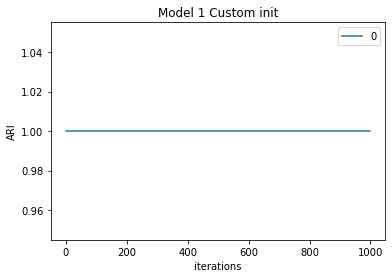

In [9]:
m1_cust=pd.DataFrame(ari_trace).plot()
m1_cust.set_xlabel("iterations")
m1_cust.set_ylabel("ARI")
plt.title("Model 1 Custom init")

In [10]:
cl_trace=clust_trace(sim_m1_custom['t'])

Text(0.5, 1.0, 'Model 1 Custom init')

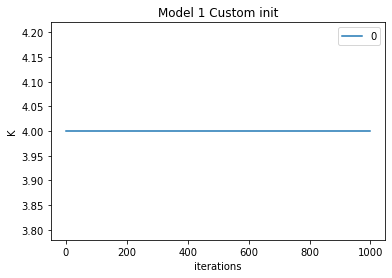

In [11]:
m1_cust2=pd.DataFrame(cl_trace).plot()
m1_cust2.set_xlabel("iterations")
m1_cust2.set_ylabel("K")
plt.title("Model 1 Custom init")

#### CASE 2:
#### --K 20 --fx-k --H 0 --fx-h --fx-v --gamma 1 --eta 1 --alpha 1 --alpha-zero 1 --tau 1 --iter 100000 --burn 10000 --size 10 --verbose --calc-ll --return-t --thinning 100 --mod-init "spectral"

In [12]:
# Simulation results
with open('./results/simul_results/topic_model_1_spectral_init.pkl','rb') as file:
    sim_m1_spectral=pickle.load(file)

Text(0.5, 1.0, 'Model 1 Spectral init')

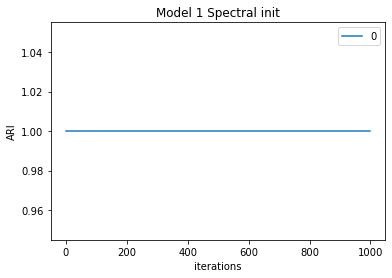

In [13]:
ari_trace2=ari_trace_fun(data_m1['t'],sim_m1_spectral['t'])
m1_spect=pd.DataFrame(ari_trace2).plot()
m1_spect.set_xlabel("iterations")
m1_spect.set_ylabel("ARI")
plt.title("Model 1 Spectral init")

Text(0.5, 1.0, 'Model 1 Sepctral init')

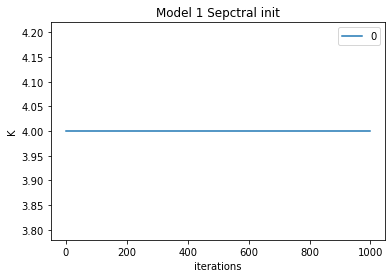

In [15]:
cl_trace2=clust_trace(sim_m1_spectral['t'])
m1_spect2=pd.DataFrame(cl_trace2).plot()
m1_spect2.set_xlabel("iterations")
m1_spect2.set_ylabel("K")
plt.title("Model 1 Sepctral init")

### Results for model 2 simulated data

#### CASE 1:
#### --K 20 --fx-k --H 0 --fx-h --fx-v --sec-top --gamma 1 --eta 1 --alpha 1 --alpha-zero 1 --tau 1 --iter 100000 --burn 10000 --size 10 --verbose --calc-ll --return-t --return-z --thinning 100 --mod-init "custom"

In [16]:
with open('./results/simul_results/topic_model_2_custom_init.pkl','rb') as file:
    sim_m2_custom=pickle.load(file)

In [17]:
sim_m2_custom.keys()

dict_keys(['loglik', 't', 'z'])

In [18]:
# True model 2
with open('./data/data_m2.pkl','rb') as file:
    data_m2=pickle.load(file)


<AxesSubplot:title={'center':'Model 2 Custom inti'}, xlabel='itearations', ylabel='ARI'>

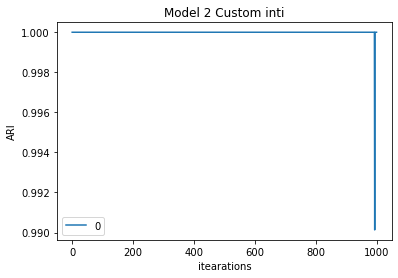

In [20]:
m2=ari_trace_fun(data_m2['t'],sim_m2_custom['t'])
pd.DataFrame(m2).plot(xlabel = "itearations",ylabel="ARI",title="Model 2 Custom inti")

<AxesSubplot:title={'center':'Model 2 Custom Init'}, xlabel='iterations', ylabel='K'>

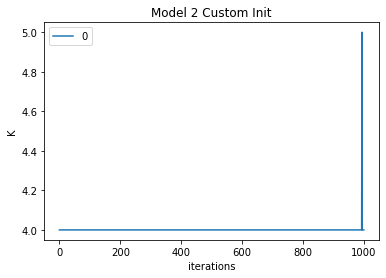

In [22]:
m2=clust_trace(sim_m2_custom['t'])
pd.DataFrame(m2).plot(xlabel="iterations",ylabel="K",title="Model 2 Custom Init")

#### CASE 2:
#### --K 20 --fx-k --H 0 --fx-h --fx-v --sec-top --gamma 1 --eta 1 --alpha 1 --alpha-zero 1 --tau 1 --iter 100000 --burn 10000 --size 10 --verbose --calc-ll --return-t --return-z --thinning 100 --mod-init "spectral"

In [23]:
with open('./results/simul_results/topic_model_2_spectral_init.pkl','rb') as file:
    sim_m2_spectral=pickle.load(file)

<AxesSubplot:title={'center':'Model 2 Spectral inti'}, xlabel='itearations', ylabel='ARI'>

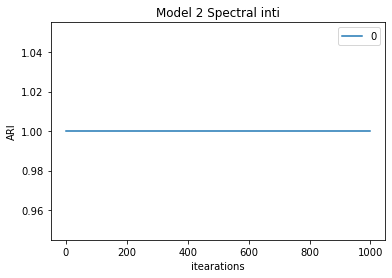

In [24]:
m2=ari_trace_fun(data_m2['t'],sim_m2_spectral['t'])
pd.DataFrame(m2).plot(xlabel = "itearations",ylabel="ARI",title="Model 2 Spectral inti")

<AxesSubplot:title={'center':'Model 2 Spectral Init'}, xlabel='iterations', ylabel='K'>

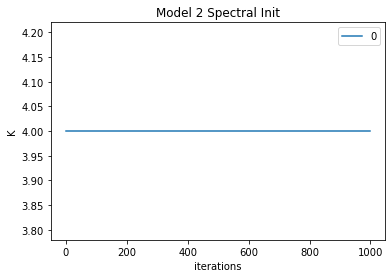

In [25]:
m2=clust_trace(sim_m2_spectral['t'])
pd.DataFrame(m2).plot(xlabel="iterations",ylabel="K",title="Model 2 Spectral Init")

### Results for model 3 simulated data

#### Case 1:
####  --K 20 --fx-k --H 40 --fx-h --fx-v --cmd-top --gamma 1 --eta 1 --alpha 1 --alpha-zero 1 --tau 1 --iter 100000 --burn 10000 --size 10 --verbose --calc-ll --return-t --return-s --thinning 100 --mod-init "custom"

In [26]:
# Simulation results
with open('./results/simul_results/topic_model_3_custom_init.pkl','rb') as file:
    sim_m3_custom=pickle.load(file)

In [27]:
# True Model 3
with open('./data/data_m3.pkl','rb') as file:
    data_m3=pickle.load(file)

In [28]:
sim_m3_custom.keys()

dict_keys(['loglik', 't', 's'])

<AxesSubplot:title={'center':'Model 3 Custom init'}, xlabel='itearations', ylabel='ARI for t'>

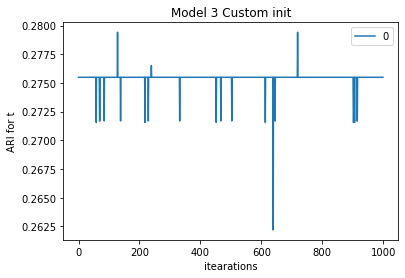

In [29]:
m3=ari_trace_fun(data_m3['t'],sim_m3_custom['t'])
pd.DataFrame(m3).plot(xlabel = "itearations",ylabel="ARI for t",title="Model 3 Custom init")

In [30]:
mult_ari=np.zeros(shape=(len(data_m3['s']),len(sim_m3_custom['t'])))
for i in range(len(data_m3['s'])):
    mult_ari[i]=ari_trace_fun(data_m3['s'][i],sim_m3_custom['s'][i])

<AxesSubplot:title={'center':'Model 3 Custom init'}, xlabel='iterations', ylabel='ARI for s'>

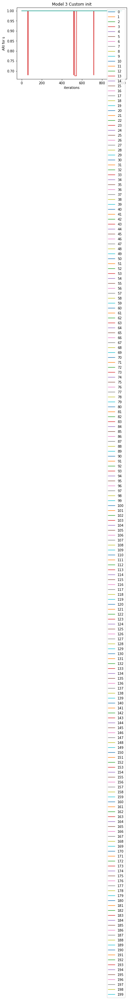

In [31]:
pd.DataFrame(mult_ari).T.plot(ylabel="ARI for s",xlabel="iterations",title="Model 3 Custom init")#legend=False

<AxesSubplot:title={'center':'Model 3 Custom init'}, xlabel='documents', ylabel='mean ARI for s'>

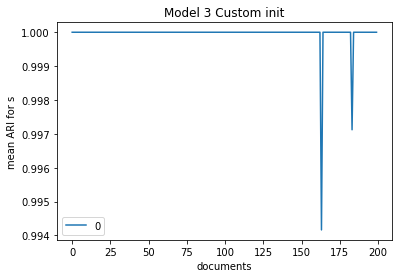

In [33]:
# Get mean ARI for each document
m=np.mean(mult_ari, axis=1)
pd.DataFrame(m).plot(xlabel="documents",ylabel="mean ARI for s",title="Model 3 Custom init")

<AxesSubplot:title={'center':'Model 3 Custom Init'}, xlabel='iterations', ylabel='K'>

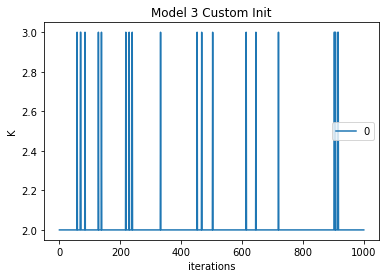

In [34]:
m3=clust_trace(sim_m3_custom['t'])
pd.DataFrame(m3).plot(xlabel="iterations",ylabel="K",title="Model 3 Custom Init")

<AxesSubplot:title={'center':'Model 3 Custom'}, xlabel='iterations', ylabel='H'>

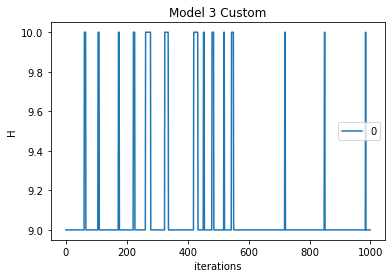

In [70]:
pd.DataFrame(comm_clust_trace(sim_m3_custom['s'])).plot(xlabel="iterations",ylabel="H",title="Model 3 Custom")

#### Case 2:
####  --K 20 --fx-k --H 40 --fx-h --fx-v --cmd-top --gamma 1 --eta 1 --alpha 1 --alpha-zero 1 --tau 1 --iter 100000 --burn 10000 --size 10 --verbose --calc-ll --return-t --return-s --thinning 100 --mod-init "spectral"

In [35]:
# Simulation results
with open('./results/simul_results/topic_model_3_spectral_init.pkl','rb') as file:
    sim_m3_spectral=pickle.load(file)

<AxesSubplot:title={'center':'Model 3 Spectral init'}, xlabel='itearations', ylabel='ARI for t'>

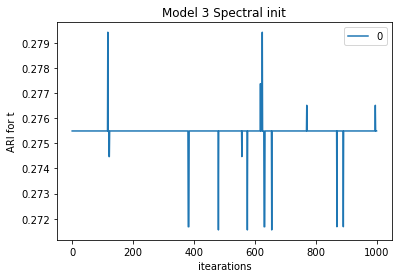

In [37]:
m3=ari_trace_fun(data_m3['t'],sim_m3_spectral['t'])
pd.DataFrame(m3).plot(xlabel = "itearations",ylabel="ARI for t",title="Model 3 Spectral init")

In [38]:
mult_ari=np.zeros(shape=(len(data_m3['s']),len(sim_m3_spectral['t'])))
for i in range(len(data_m3['s'])):
    mult_ari[i]=ari_trace_fun(data_m3['s'][i],sim_m3_spectral['s'][i])

<AxesSubplot:title={'center':'Model 3 Spectral init'}, xlabel='iterations', ylabel='ARI for s'>

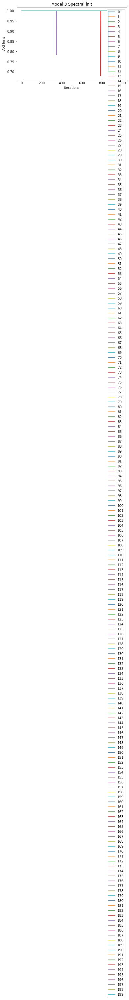

In [39]:
pd.DataFrame(mult_ari).T.plot(ylabel="ARI for s",xlabel="iterations",title="Model 3 Spectral init")

<AxesSubplot:title={'center':'Model 3 Spectral init'}, xlabel='documents', ylabel='mean ARI for s'>

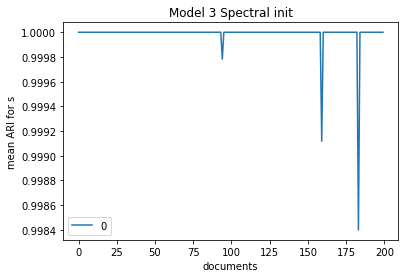

In [40]:
# Get mean ARI for each document
m=np.mean(mult_ari, axis=1)
pd.DataFrame(m).plot(xlabel="documents",ylabel="mean ARI for s",title="Model 3 Spectral init")

<AxesSubplot:title={'center':'Model 3 Spectral Init'}, xlabel='iterations', ylabel='K'>

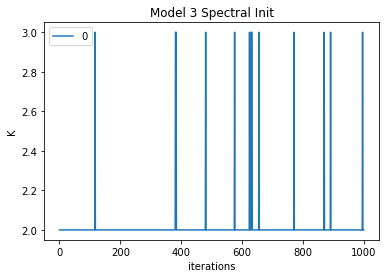

In [41]:
m3=clust_trace(sim_m3_spectral['t'])
pd.DataFrame(m3).plot(xlabel="iterations",ylabel="K",title="Model 3 Spectral Init")

<AxesSubplot:title={'center':'Model 3 Custom'}, xlabel='iterations', ylabel='H'>

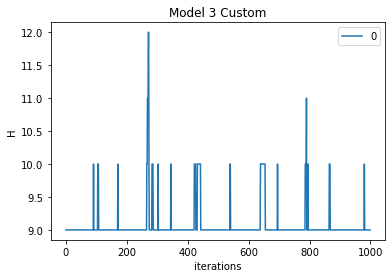

In [71]:
pd.DataFrame(comm_clust_trace(sim_m3_spectral['s'])).plot(xlabel="iterations",ylabel="H",title="Model 3 Custom")

### Results for model 4 simulated data

#### Case 1:
####  --K 20 --fx-k --H 40 --fx-h --fx-v --sec-top --cmd-top --gamma 1 --eta 1 --alpha 1 --alpha-zero 1 --tau 1 --iter 100000 --burn 10000 --size 10 --verbose --calc-ll --return-t --return-s --return-z --thinning 100 --mod-init "custom"

In [95]:
# Simulation resutls
with open('./simul_results/initial_results/topic_model_4_custom_init.pkl','rb') as file:
    sim_m4_custom=pickle.load(file)

In [96]:
# True model 4
with open('./simulated_data/data_m4.pkl','rb') as file:
    data_m4=pickle.load(file)

In [5]:
sim_m4_custom.keys()

dict_keys(['loglik', 't', 's', 'z'])

<AxesSubplot:title={'center':'Model 4 Custom init'}, xlabel='itearations', ylabel='ARI for t'>

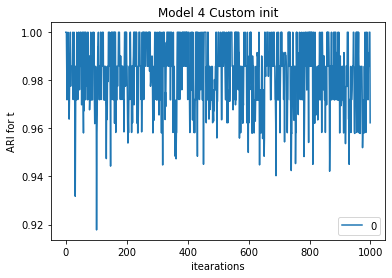

In [45]:
m3=ari_trace_fun(data_m4['t'],sim_m4_custom['t'])
pd.DataFrame(m3).plot(xlabel = "itearations",ylabel="ARI for t",title="Model 4 Custom init")

In [83]:
mult_ari=np.zeros(shape=(len(data_m4['s']),len(sim_m4_custom['t'])))
for i in range(len(data_m4['s'])):
    mult_ari[i]=ari_trace_fun(data_m4['s'][i],sim_m4_custom['s'][i])

In [84]:
mult_ari

array([[1.        , 1.        , 1.        , ..., 0.        , 0.        ,
        0.        ],
       [1.        , 1.        , 1.        , ..., 1.        , 1.        ,
        1.        ],
       [1.        , 1.        , 1.        , ..., 1.        , 0.58715596,
        0.58715596],
       ...,
       [1.        , 1.        , 1.        , ..., 1.        , 1.        ,
        1.        ],
       [1.        , 1.        , 0.41176471, ..., 1.        , 0.41176471,
        0.41176471],
       [1.        , 1.        , 1.        , ..., 1.        , 0.        ,
        0.        ]])

In [85]:
np.mean(mult_ari, axis=1)

array([0.711     , 1.        , 0.91      , 0.99235445, 0.78563053,
       0.90063218, 1.        , 0.99833333, 1.        , 0.89542857,
       0.97614724, 1.        , 0.999     , 0.99533333, 0.99909677,
       0.804     , 0.99888889, 1.        , 0.99274038, 0.86384458,
       0.85700414, 1.        , 0.91032824, 0.645     , 0.994     ,
       1.        , 0.96884783, 0.9706    , 0.844     , 0.868     ,
       0.80466667, 0.98670807, 0.92755861, 0.996     , 0.93913043,
       1.        , 1.        , 0.996     , 0.91590909, 0.86275089,
       1.        , 1.        , 1.        , 1.        , 0.89949005,
       0.99272727, 1.        , 1.        , 1.        , 1.        ,
       0.98804045, 1.        , 0.52050505, 1.        , 0.996     ,
       0.94488889, 0.93114286, 1.        , 0.89784615, 0.98486425,
       0.99932432, 1.        , 1.        , 1.        , 0.99941667,
       0.98533333, 0.92545455, 1.        , 0.163     , 0.92454545,
       0.94387701, 1.        , 1.        , 1.        , 1.     

<AxesSubplot:title={'center':'Model 4 Custom init'}, xlabel='iterations', ylabel='ARI for s'>

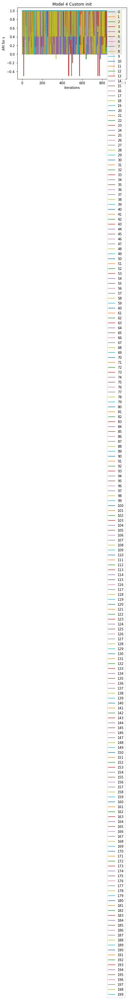

In [47]:
pd.DataFrame(mult_ari).T.plot(ylabel="ARI for s",xlabel="iterations",title="Model 4 Custom init")

<AxesSubplot:title={'center':'Model 4 Custom init'}, xlabel='documents', ylabel='mean ARI for s'>

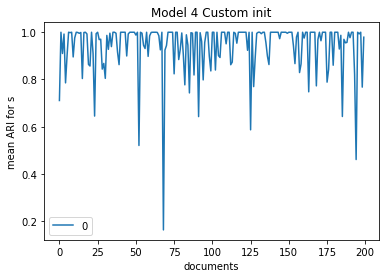

In [48]:
# Get mean ARI for each document
m=np.mean(mult_ari, axis=1)
pd.DataFrame(m).plot(xlabel="documents",ylabel="mean ARI for s",title="Model 4 Custom init")

<AxesSubplot:title={'center':'Model 4 Custom Init'}, xlabel='iterations', ylabel='K'>

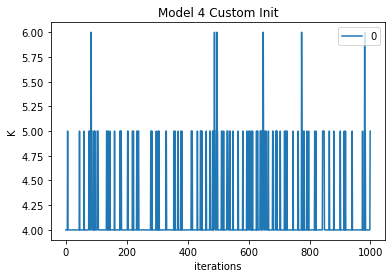

In [49]:
m3=clust_trace(sim_m4_custom['t'])
pd.DataFrame(m3).plot(xlabel="iterations",ylabel="K",title="Model 4 Custom Init")

<AxesSubplot:title={'center':'Model 3 Custom'}, xlabel='iterations', ylabel='H'>

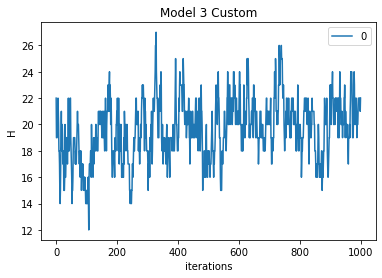

In [72]:
pd.DataFrame(comm_clust_trace(sim_m4_custom['s'])).plot(xlabel="iterations",ylabel="H",title="Model 3 Custom")

In [8]:
sim_m4_custom['s']

{0: array([[ 5,  5,  5,  5,  5],
        [ 5,  5,  5,  5,  5],
        [ 5,  5,  5,  5,  5],
        ...,
        [13,  5,  5,  5,  5],
        [13,  5,  5,  5,  5],
        [13,  5,  5,  5,  5]]),
 1: array([[7, 7, 7, 7, 7, 9],
        [7, 7, 7, 7, 7, 9],
        [7, 7, 7, 7, 7, 9],
        ...,
        [7, 7, 7, 7, 7, 9],
        [7, 7, 7, 7, 7, 9],
        [7, 7, 7, 7, 7, 9]]),
 2: array([[ 7,  5,  5,  5,  5,  7],
        [ 7,  5,  5,  5,  5,  7],
        [ 7,  5,  5,  5,  5,  7],
        ...,
        [ 7,  5,  5,  5,  5,  7],
        [ 7,  5,  5, 13,  5,  7],
        [ 7,  5,  5, 13,  5,  7]]),
 3: array([[8, 0, 8, ..., 0, 0, 0],
        [8, 0, 8, ..., 0, 0, 0],
        [8, 0, 8, ..., 0, 0, 0],
        ...,
        [8, 0, 8, ..., 0, 0, 0],
        [8, 0, 8, ..., 0, 0, 0],
        [8, 0, 8, ..., 0, 0, 0]]),
 4: array([[ 0,  0,  0, ...,  8,  0,  5],
        [ 0,  0,  0, ...,  8,  0,  5],
        [ 0,  0,  0, ...,  8,  0,  5],
        ...,
        [ 0,  0,  0, ...,  8,  0, 10],
      

In [6]:
sim_m4_custom['z']

{0: {0: array([[0, 0, 0, ..., 0, 0, 0],
         [0, 0, 0, ..., 0, 0, 0],
         [0, 0, 0, ..., 0, 0, 0],
         ...,
         [0, 0, 0, ..., 0, 0, 0],
         [0, 0, 0, ..., 0, 0, 0],
         [0, 0, 0, ..., 0, 0, 0]]),
  1: array([[0, 0, 1, ..., 0, 0, 0],
         [0, 0, 1, ..., 0, 0, 0],
         [0, 0, 1, ..., 0, 0, 0],
         ...,
         [0, 0, 1, ..., 0, 0, 0],
         [0, 0, 1, ..., 0, 0, 0],
         [0, 0, 1, ..., 0, 0, 0]]),
  2: array([[0, 0, 0, ..., 0, 0, 0],
         [0, 0, 0, ..., 0, 0, 0],
         [0, 0, 0, ..., 0, 0, 0],
         ...,
         [0, 0, 0, ..., 0, 0, 0],
         [0, 0, 0, ..., 0, 0, 0],
         [0, 0, 0, ..., 0, 0, 0]]),
  3: array([[0, 0, 0, ..., 0, 0, 0],
         [0, 0, 0, ..., 0, 0, 0],
         [0, 0, 0, ..., 0, 0, 0],
         ...,
         [0, 0, 0, ..., 0, 0, 0],
         [0, 0, 0, ..., 0, 0, 0],
         [0, 0, 0, ..., 0, 0, 0]]),
  4: array([[0, 0, 0, ..., 0, 0, 1],
         [0, 0, 0, ..., 0, 0, 1],
         [0, 0, 0, ..., 0, 0, 1],


In [176]:
c=hamm_z(sim_m4_custom['z'],data_m4['z'])

100%|██████████| 200/200 [01:54<00:00,  1.75it/s]


In [79]:
c

{0: {0: 0.0,
  1: 0.014875,
  2: 0.0064375,
  3: 0.012307692307692306,
  4: 0.024058823529411764},
 1: {0: 0.0705,
  1: 0.115875,
  2: 0.03505882352941177,
  3: 0.014999999999999998,
  4: 0.02890909090909091,
  5: 0.0301875},
 2: {0: 0.05938461538461538,
  1: 0.002142857142857143,
  2: 0.003300000000000001,
  3: 0.007272727272727274,
  4: 0.029363636363636363,
  5: 0.038799999999999994},
 3: {0: 0.07958823529411765,
  1: 0.061499999999999985,
  2: 0.028500000000000004,
  3: 0.08472727272727272,
  4: 0.00875,
  5: 0.008214285714285712,
  6: 0.0,
  7: 0.09025,
  8: 0.07066666666666668,
  9: 0.0116},
 4: {0: 0.019600000000000003,
  1: 0.0,
  2: 0.023333333333333334,
  3: 0.15630000000000002,
  4: 0.10522222222222226,
  5: 0.10771428571428569,
  6: 0.004928571428571427,
  7: 0.14000000000000007},
 5: {0: 0.011833333333333331,
  1: 0.019999999999999997,
  2: 0.01675,
  3: 0.012375,
  4: 0.0355,
  5: 0.03939999999999999,
  6: 0.09025},
 6: {0: 0.000125, 1: 0.1095, 2: 0.19344444444444447, 3: 

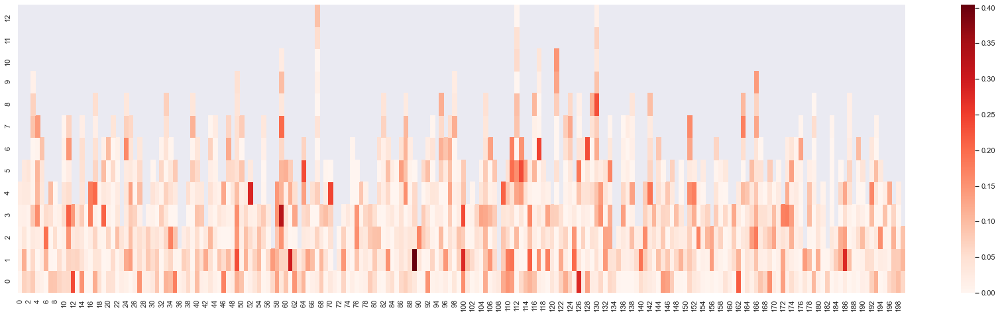

In [80]:
sns.set(rc={"figure.figsize":(30,8)})

df = pd.DataFrame(c)
g = sns.heatmap(df, cmap="Reds", annot=False)
g.invert_yaxis()
plt.show()

#### Case 2:
####  --K 20 --fx-k --H 40 --fx-h --fx-v --sec-top --cmd-top --gamma 1 --eta 1 --alpha 1 --alpha-zero 1 --tau 1 --iter 100000 --burn 10000 --size 10 --verbose --calc-ll --return-t --return-s --return-z --thinning 100 --mod-init "spectral"

In [ ]:
#python3 mcmc_cli.py --dir "/home/amantzio/lda_clust/simulated_data/revised_sim_data/data_m4.pkl" --K 20 --fx-k --H 40 --fx-h --fx-v --sec-top --cmd-top --gamma 1 --eta 1 --alpha 1 --alpha-zero 1 --tau 1 --iter 100000 --burn 0 --size 10 --verbose --calc-ll --return-t --return-s --return-z --return-change-s --return-change-t --return-change-z --thinning 10 --mod-init "spectral" --save-dir "/home/amantzio/lda_clust/simul_results/revised_simul_results/topic_model_4_spectral_init.pkl"

In [20]:
# Simulation resutls
with open('./simul_results/initial_results/topic_model_4_spectral_init.pkl','rb') as file:
    sim_m4_spectral=pickle.load(file)

In [21]:
m4=ari_trace_fun(data_m4['t'],sim_m4_spectral['t'])

<AxesSubplot:title={'center':'Model 4 Spectral init'}, xlabel='itearations', ylabel='ARI for t'>

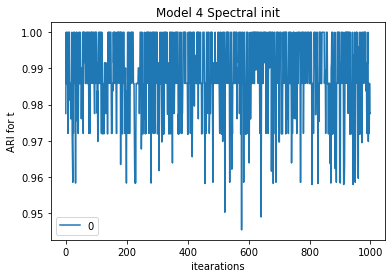

In [51]:
m3=ari_trace_fun(data_m4['t'],sim_m4_spectral['t'])
pd.DataFrame(m3).plot(xlabel = "itearations",ylabel="ARI for t",title="Model 4 Spectral init")

In [52]:
mult_ari=np.zeros(shape=(len(data_m4['s']),len(sim_m4_spectral['t'])))
for i in range(len(data_m4['s'])):
    mult_ari[i]=ari_trace_fun(data_m4['s'][i],sim_m4_spectral['s'][i])

<AxesSubplot:title={'center':'Model 4 Spectral init'}, xlabel='iterations', ylabel='ARI for s'>

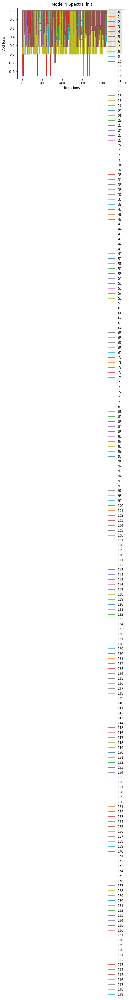

In [53]:
pd.DataFrame(mult_ari).T.plot(ylabel="ARI for s",xlabel="iterations",title="Model 4 Spectral init")

<AxesSubplot:title={'center':'Model 4 Spectral init'}, xlabel='documents', ylabel='mean ARI for s'>

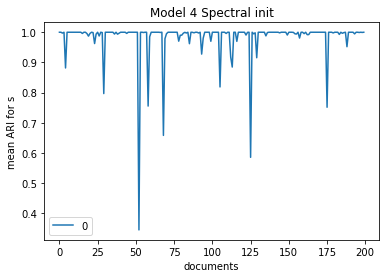

In [54]:
# Get mean ARI for each document
m=np.mean(mult_ari, axis=1)
pd.DataFrame(m).plot(xlabel="documents",ylabel="mean ARI for s",title="Model 4 Spectral init")

<AxesSubplot:title={'center':'Model 4 Spectral Init'}, xlabel='iterations (after thinning)', ylabel='K'>

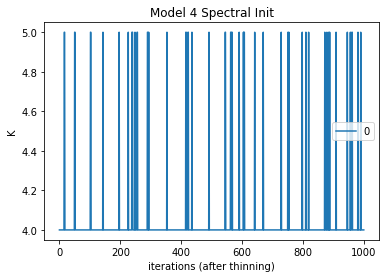

In [55]:
m3=clust_trace(sim_m4_spectral['t'])
pd.DataFrame(m3).plot(xlabel="iterations (after thinning)",ylabel="K",title="Model 4 Spectral Init")

<AxesSubplot:title={'center':'Model 3 Spectral'}, xlabel='iterations', ylabel='H'>

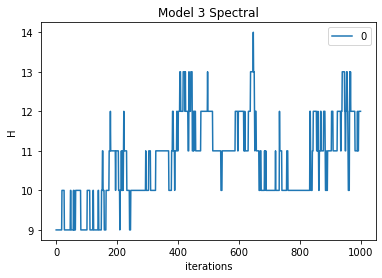

In [74]:
pd.DataFrame(comm_clust_trace(sim_m4_spectral['s'])).plot(xlabel="iterations",ylabel="H",title="Model 3 Spectral")

## Revised results for revised simulated data

### Visualize results from three different initialisations

In [7]:
def scatt_plot_ari_t(file_name_1,file_name_2,file_name_3,file_name_true_data, ax = None):
    # Simulation resutls for custom
    with open(f'./simul_results/revised_simul_results/{file_name_1}.pkl','rb') as file:
        sim_custom=pickle.load(file)   
    # Simulation resutls for spectral
    with open(f'./simul_results/revised_simul_results/{file_name_2}.pkl','rb') as file:
        sim_spectral=pickle.load(file)   
    # Simulation resutls for gensim
    with open(f'./simul_results/revised_simul_results/{file_name_3}.pkl','rb') as file:
        sim_gensim=pickle.load(file)
    # True model 
    with open(f'./simulated_data/revised_sim_data/{file_name_true_data}.pkl','rb') as file:
        data=pickle.load(file)
    ari_cust=ari_trace_fun(data['t'],sim_custom['t'])
    ari_spec=ari_trace_fun(data['t'],sim_spectral['t'])
    ari_gens=ari_trace_fun(data['t'],sim_gensim['t'])
    # Format data to plot
    r=np.hstack([ari_cust,ari_spec,ari_gens])
    init=np.hstack([np.repeat("custom",len(ari_cust)),np.repeat("spectral",len(ari_cust)),np.repeat("gensim",len(ari_cust))])
    df=pd.DataFrame([r,init]).T
    df.columns=["ARI for t","initialisation"]
    g = sns.stripplot(x="initialisation", y="ARI for t", data=df, ax = ax)
    return(g)

### Results for t for all models

In [273]:

left  = 0.125  # the left side of the subplots of the figure
right = 0.9    # the right side of the subplots of the figure
bottom = 0.1   # the bottom of the subplots of the figure
top = 0.9      # the top of the subplots of the figure
wspace = 0.2   # the amount of width reserved for blank space between subplots
hspace = 10   # the amount of height reserved for white space between subplots
plt.subplots_adjust(left=None, bottom=None, right=None, top=None, wspace=None, hspace=hspace)


<Figure size 360x360 with 0 Axes>

Text(0.5, 1.0, 'Model 4')

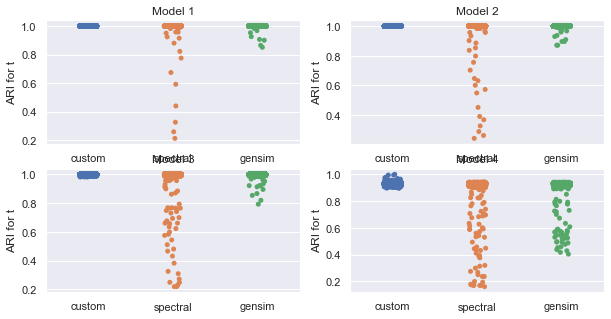

In [274]:

fig,axes = plt.subplots(2,2,figsize=(10,5))
scatt_plot_ari_t("topic_model_1_custom_init","topic_model_1_spectral_init","topic_model_1_gensim_init","data_m1", ax=axes[0,0])
scatt_plot_ari_t("topic_model_2_custom_init","topic_model_2_spectral_init","topic_model_2_gensim_init","data_m2", ax=axes[0,1])
scatt_plot_ari_t("topic_model_3_custom_init","topic_model_3_spectral_init","topic_model_3_gensim_init","data_m3", ax=axes[1,0])
scatt_plot_ari_t("topic_model_4_custom_init","topic_model_4_spectral_init","topic_model_4_gensim_init","data_m4", ax=axes[1,1])

axes[0,0].set_xlabel("")
axes[1,0].set_xlabel("")
axes[0,1].set_xlabel("")
axes[1,1].set_xlabel("")
axes[0,0].set_title("Model 1")
axes[0,1].set_title("Model 2")
axes[1,0].set_title("Model 3")
axes[1,1].set_title("Model 4")

### Results for s for models 3 and 4

### Model 3

In [9]:
# Simulation results for custom
with open('./simul_results/revised_simul_results/topic_model_3_custom_init.pkl','rb') as file:
    sim_m3_custom=pickle.load(file)
# Simulation results for spectral
with open('./simul_results/revised_simul_results/topic_model_3_spectral_init.pkl','rb') as file:
    sim_m3_spectral=pickle.load(file)
# Simulation results for gensim
with open('./simul_results/revised_simul_results/topic_model_3_gensim_init.pkl','rb') as file:
    sim_m3_gensim=pickle.load(file)
# True model 
with open(f'./simulated_data/revised_sim_data/data_m3.pkl','rb') as file:
    data_m3=pickle.load(file)

### Model 4

In [10]:
# Simulation results for custom
with open('./simul_results/revised_simul_results/topic_model_4_custom_init.pkl','rb') as file:
    sim_m4_custom=pickle.load(file)
# Simulation results for spectral
with open('./simul_results/revised_simul_results/topic_model_4_spectral_init.pkl','rb') as file:
    sim_m4_spectral=pickle.load(file)
# Simulation results for gensim
with open('./simul_results/revised_simul_results/topic_model_4_gensim_init.pkl','rb') as file:
    sim_m4_gensim=pickle.load(file)
# True model 
with open(f'./simulated_data/revised_sim_data/data_m4.pkl','rb') as file:
    data_m4=pickle.load(file)

In [89]:
"""import concurrent.futures
mult_ari=np.zeros(shape=(len(data_m4['s']),len(sim_m4_custom['t'])))

with concurrent.futures.ThreadPoolExecutor(max_workers=10) as exec:
    future = {exec.submit(ari_trace_fun,data_m4['s'][i],sim_m4_custom['s'][i]): i for i in range(len(data_m4['s']))}
    ind = 0
    for f in tqdm.tqdm(concurrent.futures.as_completed(future)):
        res = future(f)
        try:
            mult_ari[ind]=res.result()
        except:
            pass
        ind+=1"""

"import concurrent.futures\nmult_ari=np.zeros(shape=(len(data_m4['s']),len(sim_m4_custom['t'])))\n\nwith concurrent.futures.ThreadPoolExecutor(max_workers=10) as exec:\n    future = {exec.submit(ari_trace_fun,data_m4['s'][i],sim_m4_custom['s'][i]): i for i in range(len(data_m4['s']))}\n    ind = 0\n    for f in tqdm.tqdm(concurrent.futures.as_completed(future)):\n        res = future(f)\n        try:\n            mult_ari[ind]=res.result()\n        except:\n            pass\n        ind+=1"

In [159]:
import tqdm
mult_ari_spect_m3=np.zeros(shape=(len(data_m3['s']),len(sim_m3_spectral['t'])))
for i in tqdm.tqdm(range(len(data_m3['s']))):
    mult_ari_spect_m3[i]=ari_trace_fun(data_m3['s'][i],sim_m3_spectral['s'][i])

100%|██████████| 200/200 [10:07<00:00,  3.04s/it]


In [162]:
with open('./simul_results/revised_simul_results/topic_model_3_spectral_ARI_s.pkl','wb') as file:
    pickle.dump(mult_ari_spect_m3,file,protocol=pickle.HIGHEST_PROTOCOL)

In [295]:
###################################################
# ---------------- Load data ARI ---------------- #
###################################################

with open('./simul_results/revised_simul_results/topic_model_3_custom_ARI_s.pkl','rb') as file:
    mult_ari_custom_m3=pickle.load(file)
with open('./simul_results/revised_simul_results/topic_model_3_spectral_ARI_s.pkl','rb') as file:
    mult_ari_spect_m3=pickle.load(file)
with open('./simul_results/revised_simul_results/topic_model_3_gensim_ARI_s.pkl','rb') as file:
    mult_ari_gensim_m3=pickle.load(file)
with open('./simul_results/revised_simul_results/topic_model_4_custom_ARI_s.pkl','rb') as file:
    mult_ari_cust=pickle.load(file)
with open('./simul_results/revised_simul_results/topic_model_4_spectral_ARI_s.pkl','rb') as file:
    mult_ari_spect=pickle.load(file)
with open('./simul_results/revised_simul_results/topic_model_4_gensim_ARI_s.pkl','rb') as file:
    mult_ari_gensim=pickle.load(file)

In [12]:
def scatt_plot_mean_ari_s(mult_ari_custom,mult_ari_spect,mult_ari_gensim,ax=None):
    mean_ari_cust=np.mean(mult_ari_custom, axis=1)
    mean_ari_spect=np.mean(mult_ari_spect, axis=1)
    mean_ari_gens=np.mean(mult_ari_gensim, axis=1)
    r3=np.hstack([mean_ari_cust,mean_ari_spect,mean_ari_gens])
    init3=np.hstack([np.repeat("custom",len(mean_ari_cust)),np.repeat("spectral",len(mean_ari_spect)),np.repeat("gensim",len(mean_ari_gens))])
    df3=pd.DataFrame([r3,init3]).T
    df3.columns=["mean ARI for s","initialisation"]
    g3 = sns.stripplot(x="initialisation", y="mean ARI for s", data=df3,ax=ax)
    return(g3)

Text(0.5, 1.0, 'Model 4')

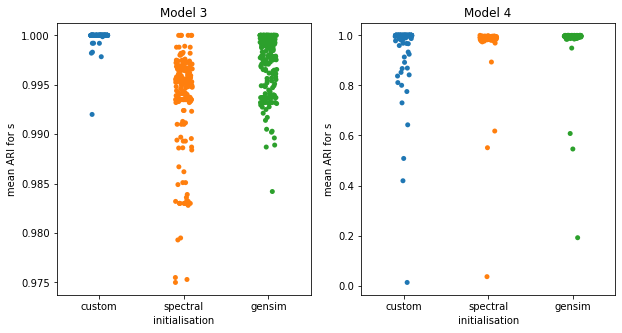

In [13]:
fig,axes = plt.subplots(1,2,figsize=(10,5))
scatt_plot_mean_ari_s(mult_ari_custom_m3,mult_ari_spect_m3,mult_ari_gensim_m3, ax=axes[0])
scatt_plot_mean_ari_s(mult_ari_cust,mult_ari_spect,mult_ari_gensim, ax=axes[1])

axes[0].set_title("Model 3")
axes[1].set_title("Model 4")


### Results for z for models 2 and 4

### Model 4

In [16]:
c=hamm_z(sim_m4_custom['z'],data_m4['z'])

100%|██████████| 200/200 [01:53<00:00,  1.76it/s]


In [21]:
with open('./simul_results/revised_simul_results/topic_model_4_custom_Hamm_z.pkl','wb') as file:
    pickle.dump(c,file,protocol=pickle.HIGHEST_PROTOCOL)

In [18]:
c2=hamm_z(sim_m4_spectral['z'],data_m4['z'])

100%|██████████| 200/200 [01:53<00:00,  1.76it/s]


In [22]:
with open('./simul_results/revised_simul_results/topic_model_4_spectral_Hamm_z.pkl','wb') as file:
    pickle.dump(c2,file,protocol=pickle.HIGHEST_PROTOCOL)

In [20]:
c3=hamm_z(sim_m4_gensim['z'],data_m4['z'])

100%|██████████| 200/200 [01:54<00:00,  1.75it/s]


In [23]:
with open('./simul_results/revised_simul_results/topic_model_4_gensim_Hamm_z.pkl','wb') as file:
    pickle.dump(c3,file,protocol=pickle.HIGHEST_PROTOCOL)

In [3]:
###################################################
# ---------------- Load data HAMM ---------------- #
###################################################
with open('./simul_results/revised_simul_results/topic_model_4_custom_Hamm_z.pkl','rb') as file:
    c=pickle.load(file)
with open('./simul_results/revised_simul_results/topic_model_4_spectral_Hamm_z.pkl','rb') as file:
    c2=pickle.load(file)
with open('./simul_results/revised_simul_results/topic_model_4_gensim_Hamm_z.pkl','rb') as file:
    c3=pickle.load(file)

In [4]:
def create_arrays(dic):
    dic = {i: list(dic[i].values()) for i in c} # flatten dictionary (from nested to single)
    dat = []
    rep = []
    for key, value in dic.items():
        rep.extend(np.repeat(key, len(value)))
        dat.extend(value)
    return dat,rep

In [8]:
cust_arrays=create_arrays(c)
spec_arrays=create_arrays(c2)
gens_arrays=create_arrays(c3)

In [9]:
init_arr_cust=np.repeat("custom",len(cust_arrays[0]))
init_arr_spec=np.repeat("spectral",len(spec_arrays[0]))
init_arr_gens=np.repeat("gensim",len(gens_arrays[0]))


In [10]:
mean_hamm=np.hstack([cust_arrays[0],spec_arrays[0],gens_arrays[0]])
documents=np.hstack([cust_arrays[1],spec_arrays[1],gens_arrays[1]])
initialisation=np.hstack([init_arr_cust,init_arr_spec,init_arr_gens])

In [11]:
df_z=pd.DataFrame([mean_hamm,documents,initialisation]).T
df_z.columns=["mean_hamm","documents","initialisation"]

In [12]:
df_z

,mean_hamm,documents,initialisation
0,0.039817,0,custom
1,0.205085,0,custom
2,0.162647,0,custom
3,0.124675,0,custom
4,0.127915,0,custom
...,...,...,...
3535,0.076923,198,gensim
3536,0.0,199,gensim
3537,0.333333,199,gensim
3538,0.527478,199,gensim


/Users/amantzio/opt/anaconda3/lib/python3.8/site-packages/seaborn/categorical.py:1296: UserWarning: 19.1% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/Users/amantzio/opt/anaconda3/lib/python3.8/site-packages/seaborn/categorical.py:1296: UserWarning: 20.8% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)


Text(0, 0.5, 'Mean Hamming')

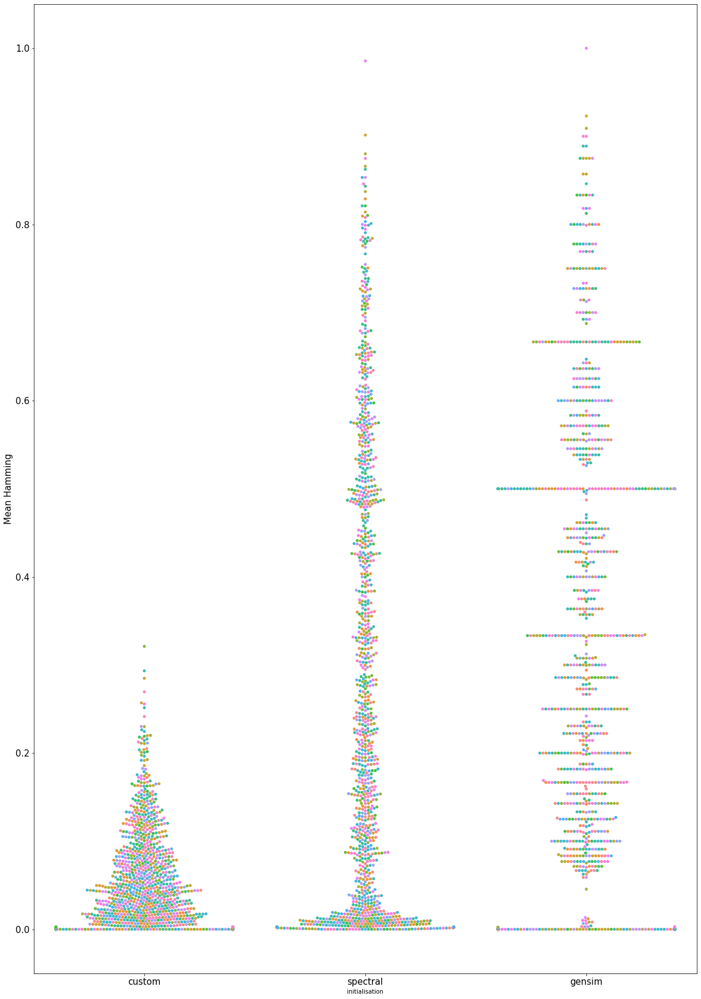

In [13]:
fig = plt.figure(figsize=(20,30))
g = sns.swarmplot(x="initialisation", y="mean_hamm", hue="documents", data=df_z,alpha=1)
plt.legend([],[], frameon=False)
plt.xticks(fontsize= 15)
plt.yticks(fontsize= 15)
g.set_ylabel("Mean Hamming",fontsize=15)

### Model 2

In [130]:
# Simulation results for custom
with open('./simul_results/revised_simul_results/topic_model_2_custom_init.pkl','rb') as file:
    sim_m2_custom=pickle.load(file)
# Simulation results for spectral
with open('./simul_results/revised_simul_results/topic_model_2_spectral_init.pkl','rb') as file:
    sim_m2_spectral=pickle.load(file)
# Simulation results for gensim
with open('./simul_results/revised_simul_results/topic_model_2_gensim_init.pkl','rb') as file:
    sim_m2_gensim=pickle.load(file)
# True model 
with open(f'./simulated_data/revised_sim_data/data_m2.pkl','rb') as file:
    data_m2=pickle.load(file)

In [131]:
# Model 2
c_m2=hamm_z(sim_m2_custom['z'],data_m2['z'])
c2_m2=hamm_z(sim_m2_spectral['z'],data_m2['z'])
c3_m2=hamm_z(sim_m2_gensim['z'],data_m2['z'])

100%|██████████| 200/200 [01:54<00:00,  1.75it/s]


In [132]:
with open('./simul_results/revised_simul_results/topic_model_2_custom_Hamm_z.pkl','wb') as file:
    pickle.dump(c_m2,file,protocol=pickle.HIGHEST_PROTOCOL)
with open('./simul_results/revised_simul_results/topic_model_2_spectral_Hamm_z.pkl','wb') as file:
    pickle.dump(c2_m2,file,protocol=pickle.HIGHEST_PROTOCOL)
with open('./simul_results/revised_simul_results/topic_model_2_gensim_Hamm_z.pkl','wb') as file:
    pickle.dump(c3_m2,file,protocol=pickle.HIGHEST_PROTOCOL)

In [14]:
###################################################
# ---------------- Load data HAMM ---------------- #
###################################################
with open('./simul_results/revised_simul_results/topic_model_2_custom_Hamm_z.pkl','rb') as file:
    c_m2=pickle.load(file)
with open('./simul_results/revised_simul_results/topic_model_2_spectral_Hamm_z.pkl','rb') as file:
    c2_m2=pickle.load(file)
with open('./simul_results/revised_simul_results/topic_model_2_gensim_Hamm_z.pkl','rb') as file:
    c3_m2=pickle.load(file)

In [15]:
cust_arrays_m2=create_arrays(c_m2)
spec_arrays_m2=create_arrays(c2_m2)
gens_arrays_m2=create_arrays(c3_m2)
# create initialisation column for df
init_arr_cust_m2=np.repeat("custom",len(cust_arrays_m2[0]))
init_arr_spec_m2=np.repeat("spectral",len(spec_arrays_m2[0]))
init_arr_gens_m2=np.repeat("gensim",len(gens_arrays_m2[0]))
# create columns of df
mean_hamm=np.hstack([cust_arrays_m2[0],spec_arrays_m2[0],gens_arrays_m2[0]])
documents=np.hstack([cust_arrays_m2[1],spec_arrays_m2[1],gens_arrays_m2[1]])
initialisation=np.hstack([init_arr_cust_m2,init_arr_spec_m2,init_arr_gens_m2])
# create df
df_z_m2=pd.DataFrame([mean_hamm,documents,initialisation]).T
df_z_m2.columns=["mean_hamm","documents","initialisation"]

/Users/amantzio/opt/anaconda3/lib/python3.8/site-packages/seaborn/categorical.py:1296: UserWarning: 31.9% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/Users/amantzio/opt/anaconda3/lib/python3.8/site-packages/seaborn/categorical.py:1296: UserWarning: 11.8% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/Users/amantzio/opt/anaconda3/lib/python3.8/site-packages/seaborn/categorical.py:1296: UserWarning: 44.1% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)


Text(0, 0.5, 'Mean Hamming')

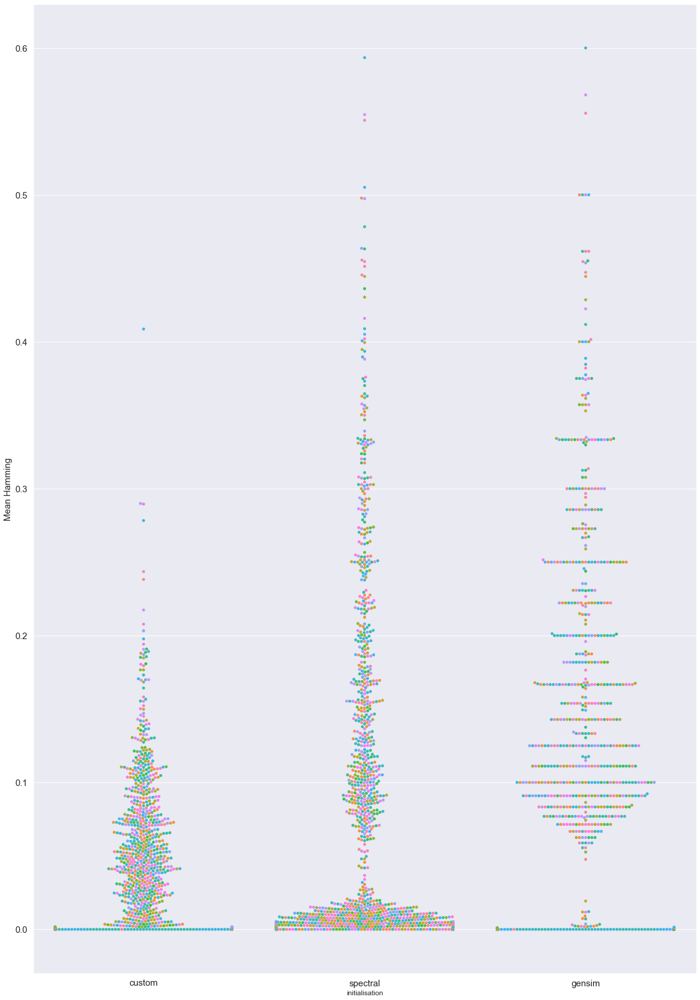

In [152]:
fig = plt.figure(figsize=(20,30))
g = sns.swarmplot(x="initialisation", y="mean_hamm", hue="documents", data=df_z_m2,alpha=1)
plt.legend([],[], frameon=False)
plt.xticks(fontsize= 15)
plt.yticks(fontsize= 15)
g.set_ylabel("Mean Hamming",fontsize=15)

### Alternative illustration of Hamming for z with heatmap

In [19]:
def visual_heatmap(dic,ax = None): # argument dic is the dictionary with values the mean Hamming for each command from post draws
    df = pd.DataFrame(dic)
    g = sns.heatmap(df, cmap="Reds", annot=False, ax=ax,vmin=0, vmax=1)
    #g.figure.axes[-1].set_yticklabels(g.get_yticks(),size=15)
    g.invert_yaxis()
    return g
    

Text(0.5, 1.0, 'Model 4, gensim init')

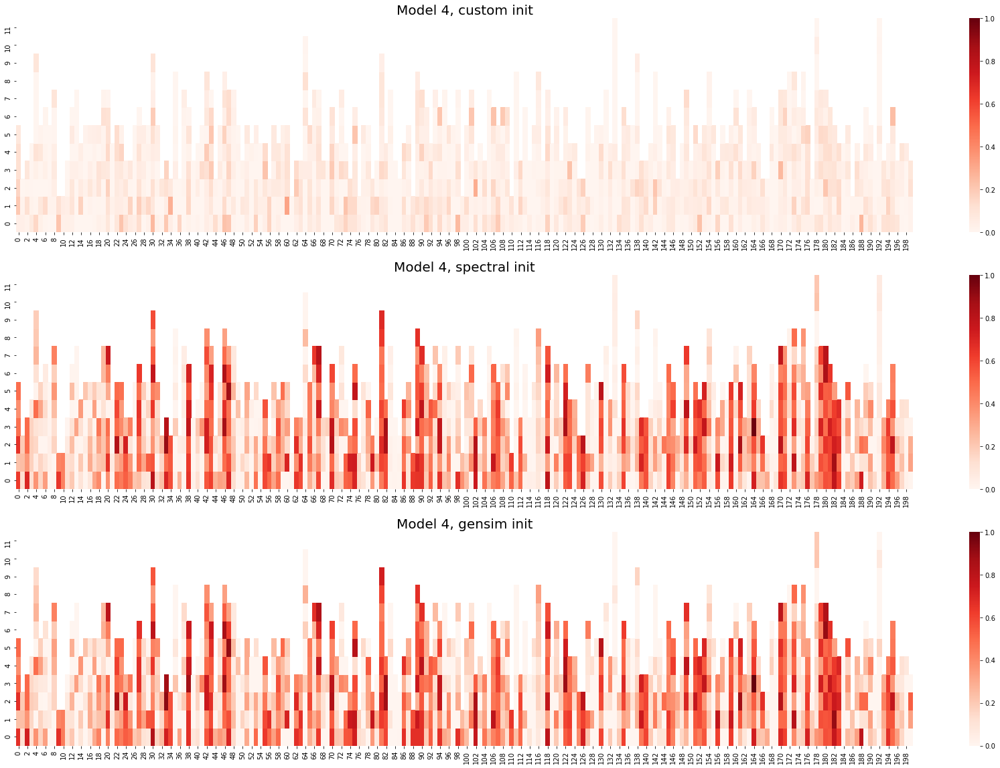

In [20]:
#sns.set(rc={"figure.figsize":(30,8)})
fig,axes = plt.subplots(3,1,figsize=(30,20))

visual_heatmap(c, ax=axes[0])
visual_heatmap(c2, ax=axes[1])
visual_heatmap(c3, ax=axes[2])

axes[0].set_title("Model 4, custom init", fontsize=20)
axes[1].set_title("Model 4, spectral init", fontsize=20)
axes[2].set_title("Model 4, gensim init", fontsize=20)
#plb.setp(axes[0].get_legend(), fontsize='22')
#plt.legend(fontsize='x-large', title_fontsize='40')

Text(0.5, 1.0, 'Model 2, gensim init')

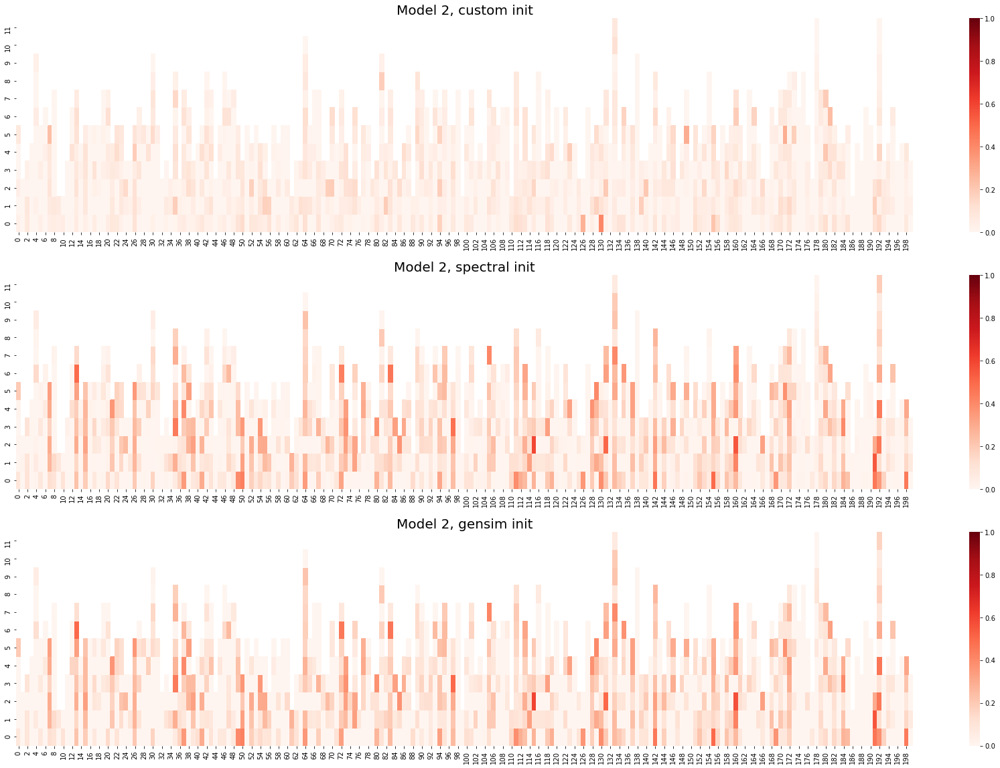

In [21]:
#sns.set(rc={"figure.figsize":(30,8)})
fig,axes = plt.subplots(3,1,figsize=(30,20))

visual_heatmap(c_m2, ax=axes[0])
visual_heatmap(c2_m2, ax=axes[1])
visual_heatmap(c3_m2, ax=axes[2])

axes[0].set_title("Model 2, custom init", fontsize=20)
axes[1].set_title("Model 2, spectral init", fontsize=20)
axes[2].set_title("Model 2, gensim init", fontsize=20)
#plb.setp(axes[0].get_legend(), fontsize='22')
#plt.legend(fontsize='x-large', title_fontsize='40')

# Varying csi

## Model 1

In [153]:
# Simulation results
with open(f'./simul_results/varying_csi/model_1/res_model_1_csi_5.pkl','rb') as file:
    sim_m1_spectral_csi_5=pickle.load(file)
with open(f'./simul_results/varying_csi/model_1/res_model_1_csi_55.pkl','rb') as file:
    sim_m1_spectral_csi_55=pickle.load(file)
with open(f'./simul_results/varying_csi/model_1/res_model_1_csi_105.pkl','rb') as file:
    sim_m1_spectral_csi_105=pickle.load(file)
with open(f'./simul_results/varying_csi/model_1/res_model_1_csi_155.pkl','rb') as file:
    sim_m1_spectral_csi_155=pickle.load(file)
with open(f'./simul_results/varying_csi/model_1/res_model_1_csi_205.pkl','rb') as file:
    sim_m1_spectral_csi_205=pickle.load(file)

In [154]:
# True data
with open(f'./simulated_data/varying_csi/model_1/data_m1_csi_5.pkl','rb') as file:
    data_m1_csi_5=pickle.load(file)
with open(f'./simulated_data/varying_csi/model_1/data_m1_csi_55.pkl','rb') as file:
    data_m1_csi_55=pickle.load(file)
with open(f'./simulated_data/varying_csi/model_1/data_m1_csi_105.pkl','rb') as file:
    data_m1_csi_105=pickle.load(file)
with open(f'./simulated_data/varying_csi/model_1/data_m1_csi_155.pkl','rb') as file:
    data_m1_csi_155=pickle.load(file)
with open(f'./simulated_data/varying_csi/model_1/data_m1_csi_205.pkl','rb') as file:
    data_m1_csi_205=pickle.load(file)

In [155]:
sim_m1_spectral_csi_5[0].keys()

dict_keys(['loglik', 't', 'change_t_counter'])

In [22]:
sim_m1_spectral_csi_5[0]['t']

array([[ 5, 13,  5, ...,  5,  3,  5],
       [ 5, 13,  5, ...,  5,  3,  5],
       [ 5, 13,  5, ...,  5,  3,  5],
       ...,
       [ 5, 13,  5, ...,  5,  3,  5],
       [ 5, 13,  5, ...,  5,  3,  5],
       [ 5, 13,  5, ...,  5,  3,  5]])

In [178]:
def scatt_plot_ari_t_var_csi(sim_res_1=None,sim_res_2=None,sim_res_3=None,sim_res_4=None,sim_res_5=None,data_1=None,data_2=None,data_3=None,data_4=None,data_5=None,ax = None):
    ari_1=ari_trace_fun(data_1['t'],sim_res_1[0]['t'])
    ari_2=ari_trace_fun(data_2['t'],sim_res_2[0]['t'])
    ari_3=ari_trace_fun(data_3['t'],sim_res_3[0]['t'])
    if sim_res_4 and sim_res_5:
        ari_4=ari_trace_fun(data_4['t'],sim_res_4[0]['t'])
        ari_5=ari_trace_fun(data_5['t'],sim_res_5[0]['t'])
        # Format data to plot
        r=np.hstack([ari_1,ari_2,ari_3,ari_4,ari_5])
        init=np.hstack([np.repeat("5",len(ari_1)),np.repeat("55",len(ari_2)),np.repeat("105",len(ari_3)),
                       np.repeat("155",len(ari_2)),np.repeat("205",len(ari_3))])
        df=pd.DataFrame([r,init]).T
        df.columns=["ARI for t","csi"]
        g = sns.stripplot(x="csi", y="ARI for t", data=df, ax = ax)
    else:
        # Format data to plot
        r=np.hstack([ari_1,ari_2,ari_3])
        init=np.hstack([np.repeat("5",len(ari_1)),np.repeat("55",len(ari_2)),np.repeat("105",len(ari_3))])
        df=pd.DataFrame([r,init]).T
        df.columns=["ARI for t","csi"]
        g = sns.stripplot(x="csi", y="ARI for t", data=df, ax = ax)
    return g

<AxesSubplot:xlabel='csi', ylabel='ARI for t'>

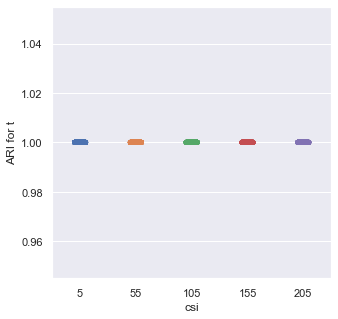

In [190]:
sns.set(rc={"figure.figsize":(5,5)})
scatt_plot_ari_t_var_csi(sim_m1_spectral_csi_5,sim_m1_spectral_csi_55,sim_m1_spectral_csi_105,sim_m1_spectral_csi_155,sim_m1_spectral_csi_205,
                         data_m1_csi_5,data_m1_csi_55,data_m1_csi_105,data_m1_csi_155,data_m1_csi_205)

## Model 2

In [169]:
# Simulation results
with open(f'./simul_results/varying_csi/model_2/res_model_2_csi_5.pkl','rb') as file:
    sim_m2_spectral_csi_5=pickle.load(file)
with open(f'./simul_results/varying_csi/model_2/res_model_2_csi_55.pkl','rb') as file:
    sim_m2_spectral_csi_55=pickle.load(file)
with open(f'./simul_results/varying_csi/model_2/res_model_2_csi_105.pkl','rb') as file:
    sim_m2_spectral_csi_105=pickle.load(file)

In [170]:
# True data
with open(f'./simulated_data/varying_csi/model_2/data_m2_csi_5.pkl','rb') as file:
    data_m2_csi_5=pickle.load(file)
with open(f'./simulated_data/varying_csi/model_2/data_m2_csi_55.pkl','rb') as file:
    data_m2_csi_55=pickle.load(file)
with open(f'./simulated_data/varying_csi/model_2/data_m2_csi_105.pkl','rb') as file:
    data_m2_csi_105=pickle.load(file)

<AxesSubplot:xlabel='csi', ylabel='ARI for t'>

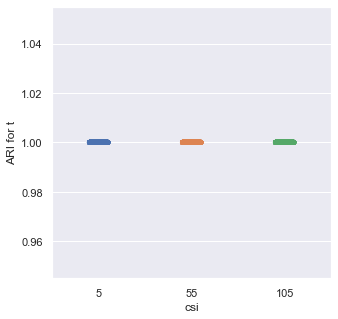

In [186]:
sns.set(rc={"figure.figsize":(5,5)})
scatt_plot_ari_t_var_csi(sim_res_1=sim_m2_spectral_csi_5,sim_res_2=sim_m2_spectral_csi_55,sim_res_3=sim_m2_spectral_csi_105,
                         data_1=data_m2_csi_5,data_2=data_m2_csi_55,data_3=data_m2_csi_105)

In [276]:
c_m2_csi=hamm_z(sim_m2_spectral_csi_5[0]['z'],data_m2_csi_5['z'])
c2_m2_csi=hamm_z(sim_m2_spectral_csi_55[0]['z'],data_m2_csi_55['z'])
c3_m2_csi=hamm_z(sim_m2_spectral_csi_105[0]['z'],data_m2_csi_105['z'])

100%|██████████| 200/200 [03:28<00:00,  1.04s/it]


In [277]:
with open('./simul_results/varying_csi/model_2/res_model_2_csi_5_Hamm_z.pkl','wb') as file:
    pickle.dump(c_m2_csi,file,protocol=pickle.HIGHEST_PROTOCOL)
with open('./simul_results/varying_csi/model_2/res_model_2_csi_55_Hamm_z.pkl','wb') as file:
    pickle.dump(c2_m2_csi,file,protocol=pickle.HIGHEST_PROTOCOL)
with open('./simul_results/varying_csi/model_2/res_model_2_csi_105_Hamm_z.pkl','wb') as file:
    pickle.dump(c3_m2_csi,file,protocol=pickle.HIGHEST_PROTOCOL)

In [24]:
###################################################
# ---------------- Load data HAMM ---------------- #
###################################################
with open('./simul_results/varying_csi/model_2/res_model_2_csi_5_Hamm_z.pkl','rb') as file:
    c_m2_csi=pickle.load(file)
with open('./simul_results/varying_csi/model_2/res_model_2_csi_55_Hamm_z.pkl','rb') as file:
    c2_m2_csi=pickle.load(file)
with open('./simul_results/varying_csi/model_2/res_model_2_csi_105_Hamm_z.pkl','rb') as file:
    c3_m2_csi=pickle.load(file)

In [ ]:
def visual_heatmap(dic,ax = None): # argument dic is the dictionary with values the mean Hamming for each command from post draws
    df = pd.DataFrame(dic)
    g = sns.heatmap(df, cmap="Reds", annot=False, ax=ax,vmin=0, vmax=1)
    #g.figure.axes[-1].set_yticklabels(g.get_yticks(),size=15)
    g.invert_yaxis()
    return g
    

Text(0.5, 1.0, 'Model 2, csi 105')

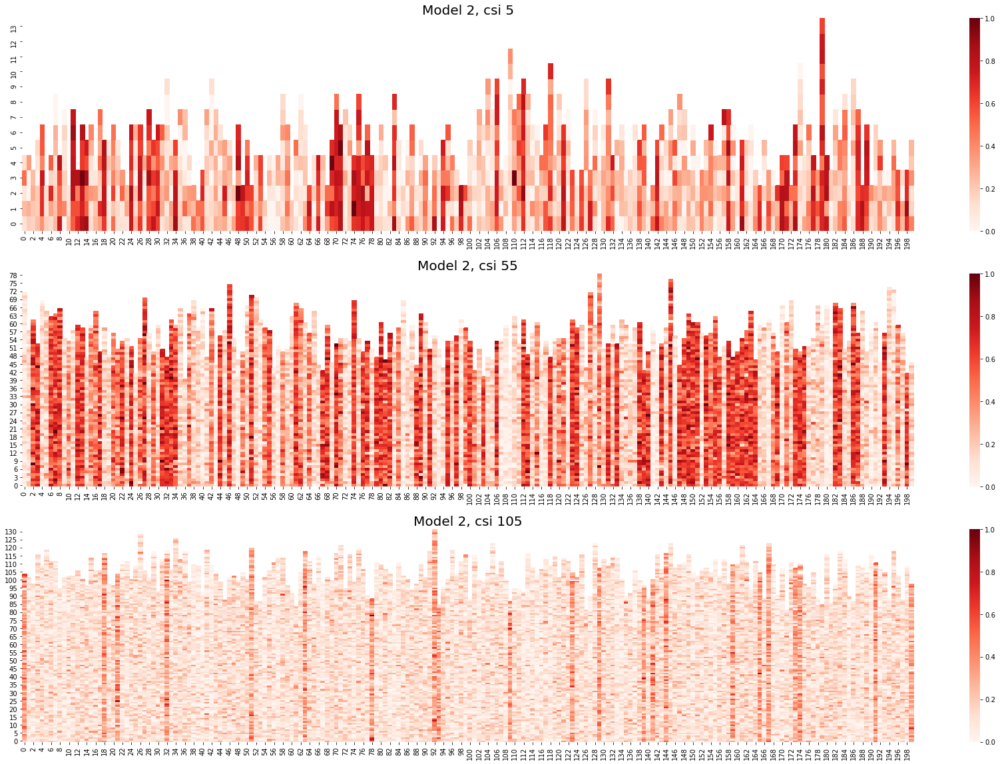

In [25]:
fig,axes = plt.subplots(3,1,figsize=(30,20))

visual_heatmap(c_m2_csi, ax=axes[0])
visual_heatmap(c2_m2_csi, ax=axes[1])
visual_heatmap(c3_m2_csi, ax=axes[2])

axes[0].set_title("Model 2, csi 5", fontsize=20)
axes[1].set_title("Model 2, csi 55", fontsize=20)
axes[2].set_title("Model 2, csi 105", fontsize=20)

## Model 3

In [244]:
# Simulation results
with open(f'./simul_results/varying_csi/model_3/res_model_3_csi_5.pkl','rb') as file:
    sim_m3_spectral_csi_5=pickle.load(file)
with open(f'./simul_results/varying_csi/model_3/res_model_3_csi_55.pkl','rb') as file:
    sim_m3_spectral_csi_55=pickle.load(file)
with open(f'./simul_results/varying_csi/model_3/res_model_3_csi_105.pkl','rb') as file:
    sim_m3_spectral_csi_105=pickle.load(file)
#with open(f'./simul_results/varying_csi/model_3/res_model_3_csi_155.pkl','rb') as file:
#    sim_m3_spectral_csi_155=pickle.load(file)
#with open(f'./simul_results/varying_csi/model_3/res_model_3_csi_205.pkl','rb') as file:
#    sim_m3_spectral_csi_205=pickle.load(file)

In [245]:
# True data
with open(f'./simulated_data/varying_csi/model_3/data_m3_csi_5.pkl','rb') as file:
    data_m3_csi_5=pickle.load(file)
with open(f'./simulated_data/varying_csi/model_3/data_m3_csi_55.pkl','rb') as file:
    data_m3_csi_55=pickle.load(file)
with open(f'./simulated_data/varying_csi/model_3/data_m3_csi_105.pkl','rb') as file:
    data_m3_csi_105=pickle.load(file)
#with open(f'./simulated_data/varying_csi/model_3/data_m3_csi_155.pkl','rb') as file:
#    data_m3_csi_155=pickle.load(file)
#with open(f'./simulated_data/varying_csi/model_3/data_m3_csi_205.pkl','rb') as file:
#    data_m3_csi_205=pickle.load(file)

<AxesSubplot:xlabel='csi', ylabel='ARI for t'>

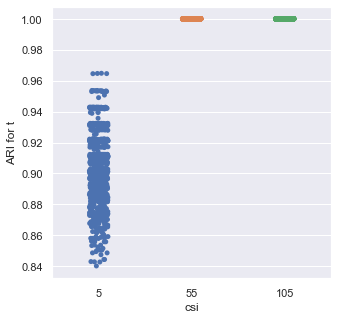

In [253]:
sns.set(rc={"figure.figsize":(5,5)})
scatt_plot_ari_t_var_csi(sim_res_1=sim_m3_spectral_csi_5,sim_res_2=sim_m3_spectral_csi_55,sim_res_3=sim_m3_spectral_csi_105,
                         data_1=data_m3_csi_5,data_2=data_m3_csi_55,data_3=data_m3_csi_105)

In [254]:
#scatt_plot_ari_t_var_csi(sim_m3_spectral_csi_5,sim_m3_spectral_csi_55,sim_m3_spectral_csi_105,sim_m3_spectral_csi_155,sim_m3_spectral_csi_205,
#                         data_m3_csi_5,data_m3_csi_55,data_m1_csi_105,data_m3_csi_155,data_m1_csi_205)

In [239]:
import tqdm
mult_ari_m3_spectral_csi_105=np.zeros(shape=(len(data_m3_csi_105['s']),len(sim_m3_spectral_csi_105[0]['t'])))
for i in tqdm.tqdm(range(len(data_m3_csi_105['s']))):
    mult_ari_m3_spectral_csi_105[i]=ari_trace_fun(data_m3_csi_105['s'][i],sim_m3_spectral_csi_105[0]['s'][i])

100%|██████████| 200/200 [01:00<00:00,  3.28it/s]


In [240]:
with open('./simul_results/varying_csi/model_3/res_model_3_csi_5_ARI_s.pkl','wb') as file:
    pickle.dump(mult_ari_m3_spectral_csi_5,file,protocol=pickle.HIGHEST_PROTOCOL)
with open('./simul_results/varying_csi/model_3/res_model_3_csi_55_ARI_s.pkl','wb') as file:
    pickle.dump(mult_ari_m3_spectral_csi_55,file,protocol=pickle.HIGHEST_PROTOCOL)
with open('./simul_results/varying_csi/model_3/res_model_3_csi_105_ARI_s.pkl','wb') as file:
    pickle.dump(mult_ari_m3_spectral_csi_105,file,protocol=pickle.HIGHEST_PROTOCOL)

In [ ]:
###################################################
# ---------------- Load data ARI ---------------- #
###################################################
with open('./simul_results/varying_csi/model_3/res_model_3_csi_5_ARI_s.pkl','rb') as file:
    mult_ari_m3_spectral_csi_5=pickle.load(file)
with open('./simul_results/varying_csi/model_3/res_model_3_csi_55_ARI_s.pkl','rb') as file:
    mult_ari_m3_spectral_csi_55=pickle.load(file)
with open('./simul_results/varying_csi/model_3/res_model_3_csi_105_ARI_s.pkl','rb') as file:
    mult_ari_m3_spectral_csi_105=pickle.load(file)

In [260]:
def scatt_plot_mean_ari_s(mult_ari_1,mult_ari_2,mult_ari_3,ax=None):
    mean_ari_cust=np.mean(mult_ari_1, axis=1)
    mean_ari_spect=np.mean(mult_ari_2, axis=1)
    mean_ari_gens=np.mean(mult_ari_3, axis=1)
    r3=np.hstack([mean_ari_cust,mean_ari_spect,mean_ari_gens])
    init3=np.hstack([np.repeat("5",len(mean_ari_cust)),np.repeat("55",len(mean_ari_spect)),np.repeat("105",len(mean_ari_gens))])
    df3=pd.DataFrame([r3,init3]).T
    df3.columns=["mean ARI for s","csi"]
    g3 = sns.stripplot(x="csi", y="mean ARI for s", data=df3,ax=ax)
    return(g3)

<AxesSubplot:xlabel='csi', ylabel='mean ARI for s'>

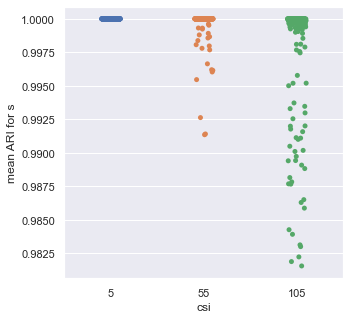

In [261]:
scatt_plot_mean_ari_s(mult_ari_m3_spectral_csi_5,mult_ari_m3_spectral_csi_55,mult_ari_m3_spectral_csi_105)

## Model 4

In [263]:
# Simulation results
with open(f'./simul_results/varying_csi/model_4/res_model_4_csi_5.pkl','rb') as file:
    sim_m4_spectral_csi_5=pickle.load(file)
with open(f'./simul_results/varying_csi/model_4/res_model_4_csi_55.pkl','rb') as file:
    sim_m4_spectral_csi_55=pickle.load(file)
with open(f'./simul_results/varying_csi/model_4/res_model_4_csi_105.pkl','rb') as file:
    sim_m4_spectral_csi_105=pickle.load(file)

In [264]:
# True data
with open(f'./simulated_data/varying_csi/model_4/data_m4_csi_5.pkl','rb') as file:
    data_m4_csi_5=pickle.load(file)
with open(f'./simulated_data/varying_csi/model_4/data_m4_csi_55.pkl','rb') as file:
    data_m4_csi_55=pickle.load(file)
with open(f'./simulated_data/varying_csi/model_4/data_m4_csi_105.pkl','rb') as file:
    data_m4_csi_105=pickle.load(file)

<AxesSubplot:xlabel='csi', ylabel='ARI for t'>

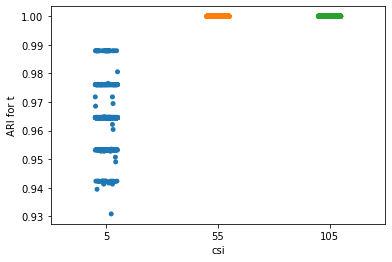

In [41]:
scatt_plot_ari_t_var_csi(sim_m4_spectral_csi_5,sim_m4_spectral_csi_55,sim_m4_spectral_csi_105,data_m4_csi_5,
                        data_m4_csi_55,data_m4_csi_105)

In [267]:
import tqdm
mult_ari_m4_spectral_csi_55=np.zeros(shape=(len(data_m4_csi_55['s']),len(sim_m4_spectral_csi_55[0]['t'])))
for i in tqdm.tqdm(range(len(data_m4_csi_55['s']))):
    mult_ari_m4_spectral_csi_55[i]=ari_trace_fun(data_m4_csi_55['s'][i],sim_m4_spectral_csi_55[0]['s'][i])

100%|██████████| 200/200 [01:00<00:00,  3.29it/s]


In [268]:
with open('./simul_results/varying_csi/model_4/res_model_4_csi_5_ARI_s.pkl','wb') as file:
    pickle.dump(mult_ari_m4_spectral_csi_5,file,protocol=pickle.HIGHEST_PROTOCOL)
with open('./simul_results/varying_csi/model_4/res_model_4_csi_55_ARI_s.pkl','wb') as file:
    pickle.dump(mult_ari_m4_spectral_csi_55,file,protocol=pickle.HIGHEST_PROTOCOL)
with open('./simul_results/varying_csi/model_4/res_model_4_csi_105_ARI_s.pkl','wb') as file:
    pickle.dump(mult_ari_m4_spectral_csi_105,file,protocol=pickle.HIGHEST_PROTOCOL)

In [ ]:
###################################################
# ---------------- Load data ARI ---------------- #
###################################################
with open('./simul_results/varying_csi/model_4/res_model_4_csi_5_ARI_s.pkl','rb') as file:
    mult_ari_m4_spectral_csi_5=pickle.load(file)
with open('./simul_results/varying_csi/model_4/res_model_4_csi_55_ARI_s.pkl','rb') as file:
    mult_ari_m4_spectral_csi_55=pickle.load(file)
with open('./simul_results/varying_csi/model_4/res_model_4_csi_105_ARI_s.pkl','rb') as file:
    mult_ari_m4_spectral_csi_105=pickle.load(file)

<AxesSubplot:xlabel='csi', ylabel='mean ARI for s'>

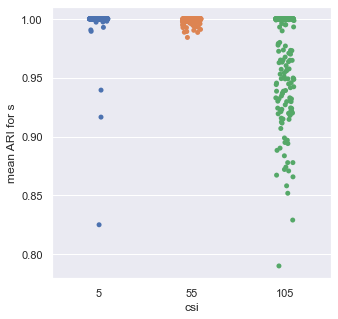

In [269]:
scatt_plot_mean_ari_s(mult_ari_m4_spectral_csi_5,mult_ari_m4_spectral_csi_55,mult_ari_m4_spectral_csi_105)

In [289]:
c_m4_csi=hamm_z(sim_m4_spectral_csi_5[0]['z'],data_m4_csi_5['z'])
c2_m4_csi=hamm_z(sim_m4_spectral_csi_55[0]['z'],data_m4_csi_55['z'])
c3_m4_csi=hamm_z(sim_m4_spectral_csi_105[0]['z'],data_m4_csi_105['z'])

100%|██████████| 200/200 [03:29<00:00,  1.05s/it]


In [290]:
with open('./simul_results/varying_csi/model_4/res_model_4_csi_5_Hamm_z.pkl','wb') as file:
    pickle.dump(c_m4_csi,file,protocol=pickle.HIGHEST_PROTOCOL)
with open('./simul_results/varying_csi/model_4/res_model_4_csi_55_Hamm_z.pkl','wb') as file:
    pickle.dump(c2_m4_csi,file,protocol=pickle.HIGHEST_PROTOCOL)
with open('./simul_results/varying_csi/model_4/res_model_4_csi_105_Hamm_z.pkl','wb') as file:
    pickle.dump(c3_m4_csi,file,protocol=pickle.HIGHEST_PROTOCOL)

In [22]:
###################################################
# ---------------- Load data HAMM ---------------- #
###################################################
with open('./simul_results/varying_csi/model_4/res_model_4_csi_5_Hamm_z.pkl','rb') as file:
    c_m4_csi=pickle.load(file)
with open('./simul_results/varying_csi/model_4/res_model_4_csi_55_Hamm_z.pkl','rb') as file:
    c2_m4_csi=pickle.load(file)
with open('./simul_results/varying_csi/model_4/res_model_4_csi_105_Hamm_z.pkl','rb') as file:
    c3_m4_csi=pickle.load(file)

Text(0.5, 1.0, 'Model 4, csi 105')

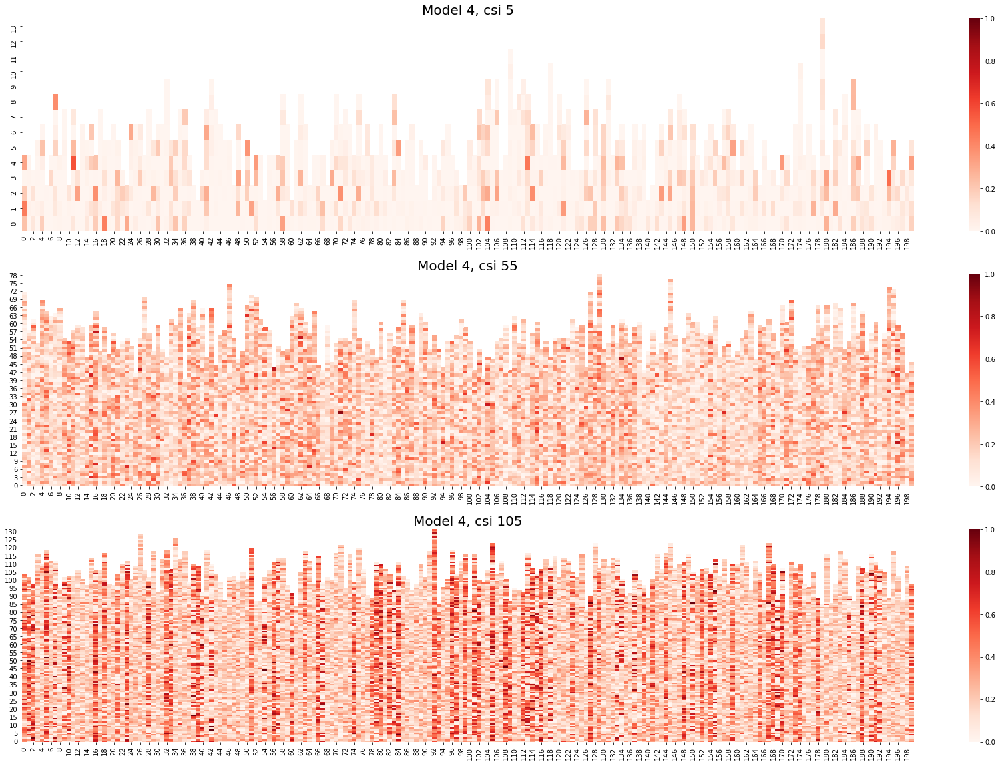

In [23]:
fig,axes = plt.subplots(3,1,figsize=(30,20))

visual_heatmap(c_m4_csi, ax=axes[0])
visual_heatmap(c2_m4_csi, ax=axes[1])
visual_heatmap(c3_m4_csi, ax=axes[2])

axes[0].set_title("Model 4, csi 5", fontsize=20)
axes[1].set_title("Model 4, csi 55", fontsize=20)
axes[2].set_title("Model 4, csi 105", fontsize=20)

# Data with fixed structure

## Varying N, M

### Model 1

In [8]:
# VARYING M 
# Simulation results for both Gensim and Custom init
var_M_model1={}
var_M_model1_custom={}
var_M=np.array(range(5,131,25))
for i in var_M:
    with open(f'./simul_results/fixed_structure/var_M/model_1/res_model_1_M_{str(i)}.pkl','rb') as file:     
        var_M_model1[f'M_{str(i)}']=pickle.load(file)
    with open(f'./simul_results/fixed_structure/var_M/model_1/res_model_1_M_{str(i)}_custom.pkl','rb') as file:     
        var_M_model1_custom[f'M_{str(i)}']=pickle.load(file)

In [9]:
# VARYING N
# Simulation results for both Gensim and Custom init
var_N_model1={}
var_N_model1_custom={}
var_N=np.array(range(5,131,25))
for i in var_N:
    with open(f'./simul_results/fixed_structure/var_N/model_1/res_model_1_N_{str(i)}.pkl','rb') as file:     
        var_N_model1[f'N_{str(i)}']=pickle.load(file)
    with open(f'./simul_results/fixed_structure/var_N/model_1/res_model_1_N_{str(i)}_custom.pkl','rb') as file:     
        var_N_model1_custom[f'N_{str(i)}']=pickle.load(file)

In [10]:
# VARYING D
# Simulation results for both Gensim and Custom init
var_D_model1={}
var_D_model1_custom={}
var_D=np.array(range(50,1051,200))
for i in var_D:
    with open(f'./simul_results/fixed_structure/var_D/model_1/res_model_1_D_{str(i)}.pkl','rb') as file:     
        var_D_model1[f'D_{str(i)}']=pickle.load(file)
    with open(f'./simul_results/fixed_structure/var_D/model_1/res_model_1_D_{str(i)}_custom.pkl','rb') as file:     
        var_D_model1_custom[f'D_{str(i)}']=pickle.load(file)

In [11]:
# Additional : VARYING D
# Simulation results
var_D_2=np.array(range(100,201,50))
for i in var_D_2:
    with open(f'./simul_results/fixed_structure/var_D/model_1/res_model_1_D_{str(i)}_custom.pkl','rb') as file:     
        var_D_model1_custom[f'D_{str(i)}']=pickle.load(file)

In [12]:
# VARYING M
# Simulated data
var_M_model1_data={}
for i in var_M:
    with open(f'./simulated_data/fixed_structure/var_M/model_1/data_m1_M_{str(i)}.pkl','rb') as file:     
        var_M_model1_data[f'M_{str(i)}']=pickle.load(file)

In [13]:
# VARYING N
# Simulated data
var_N_model1_data={}
for i in var_N:
    with open(f'./simulated_data/fixed_structure/var_N/model_1/data_m1_N_{str(i)}.pkl','rb') as file:     
        var_N_model1_data[f'N_{str(i)}']=pickle.load(file)

In [14]:
# VARYING D
# Simulated data
var_D_model1_data={}
for i in var_D:
    with open(f'./simulated_data/fixed_structure/var_D/model_1/data_m1_D_{str(i)}.pkl','rb') as file:     
        var_D_model1_data[f'D_{str(i)}']=pickle.load(file)

In [15]:
# Additional : VARYING D
# Simulated data
for i in var_D_2:
    with open(f'./simulated_data/fixed_structure/var_D/model_1/data_m1_D_{str(i)}.pkl','rb') as file:     
        var_D_model1_data[f'D_{str(i)}']=pickle.load(file)

In [19]:
#var_M_model1_custom['M_130'][0]['change_t_counter']

In [17]:
def scatt_plot_ari_t_fs_comb(sim_res_dic_M=None,data_dic_M=None,sim_res_dic_N=None,data_dic_N=None,sim_res_dic_D=None,
                             data_dic_D=None,var_list=None,var_D=None,D_case=False,ax = None):
    ''' D_case False: create side by side stripplot for varying sizes of M,N and fixed all other parameters
        D_case True: create strip plot for varying # of docs and all other param fixed'''
    sns.set(font_scale=1)
    if D_case:
        ari_list_D=list()
        size_D=list()
        for i in var_D:
            ari_list_D.extend(ari_trace_fun(data_dic_D[f'D_{str(i)}']['t'],sim_res_dic_D[f'D_{str(i)}'][0]['t']))
            size_D.extend(np.repeat(int(i),len(sim_res_dic_D[f'D_{str(i)}'][0]['t'])))
        df=pd.DataFrame([ari_list_D,size_D]).T
        df.columns=["ARI for t","documents"]
        g = sns.stripplot(x="documents", y="ARI for t",data=df, ax = ax)
    else:
        ari_list_M=list()
        word_size_M=list()
        struct_type_M=list()
        ari_list_N=list()
        word_size_N=list()
        struct_type_N=list()
        #for j in var_type:
        for i in var_list:
            ari_list_M.extend(ari_trace_fun(data_dic_M[f'M_{str(i)}']['t'],sim_res_dic_M[f'M_{str(i)}'][0]['t']))
            word_size_M.extend(np.repeat(i*10,len(sim_res_dic_M[f'M_{str(i)}'][0]['t'])))
            struct_type_M.extend(np.repeat('var M, fixed N=10',len(sim_res_dic_M[f'M_{str(i)}'][0]['t'])))
        for i in var_list:
            ari_list_N.extend(ari_trace_fun(data_dic_N[f'N_{str(i)}']['t'],sim_res_dic_N[f'N_{str(i)}'][0]['t']))
            word_size_N.extend(np.repeat(i*10,len(sim_res_dic_N[f'N_{str(i)}'][0]['t'])))
            struct_type_N.extend(np.repeat('var N, fixed M=10',len(sim_res_dic_N[f'N_{str(i)}'][0]['t'])))
        ari_list=ari_list_M+ari_list_N
        word_size=word_size_M+word_size_N
        struct_type=struct_type_M+struct_type_N
        df=pd.DataFrame([ari_list,word_size,struct_type]).T
        df.columns=["ARI for t","words","structure"]
        g = sns.stripplot(x="words", y="ARI for t", hue="structure",data=df, ax = ax,dodge=True)
        plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
    return g

In [18]:
def chains_plot_ari_t_fs_comb(results,data,case,ax,x_ax):
    p=ari_trace_fun(data['t'],results[0]['t'])
    if x_ax:        
        g = pd.DataFrame(p).plot(xlabel = "itearations",ylabel="ARI for t",title=case,ax=ax)
        g.set_xticks([])
        g.set_xlabel('')
        g.get_legend().remove()
    else:
        g = pd.DataFrame(p).plot(xlabel = "itearations",ylabel="ARI for t",title=case,ax=ax)
        #g.set_xticks(np.array(range(1,1000,1))) 
        g.get_legend().remove()
    return g


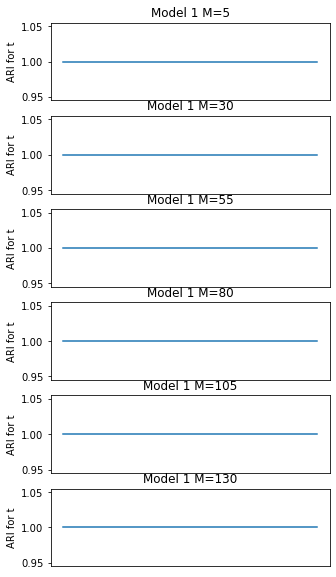

In [19]:
fig,axes = plt.subplots(6,1,figsize=(5,10))
x_ax1=np.concatenate((np.repeat("True",5),np.array(["False"])))
for num, i in enumerate(var_M):
    test=chains_plot_ari_t_fs_comb(var_M_model1_custom[f'M_{str(i)}'],var_M_model1_data[f'M_{str(i)}'],f"Model 1 M={str(i)}",
                                   ax=axes[num],x_ax=x_ax1[num])
    

[Text(0.5, 1.0, 'Gensim init')]

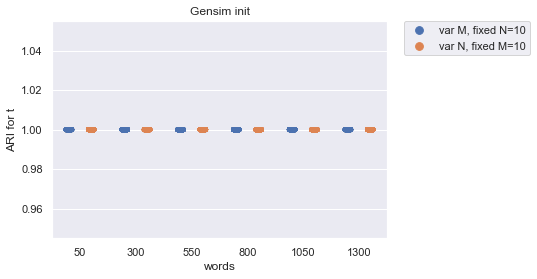

In [25]:
fig = scatt_plot_ari_t_fs_comb(sim_res_dic_M=var_M_model1,data_dic_M=var_M_model1_data,sim_res_dic_N=var_N_model1,
                         data_dic_N=var_N_model1_data,var_list=var_M)
fig.set(title='Gensim init')

[Text(0.5, 1.0, 'Custom init')]

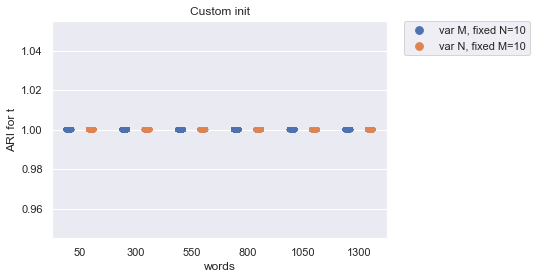

In [27]:
fig=scatt_plot_ari_t_fs_comb(sim_res_dic_M=var_M_model1_custom,data_dic_M=var_M_model1_data,sim_res_dic_N=var_N_model1_custom,
                         data_dic_N=var_N_model1_data,var_list=var_M)
fig.set(title='Custom init')

[Text(0.5, 1.0, 'Gensim init')]

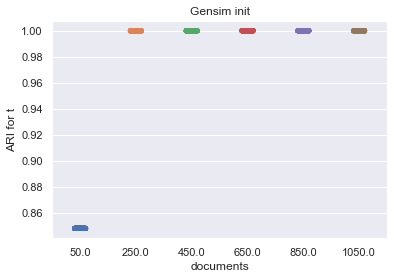

In [29]:
fig=scatt_plot_ari_t_fs_comb(sim_res_dic_D=var_D_model1,data_dic_D=var_D_model1_data,var_D=var_D,D_case=True)
fig.set(title='Gensim init')

[Text(0.5, 1.0, 'Custom init')]

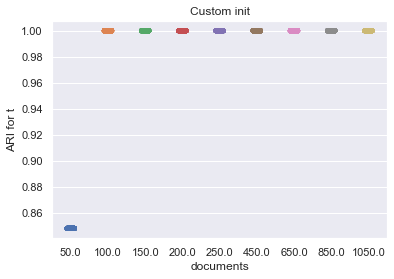

In [43]:
var_D_all=np.concatenate((np.array(range(50,250,50)),np.array(range(250,1051,200))))
fig=scatt_plot_ari_t_fs_comb(sim_res_dic_D=var_D_model1_custom,data_dic_D=var_D_model1_data,var_D=var_D_all,D_case=True)
fig.set(title='Custom init')

### Model 2

In [83]:
# Simulation results for both Gensim and Custom init
var_M_model2={}
var_N_model2={}
var_M_model2_custom={}
var_N_model2_custom={}
var=np.array(range(5,131,25))
for i in var:
    with open(f'./simul_results/fixed_structure/var_M/model_2/res_model_2_M_{str(i)}_custom.pkl','rb') as file:     
        var_M_model2_custom[f'M_{str(i)}']=pickle.load(file)
    with open(f'./simul_results/fixed_structure/var_N/model_2/res_model_2_N_{str(i)}_custom.pkl','rb') as file:     
        var_N_model2_custom[f'N_{str(i)}']=pickle.load(file)
    with open(f'./simul_results/fixed_structure/var_M/model_2/res_model_2_M_{str(i)}.pkl','rb') as file:     
        var_M_model2[f'M_{str(i)}']=pickle.load(file)
    with open(f'./simul_results/fixed_structure/var_N/model_2/res_model_2_N_{str(i)}.pkl','rb') as file:     
        var_N_model2[f'N_{str(i)}']=pickle.load(file)

In [84]:
#### MH step for label z test ####
with open(f'./simul_results/fixed_structure/var_M/model_2/res_model_2_M_105_gensim_MH_label_z.pkl','rb') as file:     
    test=pickle.load(file)

In [85]:
test[1]

{'data_dir': './simulated_data/fixed_structure/var_M/model_2/data_m2_M_105.pkl',
 'K': 20,
 'H': 0,
 'V': 0,
 'fixed_H': True,
 'fixed_K': True,
 'fixed_V': True,
 'secondary_topic': True,
 'command_level_topics': False,
 'gamma': 1.0,
 'eta': 1.0,
 'alpha': 1.0,
 'alpha_zero': 1.0,
 'tau': 1.0,
 'iterations': 100000,
 'burn': 10000,
 'size': 10,
 'verbose': True,
 'calc_ll': True,
 'rand_alloc': False,
 'jupy_out': False,
 'return_t': True,
 'return_s': False,
 'return_z': True,
 'thinning': 100,
 'return_change_t': True,
 'return_change_s': False,
 'return_change_z': True,
 'mod_init': 'gensim',
 'chunk': 2000,
 'passes': 100,
 'gen_iter': 1000,
 'eval_step': None,
 'K_init': None,
 'H_init': None,
 'save_dir': './simul_results/fixed_structure/var_M/model_2/res_model_2_M_105_gensim_MH_label_z.pkl'}

In [4]:
# VARYING D for both Gensim and Custom init
# Simulation results
var_D_model2={}
var_D_model2_custom={}
var_D=np.array(range(50,1051,200))
for i in var_D:
    with open(f'./simul_results/fixed_structure/var_D/model_2/res_model_2_D_{str(i)}_custom.pkl','rb') as file:     
        var_D_model2_custom[f'D_{str(i)}']=pickle.load(file)
    with open(f'./simul_results/fixed_structure/var_D/model_2/res_model_2_D_{str(i)}.pkl','rb') as file:     
        var_D_model2[f'D_{str(i)}']=pickle.load(file)

In [5]:
# Additional : VARYING D
# Simulation results
var_D_2=np.array(range(100,201,50))
for i in var_D_2:
    with open(f'./simul_results/fixed_structure/var_D/model_2/res_model_2_D_{str(i)}_custom.pkl','rb') as file:     
        var_D_model2_custom[f'D_{str(i)}']=pickle.load(file)

In [86]:
# Simulated data
var_M_model2_data={}
var_N_model2_data={}
var=np.array(range(5,131,25))
for i in var:
    with open(f'./simulated_data/fixed_structure/var_M/model_2/data_m2_M_{str(i)}.pkl','rb') as file:     
        var_M_model2_data[f'M_{str(i)}']=pickle.load(file)  
    with open(f'./simulated_data/fixed_structure/var_N/model_2/data_m2_N_{str(i)}.pkl','rb') as file:     
        var_N_model2_data[f'N_{str(i)}']=pickle.load(file)

In [7]:
# VARYING D
# Simulated data
var_D_model2_data={}
for i in var_D:
    with open(f'./simulated_data/fixed_structure/var_D/model_2/data_m2_D_{str(i)}.pkl','rb') as file:     
        var_D_model2_data[f'D_{str(i)}']=pickle.load(file)

In [8]:
# Additional : VARYING D
# Simulated data
for i in var_D_2:
    with open(f'./simulated_data/fixed_structure/var_D/model_2/data_m2_D_{str(i)}.pkl','rb') as file:     
        var_D_model2_data[f'D_{str(i)}']=pickle.load(file)

In [161]:
prop_test=1-var_N_model2_data['N_5']['z'][0][0]

In [9]:
var_N_model2_data['N_5']['z']

{0: {0: array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1]),
  1: array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1]),
  2: array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1]),
  3: array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1]),
  4: array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1])},
 1: {0: array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1]),
  1: array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1]),
  2: array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1]),
  3: array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1]),
  4: array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1])},
 2: {0: array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1]),
  1: array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1]),
  2: array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1]),
  3: array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1]),
  4: array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1])},
 3: {0: array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1]),
  1: array([1, 1, 0, 1, 1, 1, 1, 1, 1, 1]),
  2: array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1]),
  3: array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1]),
  4: array([1, 1, 1, 1, 1, 0, 1, 1, 1, 1])},
 4: {0: array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1]),
  1: array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1]),
  2: array([1

In [184]:
copy_test=var_N_model2_data['N_5']['z'].copy()

In [189]:
id(var_N_model2_data['N_5']['z'])

140267729377408

In [188]:
id(copy_test)

140268927325632

In [190]:
copy_test2=var_N_model2_data['N_5']['z']

In [163]:
prop_test

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0])

In [19]:
var_M_model2.keys()

dict_keys(['M_5', 'M_30', 'M_55', 'M_80', 'M_105', 'M_130'])

In [140]:
var_N_model2['N_5'][0]['z'][199][0]

array([[1, 1, 1, ..., 1, 1, 1],
       [1, 1, 1, ..., 1, 1, 1],
       [1, 1, 1, ..., 1, 1, 1],
       ...,
       [1, 1, 1, ..., 1, 1, 1],
       [1, 1, 1, ..., 1, 1, 1],
       [1, 1, 1, ..., 1, 1, 1]])

In [143]:
test=np.random.choice(np.unique(var_N_model2['N_5'][0]['t'][999]))

In [144]:
test

12

In [150]:
np.where(var_N_model2['N_5'][0]['t'][999]==test)[0]

array([ 58, 150])

In [154]:
var_N_model2['N_5'][0]['t'][999]

array([13, 13,  0, 13,  1,  9,  9, 13, 13,  1,  1,  0,  0,  0,  0,  0,  9,
        0, 13,  1, 13,  1,  0,  9,  9, 13,  0,  1,  9, 13, 13,  9, 13, 13,
       13,  0,  0,  0,  1,  0,  0,  0, 13,  0, 13, 13,  1,  1,  1,  1,  1,
       13,  9,  1,  1,  1,  9, 13, 12,  9, 13,  9, 13,  0,  1,  0, 13,  9,
        9,  1,  0, 13,  1, 13, 13, 13,  1,  1,  0,  9,  1,  0,  0,  1, 13,
        0,  9, 13,  9,  9, 13,  0,  1, 13, 13,  0,  0,  9,  1,  0,  1,  9,
        0, 13,  9,  0, 13,  0,  0,  9,  1, 13,  9, 13,  9, 13,  9, 13, 13,
        1, 13, 13, 13,  0, 13,  9,  1,  0,  9,  0,  9, 13,  9,  1, 13, 13,
        1, 13,  0,  1,  0, 13,  9,  9,  1,  9, 13,  0,  0, 13, 12, 13, 13,
       13,  0,  0, 13,  1,  1,  0, 13,  0,  1,  0,  1,  9,  0, 13,  9, 13,
        0,  0,  9,  9, 13, 13, 13,  0, 13,  0, 13, 13,  9,  1,  1,  9, 13,
       13,  1,  0,  9,  9,  9,  0, 13, 13,  0, 13,  0,  1])

In [109]:
np.random.choice(10, size=100)

array([1, 6, 8, 1, 9, 2, 7, 0, 9, 8, 8, 3, 1, 4, 3, 2, 0, 2, 9, 7, 2, 4,
       1, 5, 0, 6, 0, 3, 8, 5, 2, 1, 1, 3, 9, 6, 4, 0, 0, 1, 0, 0, 2, 6,
       8, 9, 8, 6, 5, 9, 5, 3, 3, 2, 0, 3, 5, 3, 0, 2, 0, 8, 3, 1, 9, 8,
       0, 2, 1, 8, 2, 3, 4, 2, 1, 7, 3, 4, 0, 7, 6, 5, 3, 6, 2, 0, 8, 6,
       0, 3, 0, 0, 1, 1, 9, 0, 2, 3, 6, 6])

In [192]:
test_W = np.zeros(shape=(3, 8), dtype=int)    

In [193]:
test_W

array([[0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0]])

In [198]:
test_W[1]=np.array([1,2,3,4,5,6,7,8])

In [199]:
test_W

array([[0, 0, 0, 0, 0, 0, 0, 0],
       [1, 2, 3, 4, 5, 6, 7, 8],
       [0, 0, 0, 0, 0, 0, 0, 0]])

In [204]:
t=Counter(var_M_model2_data['M_5']['w'][0][1])

In [211]:
t

Counter({33: 1, 29: 4})

In [212]:
for v in t:
    print(t[v])

1
4


In [31]:
np.random.binomial(1,0.8)

0

In [43]:
#var_M_model2_custom['M_5'][0]['change_t_counter']

In [17]:
test[0]['t']

array([[10,  4, 10, ...,  4,  4, 16],
       [10,  4, 10, ...,  4,  4, 16],
       [10,  4, 10, ...,  4,  4, 16],
       ...,
       [10,  4, 10, ...,  4,  4, 16],
       [10,  4, 10, ...,  4,  4, 16],
       [10,  4, 10, ...,  4,  4, 16]])

<AxesSubplot:title={'center':'Model 2'}, xlabel='itearations', ylabel='ARI'>

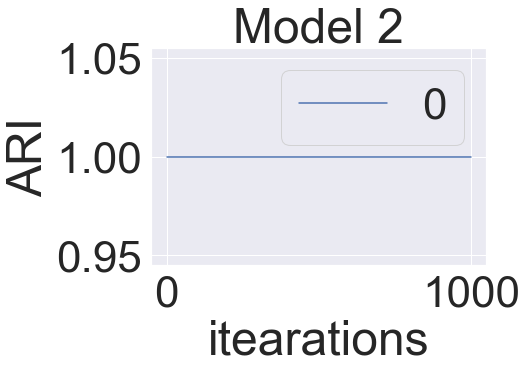

In [87]:
ari_trace2=ari_trace_fun(var_M_model2_data['M_105']['t'],test[0]['t'])
pd.DataFrame(ari_trace2).plot(xlabel = "itearations",ylabel="ARI",title="Model 2")

[Text(0.5, 1.0, 'Gensim init')]

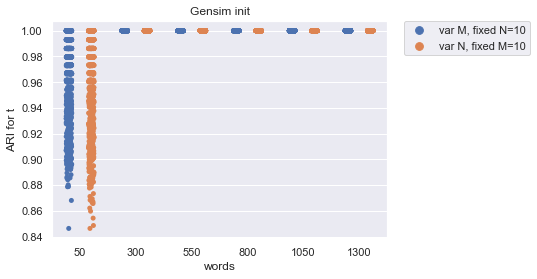

In [40]:
g=scatt_plot_ari_t_fs_comb(sim_res_dic_M=var_M_model2,data_dic_M=var_M_model2_data,sim_res_dic_N=var_N_model2,
                         data_dic_N=var_N_model2_data,var_list=var_M)
g.set(title="Gensim init")

[Text(0.5, 1.0, 'Custom init')]

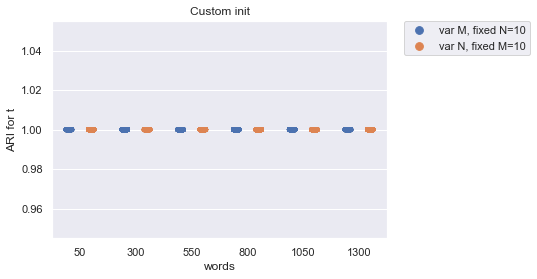

In [41]:
g=scatt_plot_ari_t_fs_comb(sim_res_dic_M=var_M_model2_custom,data_dic_M=var_M_model2_data,sim_res_dic_N=var_N_model2_custom,
                         data_dic_N=var_N_model2_data,var_list=var_M)
g.set(title="Custom init")

[Text(0.5, 1.0, 'Gensim init')]

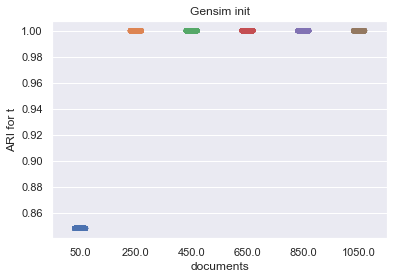

In [42]:
g=scatt_plot_ari_t_fs_comb(sim_res_dic_D=var_D_model2,data_dic_D=var_D_model2_data,var_D=var_D,D_case=True)
g.set(title="Gensim init")

[Text(0.5, 1.0, 'Custom init')]

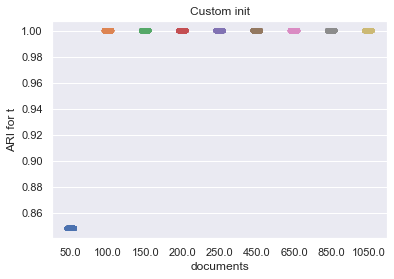

In [44]:
var_D_all=np.concatenate((np.array(range(50,250,50)),np.array(range(250,1051,200))))
g=scatt_plot_ari_t_fs_comb(sim_res_dic_D=var_D_model2_custom,data_dic_D=var_D_model2_data,var_D=var_D_all,D_case=True)
g.set(title="Custom init")

In [34]:
'''c_m2_M_5=hamm_z(var_M_model2['M_5'][0]['z'],var_M_model2_data['M_5']['z'])
c_m2_M_30=hamm_z(var_M_model2['M_30'][0]['z'],var_M_model2_data['M_30']['z'])
c_m2_M_55=hamm_z(var_M_model2['M_55'][0]['z'],var_M_model2_data['M_55']['z'])
c_m2_M_80=hamm_z(var_M_model2['M_80'][0]['z'],var_M_model2_data['M_80']['z'])
c_m2_M_105=hamm_z(var_M_model2['M_105'][0]['z'],var_M_model2_data['M_105']['z'])
c_m2_M_130=hamm_z(var_M_model2['M_130'][0]['z'],var_M_model2_data['M_130']['z'])'''

100%|██████████| 200/200 [00:21<00:00,  9.48it/s]


In [36]:
'''with open('./simul_results/fixed_structure/var_M/model_2/res_model_2_M_5_Hamm_z_custom.pkl','wb') as file:
    pickle.dump(c_m2_M_5,file,protocol=pickle.HIGHEST_PROTOCOL)
with open('./simul_results/fixed_structure/var_M/model_2/res_model_2_M_30_Hamm_z_custom.pkl','wb') as file:
    pickle.dump(c_m2_M_30,file,protocol=pickle.HIGHEST_PROTOCOL)
with open('./simul_results/fixed_structure/var_M/model_2/res_model_2_M_55_Hamm_z_custom.pkl','wb') as file:
    pickle.dump(c_m2_M_55,file,protocol=pickle.HIGHEST_PROTOCOL)
with open('./simul_results/fixed_structure/var_M/model_2/res_model_2_M_80_Hamm_z_custom.pkl','wb') as file:
    pickle.dump(c_m2_M_80,file,protocol=pickle.HIGHEST_PROTOCOL)
with open('./simul_results/fixed_structure/var_M/model_2/res_model_2_M_105_Hamm_z_custom.pkl','wb') as file:
    pickle.dump(c_m2_M_105,file,protocol=pickle.HIGHEST_PROTOCOL)
with open('./simul_results/fixed_structure/var_M/model_2/res_model_2_M_130_Hamm_z_custom.pkl','wb') as file:
    pickle.dump(c_m2_M_130,file,protocol=pickle.HIGHEST_PROTOCOL)'''

In [29]:
'''c_m2_N_5=hamm_z(var_N_model2['N_5'][0]['z'],var_N_model2_data['N_5']['z'])
c_m2_N_30=hamm_z(var_N_model2['N_30'][0]['z'],var_N_model2_data['N_30']['z'])
c_m2_N_55=hamm_z(var_N_model2['N_55'][0]['z'],var_N_model2_data['N_55']['z'])
c_m2_N_80=hamm_z(var_N_model2['N_80'][0]['z'],var_N_model2_data['N_80']['z'])
c_m2_N_105=hamm_z(var_N_model2['N_105'][0]['z'],var_N_model2_data['N_105']['z'])
c_m2_N_130=hamm_z(var_N_model2['N_130'][0]['z'],var_N_model2_data['N_130']['z'])'''

100%|██████████| 200/200 [04:10<00:00,  1.25s/it]


In [90]:
# Calculated Hamming for z for Custom and Gensim results under var M case
var_M_m2_hamm={}
var_M_m2_hamm_custom={}
for i in var_M:
    with open(f'./simul_results/fixed_structure/var_M/model_2/res_model_2_M_{str(i)}_Hamm_z.pkl','rb') as file:     
        var_M_m2_hamm[f'M_{str(i)}']=pickle.load(file)
    with open(f'./simul_results/fixed_structure/var_M/model_2/res_model_2_M_{str(i)}_Hamm_z_custom.pkl','rb') as file:     
        var_M_m2_hamm_custom[f'M_{str(i)}']=pickle.load(file)

NameError: name 'var_M' is not defined

In [52]:
var_M_m2_ari_z={}
for i in var_M:
    with open(f'./simul_results/fixed_structure/var_M/model_2/res_model_2_M_{str(i)}_ari_z.pkl','rb') as file:     
        var_M_m2_ari_z[f'M_{str(i)}']=pickle.load(file)

In [46]:
# Calculated Hamming for z for Custom and Gensim results under var N case
var_N_m2_hamm={}
var_N_m2_hamm_custom={}
for i in var_N:
    with open(f'./simul_results/fixed_structure/var_N/model_2/res_model_2_N_{str(i)}_Hamm_z.pkl','rb') as file:     
        var_N_m2_hamm[f'N_{str(i)}']=pickle.load(file)
    with open(f'./simul_results/fixed_structure/var_N/model_2/res_model_2_N_{str(i)}_Hamm_z_custom.pkl','rb') as file:     
        var_N_m2_hamm_custom[f'N_{str(i)}']=pickle.load(file)

In [25]:
def visual_heatmap(dic,ax = None): # argument dic is the dictionary with values the mean Hamming for each command from post draws
    df = pd.DataFrame(dic)
    sns.set(font_scale=2)
    g = sns.heatmap(df, cmap="Reds", annot=False, ax=ax,vmin=0, vmax=1)
    #g.figure.axes[-1].set_yticklabels(g.get_yticks(),size=15)
    g.invert_yaxis()
    #g.set_yticklabels(g.get_yticks(), size = 10)
    #g.set_xticks(g.get_yticks(), size = 5)
    #g.set_xticklabels(g.get_xmajorticklabels(), fontsize = 18)
    return g

In [65]:
'''fig,axes = plt.subplots(6,1,figsize=(30,30))
visual_heatmap(var_M_m2_ari_z['M_5'],ax=axes[0])
visual_heatmap(var_M_m2_ari_z['M_30'],ax=axes[1])
visual_heatmap(var_M_m2_ari_z['M_55'],ax=axes[2])
visual_heatmap(var_M_m2_ari_z['M_80'],ax=axes[3])
visual_heatmap(var_M_m2_ari_z['M_105'],ax=axes[4])
visual_heatmap(var_M_m2_ari_z['M_130'],ax=axes[5])
axes[0].set_title("Model 2, M 5", fontsize=20)
axes[1].set_title("Model 2, M 30", fontsize=20)
axes[2].set_title("Model 2, M 55", fontsize=20)
axes[3].set_title("Model 2, M 80", fontsize=20)
axes[4].set_title("Model 2, M 105", fontsize=20)
axes[5].set_title("Model 2, M 130", fontsize=20)
fig.tight_layout()'''

'fig,axes = plt.subplots(6,1,figsize=(30,30))\nvisual_heatmap(var_M_m2_ari_z[\'M_5\'],ax=axes[0])\nvisual_heatmap(var_M_m2_ari_z[\'M_30\'],ax=axes[1])\nvisual_heatmap(var_M_m2_ari_z[\'M_55\'],ax=axes[2])\nvisual_heatmap(var_M_m2_ari_z[\'M_80\'],ax=axes[3])\nvisual_heatmap(var_M_m2_ari_z[\'M_105\'],ax=axes[4])\nvisual_heatmap(var_M_m2_ari_z[\'M_130\'],ax=axes[5])\naxes[0].set_title("Model 2, M 5", fontsize=20)\naxes[1].set_title("Model 2, M 30", fontsize=20)\naxes[2].set_title("Model 2, M 55", fontsize=20)\naxes[3].set_title("Model 2, M 80", fontsize=20)\naxes[4].set_title("Model 2, M 105", fontsize=20)\naxes[5].set_title("Model 2, M 130", fontsize=20)\nfig.tight_layout()'

In [88]:
def doc_posit_high_Hamm(dic,cond): 
    '''function for detecting docs for which size of Hamm for z high'''
    mean_val=np.zeros(len(dic))
    ind=0
    for k in dic.values():
        list1=[]
        for l in k.values():
            list1.append(l)
        mean_val[ind]=np.mean(list1)
        ind+=1
    pos=[i for i in range(len(mean_val)) if mean_val[i] > cond]
    return pos

In [89]:
c_m2_M_105=hamm_z(test[0]['z'],var_M_model2_data['M_105']['z'])

100%|██████████| 200/200 [00:20<00:00,  9.62it/s]


In [65]:
test[0]['z'][0][0]

array([[1, 1, 1, ..., 1, 1, 1],
       [1, 1, 1, ..., 1, 1, 1],
       [1, 1, 1, ..., 1, 1, 1],
       ...,
       [1, 1, 1, ..., 1, 1, 1],
       [1, 1, 1, ..., 1, 1, 1],
       [1, 1, 1, ..., 1, 1, 1]])

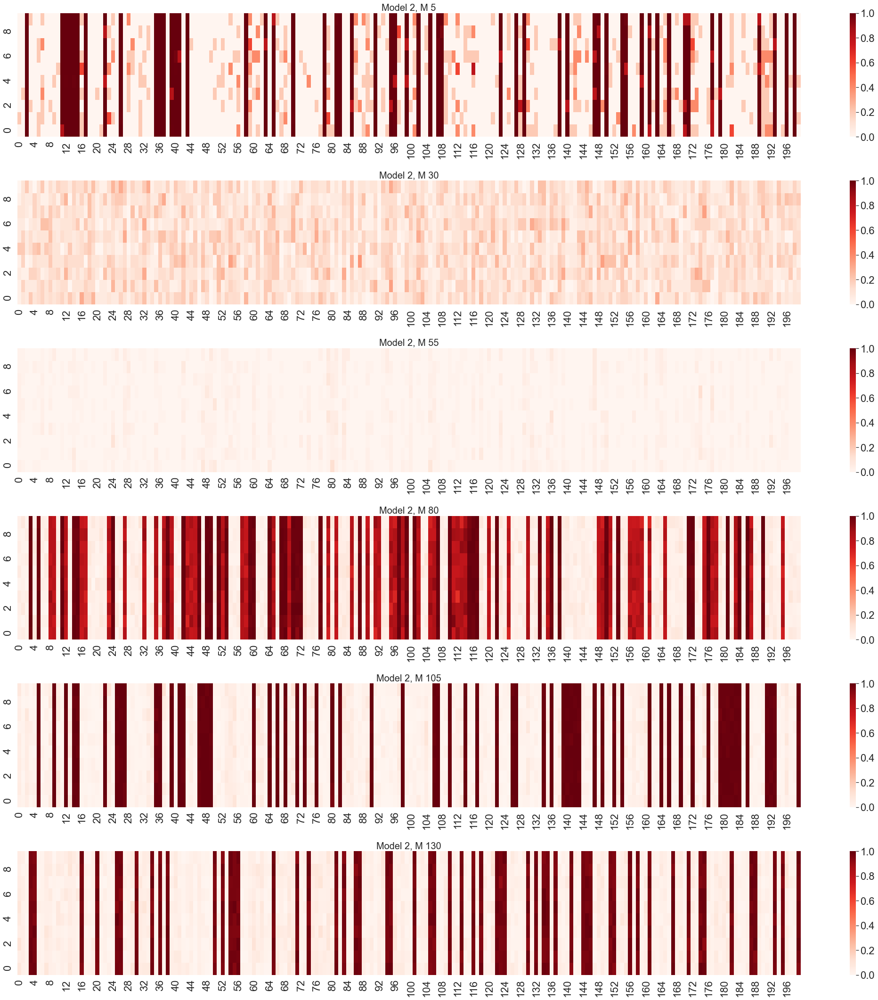

In [61]:
fig,axes = plt.subplots(6,1,figsize=(30,30))
visual_heatmap(var_M_m2_hamm['M_5'],ax=axes[0])
visual_heatmap(var_M_m2_hamm['M_30'],ax=axes[1])
visual_heatmap(var_M_m2_hamm['M_55'],ax=axes[2])
visual_heatmap(var_M_m2_hamm['M_80'],ax=axes[3])
visual_heatmap(var_M_m2_hamm['M_105'],ax=axes[4])
visual_heatmap(var_M_m2_hamm['M_130'],ax=axes[5])
axes[0].set_title("Model 2, M 5", fontsize=20)
axes[1].set_title("Model 2, M 30", fontsize=20)
axes[2].set_title("Model 2, M 55", fontsize=20)
axes[3].set_title("Model 2, M 80", fontsize=20)
axes[4].set_title("Model 2, M 105", fontsize=20)
axes[5].set_title("Model 2, M 130", fontsize=20)
fig.tight_layout()

In [ ]:
# 56 above

In [82]:
np.exp(-26712.405477767934)

0.0

In [67]:
test[0]['z']

{0: {0: array([[1, 1, 1, ..., 1, 1, 1],
         [1, 1, 1, ..., 1, 1, 1],
         [1, 1, 1, ..., 1, 1, 1],
         ...,
         [1, 1, 1, ..., 1, 1, 1],
         [1, 1, 1, ..., 1, 1, 1],
         [1, 1, 1, ..., 1, 1, 1]]),
  1: array([[1, 1, 1, ..., 1, 1, 1],
         [1, 1, 1, ..., 1, 1, 1],
         [1, 1, 1, ..., 1, 1, 1],
         ...,
         [1, 1, 1, ..., 1, 1, 1],
         [1, 1, 1, ..., 1, 1, 1],
         [1, 1, 1, ..., 1, 1, 1]]),
  2: array([[1, 1, 1, ..., 1, 1, 1],
         [1, 1, 1, ..., 1, 1, 1],
         [1, 1, 1, ..., 1, 1, 1],
         ...,
         [1, 1, 1, ..., 1, 1, 1],
         [1, 1, 1, ..., 1, 1, 1],
         [1, 1, 1, ..., 1, 1, 1]]),
  3: array([[1, 1, 1, ..., 1, 1, 1],
         [1, 1, 1, ..., 1, 1, 1],
         [1, 1, 1, ..., 1, 1, 1],
         ...,
         [1, 1, 1, ..., 1, 1, 1],
         [1, 1, 1, ..., 1, 1, 1],
         [1, 1, 1, ..., 1, 1, 1]]),
  4: array([[1, 1, 1, ..., 1, 1, 1],
         [1, 1, 1, ..., 1, 1, 1],
         [1, 1, 1, ..., 1, 1, 1],


<AxesSubplot:>

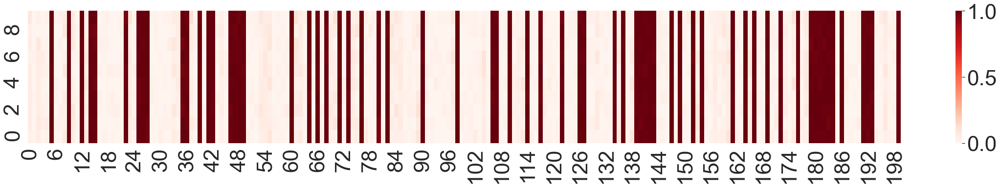

In [79]:
plt.subplots(1,1,figsize=(40,5))
visual_heatmap(c_m2_M_105)

In [39]:
docs=doc_posit_high_Hamm(c_m2_M_105,0.9)

In [49]:
docs

[6,
 17,
 28,
 29,
 32,
 57,
 58,
 77,
 88,
 96,
 102,
 121,
 125,
 133,
 137,
 144,
 146,
 155,
 158,
 173,
 174,
 177,
 187,
 189]

In [56]:
doc_comm_list=doc_comm_posit_high_Hamm(c_m2_M_105,0.9)

In [57]:
for i in doc_comm_list:
    print(var_M_model2_data['M_105']['z'][i[0]][i[1]])

[1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 1 1
 1 1 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
[1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 1 1 1 1 1 1 1 1 0 1 1 1]
[1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
[1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
[1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 

In [55]:
var_M_model2_data['M_105']['z'][0][1]

array([1, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       0, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1])

In [45]:
Counter(var_M_model2_data['M_105']['t'])

Counter({3: 38, 2: 62, 1: 35, 0: 65})

In [ ]:
docs=doc_posit_high_Hamm(var_M_m2_hamm['M_105'],0.9)

In [64]:
var_M_model2_data['M_105']['t'][docs]

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0])

In [7]:
var_M_model2_data['M_105']['t']

array([3, 2, 3, 1, 2, 0, 1, 1, 3, 0, 3, 2, 0, 3, 0, 0, 2, 1, 2, 2, 2, 2,
       0, 3, 2, 0, 0, 0, 1, 1, 2, 2, 1, 3, 3, 0, 0, 3, 2, 0, 2, 0, 0, 2,
       3, 2, 0, 0, 0, 0, 2, 2, 2, 3, 3, 3, 2, 1, 1, 2, 0, 3, 3, 2, 0, 1,
       0, 2, 0, 3, 3, 0, 2, 0, 3, 3, 0, 1, 2, 2, 0, 2, 0, 3, 3, 3, 2, 1,
       1, 3, 0, 2, 2, 2, 2, 1, 1, 3, 0, 2, 2, 2, 1, 2, 3, 2, 0, 0, 2, 1,
       0, 2, 3, 3, 0, 2, 2, 0, 1, 1, 2, 1, 0, 2, 2, 1, 0, 0, 2, 2, 3, 2,
       1, 1, 0, 3, 0, 1, 3, 0, 0, 0, 0, 0, 1, 2, 1, 0, 2, 0, 2, 2, 0, 3,
       0, 1, 2, 3, 1, 3, 3, 0, 2, 2, 0, 3, 0, 2, 2, 0, 2, 1, 0, 1, 1, 3,
       0, 1, 3, 0, 0, 0, 0, 0, 0, 2, 0, 1, 2, 1, 2, 0, 0, 0, 1, 2, 3, 2,
       2, 0])

In [11]:
var_M_model2_data['M_105']['z']

{0: {0: array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1,
         1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
         1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
         1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1,
         1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]),
  1: array([1, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
         1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
         1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
         1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
         0, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1]),
  2: array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1,
         0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1,
         1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1,
         1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 

In [65]:
docs2=doc_posit_high_Hamm(var_M_m2_hamm['M_130'],0.9)

In [84]:
var_M_model2_data['M_130']['t'][docs2]

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0])

In [68]:
var_M_model2_data['M_130']['t']

array([2, 1, 3, 0, 0, 3, 3, 2, 1, 3, 2, 1, 1, 2, 1, 1, 0, 3, 3, 1, 0, 3,
       1, 3, 3, 0, 0, 1, 1, 2, 0, 2, 2, 2, 0, 3, 0, 1, 0, 1, 2, 1, 3, 1,
       2, 3, 1, 3, 3, 3, 0, 1, 0, 3, 0, 0, 0, 3, 3, 1, 2, 1, 2, 3, 3, 0,
       2, 1, 1, 2, 2, 0, 3, 3, 0, 2, 2, 2, 1, 2, 2, 0, 1, 0, 3, 3, 0, 0,
       2, 1, 2, 3, 1, 2, 0, 0, 2, 1, 2, 3, 3, 0, 1, 1, 2, 0, 0, 3, 3, 2,
       0, 1, 1, 0, 3, 3, 0, 1, 0, 1, 3, 2, 0, 0, 0, 1, 1, 1, 3, 1, 0, 1,
       0, 2, 0, 0, 1, 0, 1, 3, 1, 0, 3, 3, 0, 0, 0, 3, 2, 1, 3, 0, 0, 1,
       2, 2, 0, 1, 0, 3, 2, 0, 1, 3, 1, 1, 3, 0, 1, 2, 3, 0, 2, 1, 0, 0,
       2, 3, 2, 1, 2, 2, 0, 1, 3, 3, 1, 0, 0, 2, 3, 1, 3, 0, 3, 0, 2, 3,
       3, 0])

In [71]:
t_0_ind=[i for i in range(len(var_M_model2_data['M_130']['t'])) if var_M_model2_data['M_130']['t'][i]==0]

In [76]:
t_0_ind==docs2


True

In [82]:
Counter(var_M_model2_data['M_130']['t'])

Counter({2: 41, 1: 51, 3: 50, 0: 58})

In [86]:
len(var_M_model2_data['M_130']['t'][docs2])

58

In [77]:
docs3=doc_posit_high_Hamm(var_M_m2_hamm['M_5'],0.9)
docs4=doc_posit_high_Hamm(var_M_m2_hamm['M_80'],0.9)

In [78]:
var_M_model2_data['M_5']['t'][docs3]

array([3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3,
       3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3,
       3, 3, 3, 3, 3, 3, 3, 3, 3, 3])

In [79]:
var_M_model2_data['M_80']['t'][docs4]

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0])

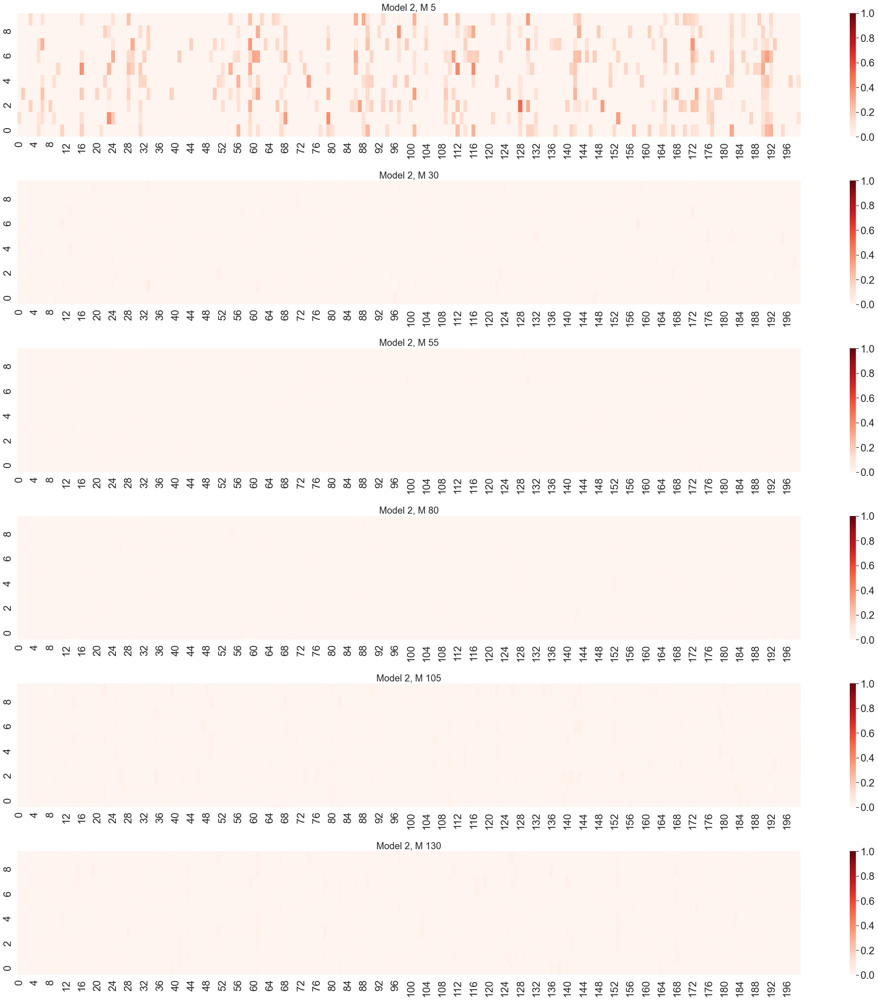

In [80]:
fig,axes = plt.subplots(6,1,figsize=(30,30))
visual_heatmap(var_M_m2_hamm_custom['M_5'],ax=axes[0])
visual_heatmap(var_M_m2_hamm_custom['M_30'],ax=axes[1])
visual_heatmap(var_M_m2_hamm_custom['M_55'],ax=axes[2])
visual_heatmap(var_M_m2_hamm_custom['M_80'],ax=axes[3])
visual_heatmap(var_M_m2_hamm_custom['M_105'],ax=axes[4])
visual_heatmap(var_M_m2_hamm_custom['M_130'],ax=axes[5])
axes[0].set_title("Model 2, M 5", fontsize=20)
axes[1].set_title("Model 2, M 30", fontsize=20)
axes[2].set_title("Model 2, M 55", fontsize=20)
axes[3].set_title("Model 2, M 80", fontsize=20)
axes[4].set_title("Model 2, M 105", fontsize=20)
axes[5].set_title("Model 2, M 130", fontsize=20)
fig.tight_layout()


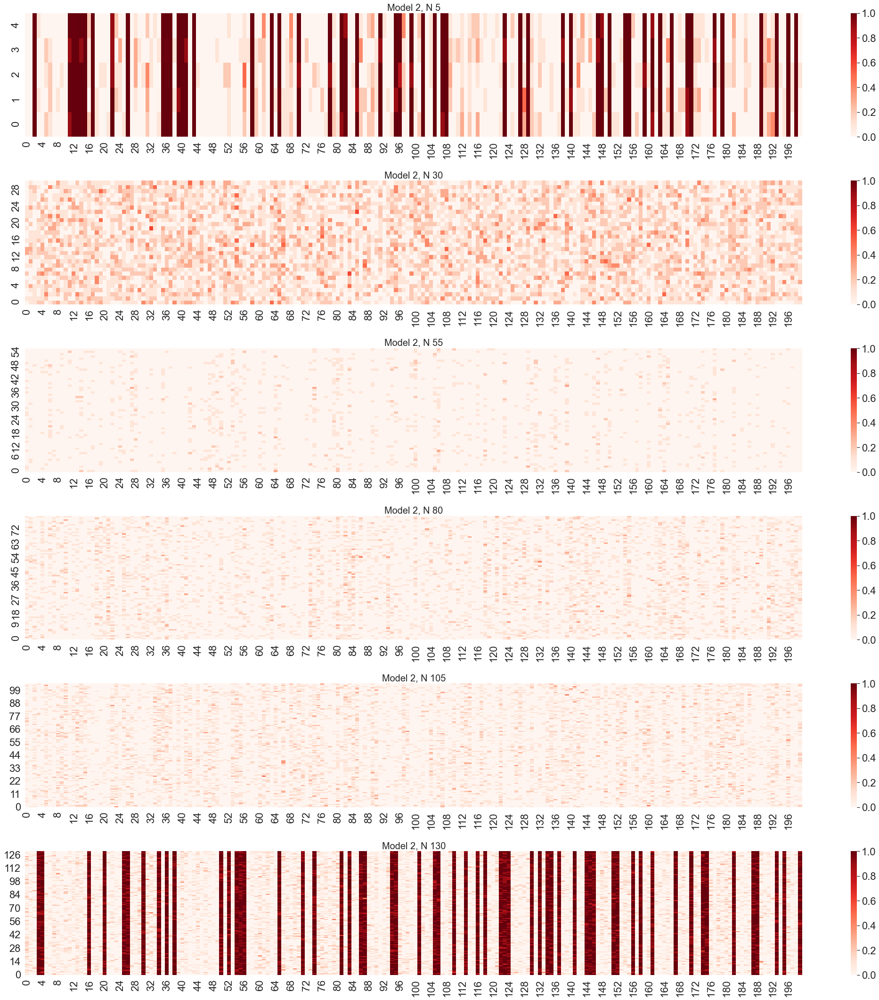

In [87]:
fig,axes = plt.subplots(6,1,figsize=(30,30))
visual_heatmap(var_N_m2_hamm['N_5'],ax=axes[0])
visual_heatmap(var_N_m2_hamm['N_30'],ax=axes[1])
visual_heatmap(var_N_m2_hamm['N_55'],ax=axes[2])
visual_heatmap(var_N_m2_hamm['N_80'],ax=axes[3])
visual_heatmap(var_N_m2_hamm['N_105'],ax=axes[4])
visual_heatmap(var_N_m2_hamm['N_130'],ax=axes[5])
axes[0].set_title("Model 2, N 5", fontsize=20)
axes[1].set_title("Model 2, N 30", fontsize=20)
axes[2].set_title("Model 2, N 55", fontsize=20)
axes[3].set_title("Model 2, N 80", fontsize=20)
axes[4].set_title("Model 2, N 105", fontsize=20)
axes[5].set_title("Model 2, N 130", fontsize=20)
fig.tight_layout()

In [93]:
docs_N=doc_posit_high_Hamm(var_N_m2_hamm['N_130'],0.9)
docs2_N=doc_posit_high_Hamm(var_N_m2_hamm['N_5'],0.9)

In [94]:
var_N_model2_data['N_130']['t'][docs_N]

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0])

In [96]:
var_N_model2_data['N_5']['t'][docs2_N]

array([3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3,
       3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3,
       3, 3, 3, 3, 3, 3, 3, 3, 3, 3])

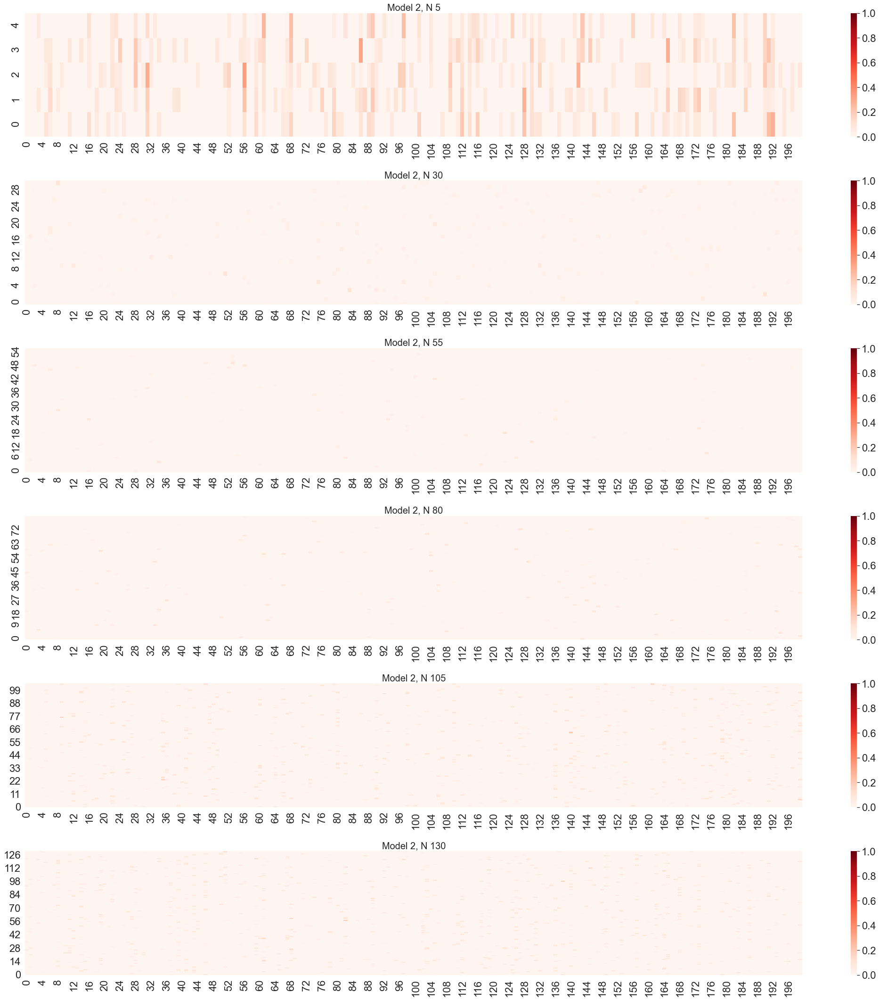

In [88]:
fig,axes = plt.subplots(6,1,figsize=(30,30))
visual_heatmap(var_N_m2_hamm_custom['N_5'],ax=axes[0])
visual_heatmap(var_N_m2_hamm_custom['N_30'],ax=axes[1])
visual_heatmap(var_N_m2_hamm_custom['N_55'],ax=axes[2])
visual_heatmap(var_N_m2_hamm_custom['N_80'],ax=axes[3])
visual_heatmap(var_N_m2_hamm_custom['N_105'],ax=axes[4])
visual_heatmap(var_N_m2_hamm_custom['N_130'],ax=axes[5])
axes[0].set_title("Model 2, N 5", fontsize=20)
axes[1].set_title("Model 2, N 30", fontsize=20)
axes[2].set_title("Model 2, N 55", fontsize=20)
axes[3].set_title("Model 2, N 80", fontsize=20)
axes[4].set_title("Model 2, N 105", fontsize=20)
axes[5].set_title("Model 2, N 130", fontsize=20)
fig.tight_layout()

#### Checking document 123 

In [33]:
var_N_m2_hamm['N_130'][123]

{0: 1.0,
 1: 1.0,
 2: 1.0,
 3: 1.0,
 4: 1.0,
 5: 1.0,
 6: 1.0,
 7: 0.9000000000000002,
 8: 1.0,
 9: 1.0,
 10: 1.0,
 11: 0.6999999999999998,
 12: 1.0,
 13: 1.0,
 14: 1.0,
 15: 1.0,
 16: 1.0,
 17: 1.0,
 18: 1.0,
 19: 1.0,
 20: 0.9000000000000002,
 21: 0.9000000000000002,
 22: 1.0,
 23: 1.0,
 24: 0.9000000000000002,
 25: 1.0,
 26: 1.0,
 27: 1.0,
 28: 0.8000000000000002,
 29: 1.0,
 30: 1.0,
 31: 1.0,
 32: 0.8000000000000002,
 33: 1.0,
 34: 0.9000000000000002,
 35: 0.9000000000000002,
 36: 0.9000000000000002,
 37: 0.9000000000000002,
 38: 1.0,
 39: 1.0,
 40: 0.9000000000000002,
 41: 1.0,
 42: 1.0,
 43: 1.0,
 44: 1.0,
 45: 0.8000000000000002,
 46: 1.0,
 47: 0.9000000000000002,
 48: 1.0,
 49: 0.9939,
 50: 1.0,
 51: 1.0,
 52: 1.0,
 53: 1.0,
 54: 1.0,
 55: 1.0,
 56: 1.0,
 57: 0.9000000000000002,
 58: 1.0,
 59: 0.9000000000000002,
 60: 1.0,
 61: 1.0,
 62: 1.0,
 63: 1.0,
 64: 0.9000000000000002,
 65: 0.9000000000000002,
 66: 0.9000000000000002,
 67: 0.8000000000000002,
 68: 0.9000000000000002,
 6

In [ ]:
c_m2_N_130=hamm_z(var_N_model2['N_130'][0]['z'],var_N_model2_data['N_130']['z'])

In [34]:
var_N_model2_data['N_130']['z'][123]

{0: array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1]),
 1: array([0, 1, 1, 1, 1, 1, 1, 1, 1, 1]),
 2: array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1]),
 3: array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1]),
 4: array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1]),
 5: array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1]),
 6: array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1]),
 7: array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1]),
 8: array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1]),
 9: array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1]),
 10: array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1]),
 11: array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1]),
 12: array([0, 1, 1, 1, 1, 1, 1, 1, 1, 1]),
 13: array([1, 1, 1, 0, 1, 1, 1, 1, 0, 1]),
 14: array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1]),
 15: array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1]),
 16: array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1]),
 17: array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1]),
 18: array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1]),
 19: array([1, 1, 1, 1, 1, 1, 0, 1, 1, 1]),
 20: array([1, 1, 1, 0, 1, 1, 1, 1, 1, 1]),
 21: array([1, 1, 1, 1, 1, 1, 1, 1, 1, 0]),
 22: array([0, 1, 1, 1, 1, 1, 1, 1, 1, 1])

In [35]:
var_N_model2['N_130'][0]['z'][123]

{0: array([[0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        ...,
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0]]),
 1: array([[1, 0, 0, ..., 0, 0, 0],
        [1, 0, 0, ..., 0, 0, 0],
        [1, 0, 0, ..., 0, 0, 0],
        ...,
        [1, 0, 0, ..., 0, 0, 0],
        [1, 0, 0, ..., 0, 0, 0],
        [1, 0, 0, ..., 0, 0, 0]]),
 2: array([[0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        ...,
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0]]),
 3: array([[0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        ...,
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0]]),
 4: array([[0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        ...,
        [0, 0, 0, ...

In [36]:
var_N_model2_data['N_130']['z'][4]

{0: array([1, 1, 1, 1, 1, 1, 0, 1, 1, 1]),
 1: array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1]),
 2: array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1]),
 3: array([1, 1, 1, 1, 1, 1, 1, 0, 1, 1]),
 4: array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1]),
 5: array([0, 1, 1, 1, 1, 1, 0, 1, 1, 1]),
 6: array([1, 1, 1, 0, 1, 1, 1, 1, 1, 1]),
 7: array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1]),
 8: array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1]),
 9: array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1]),
 10: array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1]),
 11: array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1]),
 12: array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1]),
 13: array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1]),
 14: array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1]),
 15: array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1]),
 16: array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1]),
 17: array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1]),
 18: array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1]),
 19: array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1]),
 20: array([1, 1, 1, 1, 1, 1, 1, 0, 1, 1]),
 21: array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1]),
 22: array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1])

In [37]:
var_N_model2['N_130'][0]['z'][4]

{0: array([[0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        ...,
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0]]),
 1: array([[0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        ...,
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0]]),
 2: array([[1, 1, 0, ..., 1, 0, 0],
        [1, 1, 0, ..., 1, 0, 0],
        [1, 1, 0, ..., 1, 0, 0],
        ...,
        [1, 1, 0, ..., 1, 0, 0],
        [1, 1, 0, ..., 1, 0, 0],
        [1, 1, 0, ..., 1, 0, 0]]),
 3: array([[0, 0, 1, ..., 0, 0, 0],
        [0, 0, 1, ..., 0, 0, 0],
        [0, 0, 1, ..., 0, 0, 0],
        ...,
        [0, 0, 1, ..., 0, 0, 0],
        [0, 0, 1, ..., 0, 0, 0],
        [0, 0, 1, ..., 0, 0, 0]]),
 4: array([[0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        ...,
        [0, 0, 0, ...

In [167]:
'''c_m2_D_50=hamm_z(var_D_model2_custom['D_50'][0]['z'],var_D_model2_data['D_50']['z'])
c_m2_D_250=hamm_z(var_D_model2_custom['D_250'][0]['z'],var_D_model2_data['D_250']['z'])
c_m2_D_450=hamm_z(var_D_model2_custom['D_450'][0]['z'],var_D_model2_data['D_450']['z'])
c_m2_D_650=hamm_z(var_D_model2_custom['D_650'][0]['z'],var_D_model2_data['D_650']['z'])
c_m2_D_850=hamm_z(var_D_model2_custom['D_850'][0]['z'],var_D_model2_data['D_850']['z'])
c_m2_D_1050=hamm_z(var_D_model2_custom['D_1050'][0]['z'],var_D_model2_data['D_1050']['z'])'''

100%|██████████| 1050/1050 [01:41<00:00, 10.30it/s]


In [169]:
'''with open('./simul_results/fixed_structure/var_D/model_2/res_model_2_D_50_Hamm_z_custom.pkl','wb') as file:
    pickle.dump(c_m2_D_50,file,protocol=pickle.HIGHEST_PROTOCOL)
with open('./simul_results/fixed_structure/var_D/model_2/res_model_2_D_250_Hamm_z_custom.pkl','wb') as file:
    pickle.dump(c_m2_D_250,file,protocol=pickle.HIGHEST_PROTOCOL)
with open('./simul_results/fixed_structure/var_D/model_2/res_model_2_D_450_Hamm_z_custom.pkl','wb') as file:
    pickle.dump(c_m2_D_450,file,protocol=pickle.HIGHEST_PROTOCOL)
with open('./simul_results/fixed_structure/var_D/model_2/res_model_2_D_650_Hamm_z_custom.pkl','wb') as file:
    pickle.dump(c_m2_D_650,file,protocol=pickle.HIGHEST_PROTOCOL)
with open('./simul_results/fixed_structure/var_D/model_2/res_model_2_D_850_Hamm_z_custom.pkl','wb') as file:
    pickle.dump(c_m2_D_850,file,protocol=pickle.HIGHEST_PROTOCOL)
with open('./simul_results/fixed_structure/var_D/model_2/res_model_2_D_1050_Hamm_z_custom.pkl','wb') as file:
    pickle.dump(c_m2_D_1050,file,protocol=pickle.HIGHEST_PROTOCOL)'''

In [97]:
# Load Hamm for z for sim results for var D for both Gensim and Custom
var_D_m2_hamm={}
var_D_m2_hamm_custom={}
for i in var_D:
    with open(f'./simul_results/fixed_structure/var_D/model_2/res_model_2_D_{str(i)}_Hamm_z.pkl','rb') as file:     
        var_D_m2_hamm[f'D_{str(i)}']=pickle.load(file)
    with open(f'./simul_results/fixed_structure/var_D/model_2/res_model_2_D_{str(i)}_Hamm_z_custom.pkl','rb') as file:     
        var_D_m2_hamm_custom[f'D_{str(i)}']=pickle.load(file)

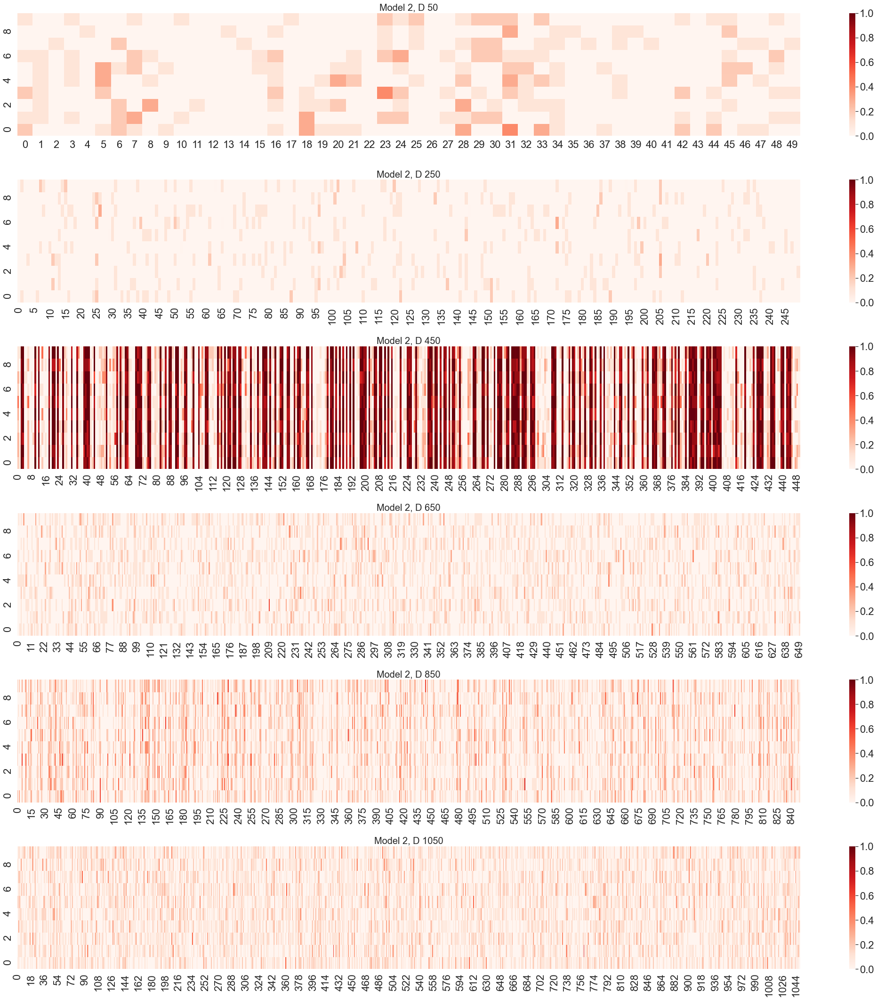

In [98]:
fig,axes = plt.subplots(6,1,figsize=(30,30))
visual_heatmap(var_D_m2_hamm['D_50'],ax=axes[0])
visual_heatmap(var_D_m2_hamm['D_250'],ax=axes[1])
visual_heatmap(var_D_m2_hamm['D_450'],ax=axes[2])
visual_heatmap(var_D_m2_hamm['D_650'],ax=axes[3])
visual_heatmap(var_D_m2_hamm['D_850'],ax=axes[4])
visual_heatmap(var_D_m2_hamm['D_1050'],ax=axes[5])
axes[0].set_title("Model 2, D 50", fontsize=20)
axes[1].set_title("Model 2, D 250", fontsize=20)
axes[2].set_title("Model 2, D 450", fontsize=20)
axes[3].set_title("Model 2, D 650", fontsize=20)
axes[4].set_title("Model 2, D 850", fontsize=20)
axes[5].set_title("Model 2, D 1050", fontsize=20)
fig.tight_layout()

In [100]:
docs_D=doc_posit_high_Hamm(var_D_m2_hamm['D_450'],0.9)

In [101]:
var_D_model2_data['D_450']['t'][docs_D]

array([2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2])

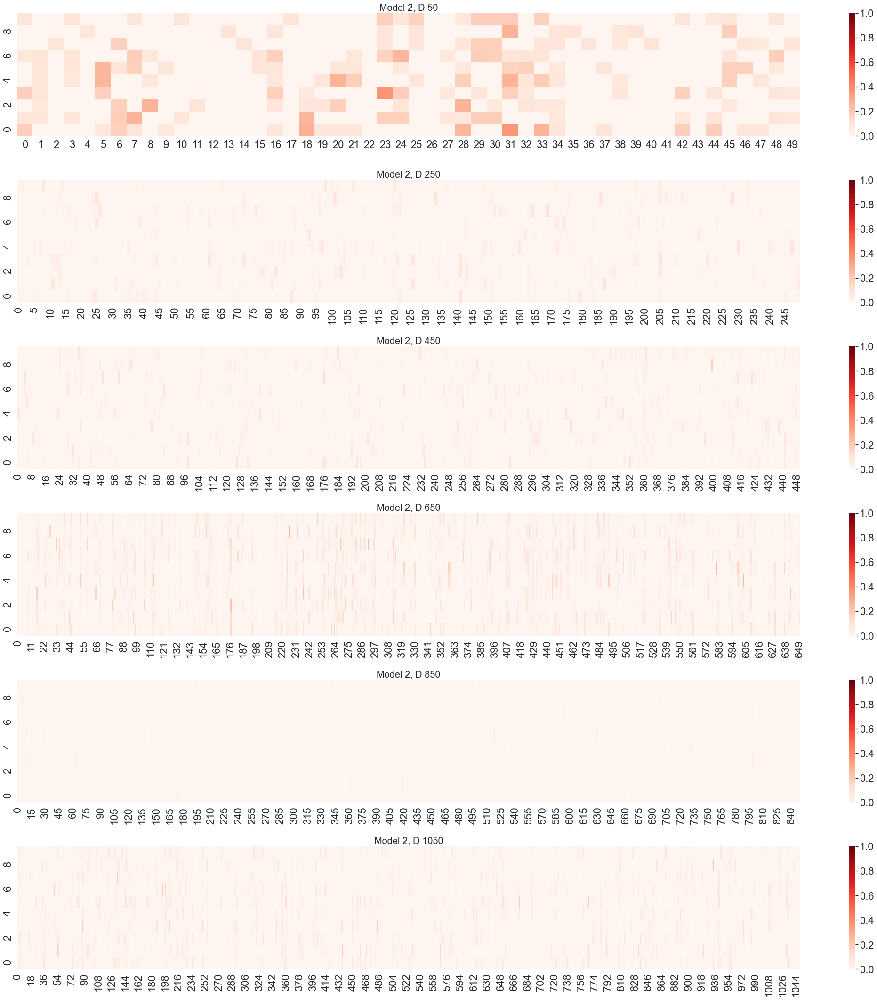

In [99]:
fig,axes = plt.subplots(6,1,figsize=(30,30))
visual_heatmap(var_D_m2_hamm_custom['D_50'],ax=axes[0])
visual_heatmap(var_D_m2_hamm_custom['D_250'],ax=axes[1])
visual_heatmap(var_D_m2_hamm_custom['D_450'],ax=axes[2])
visual_heatmap(var_D_m2_hamm_custom['D_650'],ax=axes[3])
visual_heatmap(var_D_m2_hamm_custom['D_850'],ax=axes[4])
visual_heatmap(var_D_m2_hamm_custom['D_1050'],ax=axes[5])
axes[0].set_title("Model 2, D 50", fontsize=20)
axes[1].set_title("Model 2, D 250", fontsize=20)
axes[2].set_title("Model 2, D 450", fontsize=20)
axes[3].set_title("Model 2, D 650", fontsize=20)
axes[4].set_title("Model 2, D 850", fontsize=20)
axes[5].set_title("Model 2, D 1050", fontsize=20)
fig.tight_layout()

#### Likelihood

In [34]:
test=var_M_model2_custom['M_105'][0]['loglik']

<AxesSubplot:xlabel='itearations', ylabel='log likelihood'>

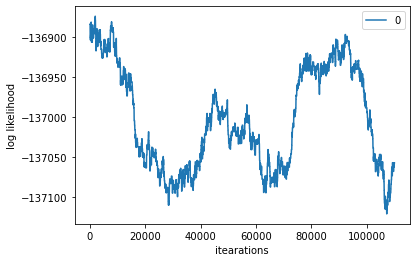

In [35]:
pd.DataFrame(test).plot(xlabel = "itearations",ylabel="log likelihood")

<AxesSubplot:xlabel='itearations', ylabel='log likelihood'>

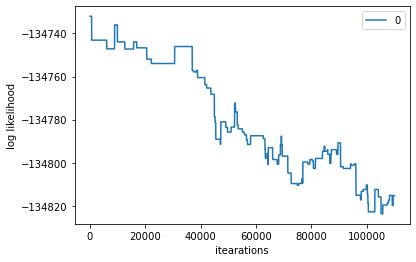

In [36]:
test2=var_M_model2['M_105'][0]['loglik']
pd.DataFrame(test2).plot(xlabel = "itearations",ylabel="log likelihood")

In [37]:
test_new=np.array(test)/np.array(test2)

<AxesSubplot:xlabel='itearations', ylabel='log likelihood'>

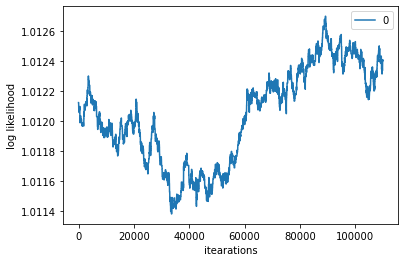

In [42]:
pd.DataFrame(test_new).plot(xlabel = "itearations",ylabel="log likelihood")

<AxesSubplot:xlabel='itearations', ylabel='log likelihood'>

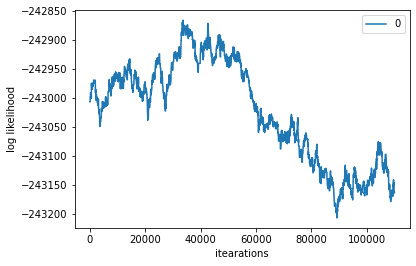

In [43]:
test=var_N_model2_custom['N_130'][0]['loglik']
pd.DataFrame(test).plot(xlabel = "itearations",ylabel="log likelihood")

<AxesSubplot:xlabel='itearations', ylabel='log likelihood'>

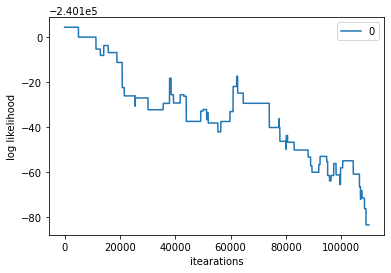

In [44]:
test2=var_N_model2['N_130'][0]['loglik']
pd.DataFrame(test2).plot(xlabel = "itearations",ylabel="log likelihood")

<AxesSubplot:xlabel='itearations', ylabel='log likelihood'>

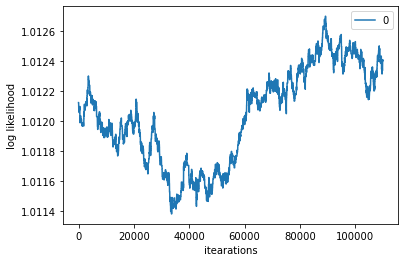

In [41]:
test_new=np.array(test)/np.array(test2)
pd.DataFrame(test_new).plot(xlabel = "itearations",ylabel="log likelihood")

### Model 3

In [4]:
# Simulation results for both Gensim and Custom init
var_M_model3={}
var_N_model3={}
var_M_model3_custom={}
var_N_model3_custom={}
var=np.array(range(5,131,25))
for i in var:
    with open(f'./simul_results/fixed_structure/var_M/model_3/res_model_3_M_{str(i)}_custom.pkl','rb') as file:     
        var_M_model3_custom[f'M_{str(i)}']=pickle.load(file)
    with open(f'./simul_results/fixed_structure/var_N/model_3/res_model_3_N_{str(i)}_custom.pkl','rb') as file:     
        var_N_model3_custom[f'N_{str(i)}']=pickle.load(file)
    with open(f'./simul_results/fixed_structure/var_M/model_3/res_model_3_M_{str(i)}.pkl','rb') as file:     
        var_M_model3[f'M_{str(i)}']=pickle.load(file)
    with open(f'./simul_results/fixed_structure/var_N/model_3/res_model_3_N_{str(i)}.pkl','rb') as file:     
        var_N_model3[f'N_{str(i)}']=pickle.load(file)

In [5]:
# VARYING D for both Gensim and Custom init
# Simulation results
var_D_model3={}
var_D_model3_custom={}
var_D=np.array(range(50,1051,200))
for i in var_D:
    with open(f'./simul_results/fixed_structure/var_D/model_3/res_model_3_D_{str(i)}_custom.pkl','rb') as file:     
        var_D_model3_custom[f'D_{str(i)}']=pickle.load(file)
    with open(f'./simul_results/fixed_structure/var_D/model_3/res_model_3_D_{str(i)}.pkl','rb') as file:     
        var_D_model3[f'D_{str(i)}']=pickle.load(file)

In [72]:
'''for i in var_M:
    print(i)
    print(var_N_model3[f'N_{str(i)}'][1])'''

"for i in var_M:\n    print(i)\n    print(var_N_model3[f'N_{str(i)}'][1])"

In [104]:
var_M_model3['M_30'][0]['change_s_counter']

array([15,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,
        0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,
        0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,
        0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,
        0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,
        0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,
        0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,
        0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,
        0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,
        0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,
        0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,
        0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,
        0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,
        0,  0,  0,  0,  0

In [105]:
var_M_model3_custom['M_5'][0]['change_t_counter']

array([3873,   39,   35,   34,   37,   35,   39,   39,   38,   46,   37,
         42,   41,   37,   52,   41,   39,   35,   28,   36,   34,   46,
         46,   33,   39,   38,   33,   36,   39,   38,   40,   40,   40,
         37,   40,   40,   40,   47,   31,   39,   39,   37,   46,   31,
         38,   36,   39,   39,   32,   44,   38,   35,   45,   40,   41,
         36,   46,   30,   43,   48,   37,   36,   38,   36,   41,   43,
         41,   38,   42,   42,   34,   46,   36,   38,   37,   44,   37,
         37,   35,   39,   48,   44,   38,   47,   35,   33,   41,   36,
         40,   42,   38,   43,   34,   43,   26,   42,   44,   34,   37,
         44,   31,   32,   38,   32,   38,   34,   46,   34,   40,   41,
         33,   35,   47,   48,   43,   37,   34,   40,   35,   37,   34,
         41,   40,   38,   32,   28,   38,   33,   41,   33,   41,   43,
         39,   48,   35,   40,   37,   45,   44,   34,   43,   35,   38,
         27,   41,   32,   45,   46,   44,   29,   

In [60]:
for i in range(len(var_M_model3['M_30'][0]['t'])):
    print(i,adjusted_rand_score(var_M_model3['M_30'][0]['t'][i],var_M_model3_data['M_30']['t']))

0 0.00927032256317202
1 0.009504420646671893
2 0.005277346124441968
3 0.008393157099776527
4 0.005118495732635287
5 0.010308279270806204
6 0.00820762098792179
7 0.006563630426951068
8 0.006563630426951068
9 0.009951062587443806
10 0.006563630426951068
11 0.006563630426951068
12 0.006563630426951068
13 0.006563630426951068
14 0.005118495732635287
15 0.006563630426951068
16 0.005118495732635287
17 0.00820762098792179
18 0.0076889011244217495
19 0.004991214421776234
20 0.005480740190436212
21 0.004449081207231271
22 0.0064561659193890265
23 0.002830093532233512
24 0.006563630426951068
25 0.011249317160499872
26 0.005118495732635287
27 0.006563630426951068
28 0.004238742465997114
29 0.005118495732635287
30 0.008393157099776527
31 0.004159146923627692
32 0.006491933929793062
33 0.005118495732635287
34 0.004057862079921463
35 0.008269529432614595
36 0.010606679009756901
37 0.00800984614626545
38 0.005932379855472288
39 0.008269529432614595
40 0.011236181943103376
41 0.006563630426951068
42 0

394 0.0076889011244217495
395 0.006575600697498034
396 0.006971113000868869
397 0.004238742465997114
398 0.008393157099776527
399 0.006934919970995108
400 0.00800984614626545
401 0.005637474086452379
402 0.005118495732635287
403 0.006563630426951068
404 0.00927032256317202
405 0.003911010782837032
406 0.003989515471484494
407 0.002830093532233512
408 0.0055087742582278455
409 0.00927032256317202
410 0.0076889011244217495
411 0.00464312972581127
412 0.00927032256317202
413 0.008393157099776527
414 0.006491933929793062
415 0.011236181943103376
416 0.006934919970995108
417 0.005118495732635287
418 0.009951062587443806
419 0.008393157099776527
420 0.006563630426951068
421 0.002830093532233512
422 0.004057862079921463
423 0.005153329996424853
424 0.010346995723407757
425 0.011605725155348932
426 0.005118495732635287
427 0.008393157099776527
428 0.006563630426951068
429 0.006563630426951068
430 0.006575600697498034
431 0.011236181943103376
432 0.00927032256317202
433 0.008306323823477239
434

739 0.006802673849356875
740 0.013586175392000792
741 0.006563630426951068
742 0.005265699450242094
743 0.006563630426951068
744 0.005118495732635287
745 0.005118495732635287
746 0.008393157099776527
747 0.009419078575710811
748 0.008269529432614595
749 0.013463195159597497
750 0.004214874667098816
751 0.006491933929793062
752 0.008899906185027222
753 0.006563630426951068
754 0.006563630426951068
755 0.011236181943103376
756 0.006563630426951068
757 0.010606679009756901
758 0.010346995723407757
759 0.006575600697498034
760 0.005118495732635287
761 0.011236181943103376
762 0.006563630426951068
763 0.008393157099776527
764 0.008393157099776527
765 0.00927032256317202
766 0.005118495732635287
767 0.006563630426951068
768 0.008788896005312885
769 0.006563630426951068
770 0.006563630426951068
771 0.009951062587443806
772 0.010606679009756901
773 0.00927032256317202
774 0.013586175392000792
775 0.011236181943103376
776 0.006575600697498034
777 0.005118495732635287
778 0.011236181943103376
77

In [106]:
# Simulated data
var_M_model3_data={}
var_N_model3_data={}
for i in var:
    with open(f'./simulated_data/fixed_structure/var_M/model_3/data_m3_M_{str(i)}.pkl','rb') as file:     
        var_M_model3_data[f'M_{str(i)}']=pickle.load(file)  
    with open(f'./simulated_data/fixed_structure/var_N/model_3/data_m3_N_{str(i)}.pkl','rb') as file:     
        var_N_model3_data[f'N_{str(i)}']=pickle.load(file)

In [108]:
# VARYING D
# Simulated data
var_D_model3_data={}
for i in var_D:
    with open(f'./simulated_data/fixed_structure/var_D/model_3/data_m3_D_{str(i)}.pkl','rb') as file:     
        var_D_model3_data[f'D_{str(i)}']=pickle.load(file)

[Text(0.5, 1.0, 'Gensim init')]

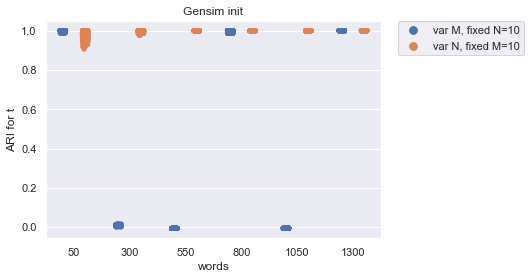

In [109]:
f=scatt_plot_ari_t_fs_comb(sim_res_dic_M=var_M_model3,data_dic_M=var_M_model3_data,sim_res_dic_N=var_N_model3,
                         data_dic_N=var_N_model3_data,var_list=var_M)
f.set(title="Gensim init")

[Text(0.5, 1.0, 'Custom init')]

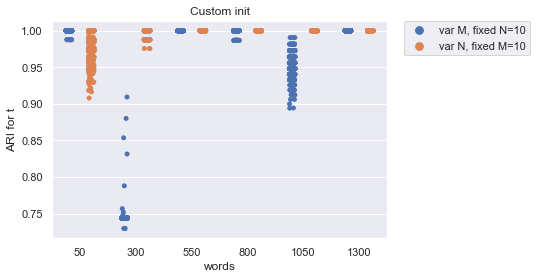

In [110]:
f=scatt_plot_ari_t_fs_comb(sim_res_dic_M=var_M_model3_custom,data_dic_M=var_M_model3_data,sim_res_dic_N=var_N_model3_custom,
                         data_dic_N=var_N_model3_data,var_list=var_M)
f.set(title="Custom init")

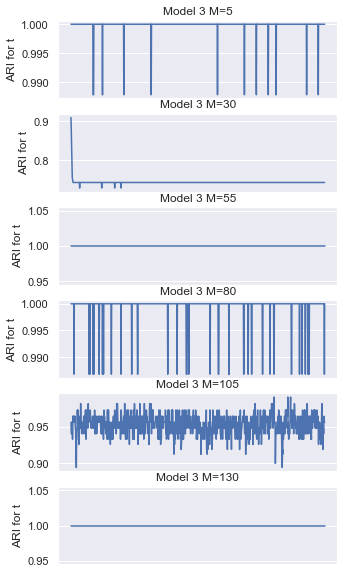

In [111]:
fig,axes = plt.subplots(6,1,figsize=(5,10))
x_ax1=np.concatenate((np.repeat("True",5),np.array(["False"])))
for num, i in enumerate(var_M):
    test=chains_plot_ari_t_fs_comb(var_M_model3_custom[f'M_{str(i)}'],var_M_model3_data[f'M_{str(i)}'],f"Model 3 M={str(i)}",
                                   ax=axes[num],x_ax=x_ax1[num])
    

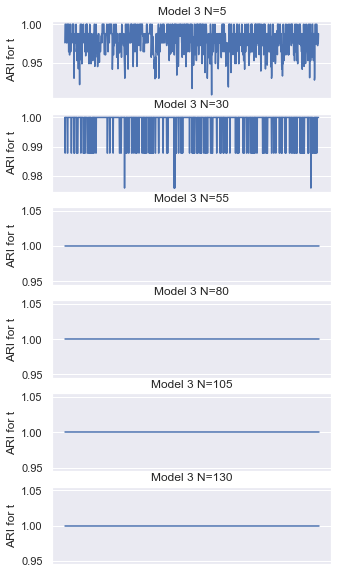

In [112]:
fig,axes = plt.subplots(6,1,figsize=(5,10))
x_ax1=np.concatenate((np.repeat("True",5),np.array(["False"])))
for num, i in enumerate(var_M):
    test=chains_plot_ari_t_fs_comb(var_N_model3_custom[f'N_{str(i)}'],var_N_model3_data[f'N_{str(i)}'],f"Model 3 N={str(i)}",
                                   ax=axes[num],x_ax=x_ax1[num])
    

In [78]:
var_M_model3['M_30'][0]['change_t_counter']

array([2362,   25,   24,   25,   22,   22,   28,   28,   33,   42,   28,
         39,   27,   41,   40,   36,   33,   41,   34,   38,   39,   31,
         41,   39,   40,   44,   39,   50,   43,   39,   26,   33,   35,
         38,   36,   39,   35,   31,   40,   41,   34,   38,   37,   41,
         41,   31,   42,   38,   44,   34,   43,   36,   43,   46,   38,
         38,   39,   43,   37,   42,   43,   37,   40,   39,   40,   48,
         38,   28,   49,   37,   34,   37,   32,   38,   47,   38,   46,
         45,   40,   39,   41,   38,   37,   45,   36,   40,   34,   41,
         39,   38,   38,   44,   38,   40,   30,   28,   41,   39,   32,
         38,   38,   42,   37,   30,   31,   41,   37,   36,   35,   46,
         33,   35,   44,   40,   35,   38,   48,   39,   39,   33,   36,
         40,   42,   38,   43,   37,   40,   40,   36,   39,   38,   43,
         39,   42,   46,   33,   35,   35,   39,   40,   44,   41,   41,
         47,   42,   32,   44,   39,   36,   29,   

[Text(0.5, 1.0, 'Gensim Init')]

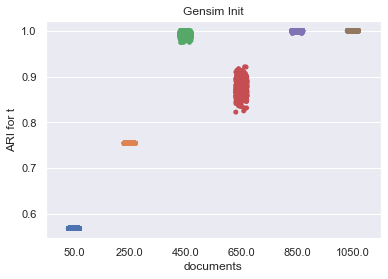

In [114]:
f=scatt_plot_ari_t_fs_comb(sim_res_dic_D=var_D_model3,data_dic_D=var_D_model3_data,var_D=var_D,D_case=True)
f.set(title="Gensim Init")

[Text(0.5, 1.0, 'Custom Init')]

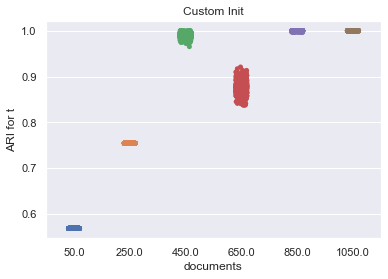

In [115]:
f=scatt_plot_ari_t_fs_comb(sim_res_dic_D=var_D_model3_custom,data_dic_D=var_D_model3_data,var_D=var_D,D_case=True)
f.set(title="Custom Init")

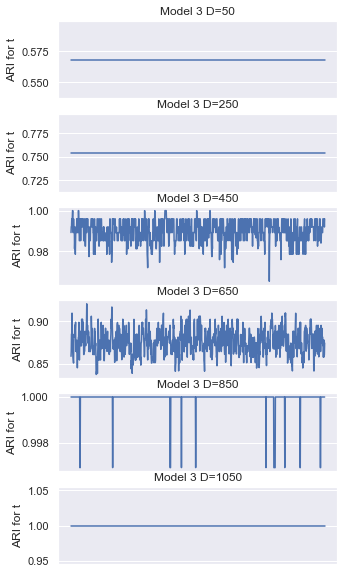

In [116]:
fig,axes = plt.subplots(6,1,figsize=(5,10))
x_ax1=np.concatenate((np.repeat("True",5),np.array(["False"])))
for num, i in enumerate(var_D):
    test=chains_plot_ari_t_fs_comb(var_D_model3_custom[f'D_{str(i)}'],var_D_model3_data[f'D_{str(i)}'],f"Model 3 D={str(i)}",
                                   ax=axes[num],x_ax=x_ax1[num])
    

In [75]:
(var_D_model3['D_650'][0]['t'][42]==var_D_model3['D_650'][0]['t'][43]).all()

False

In [205]:
'''import tqdm
mult_ari_m3_N_130=np.zeros(shape=(len(var_N_model3_data['N_130']['s']),len(var_N_model3['N_130'][0]['t'])))
for i in tqdm.tqdm(range(len(var_N_model3_data['N_130']['s']))):
    mult_ari_m3_N_130[i]=ari_trace_fun(var_N_model3_data['N_130']['s'][i],var_N_model3['N_130'][0]['s'][i])'''

100%|██████████| 200/200 [01:01<00:00,  3.25it/s]


In [117]:
def run_ari_s(case,var_M_model3_data,var_M_model3): # case: string
    mult_ari_m3_M=np.zeros(shape=(len(var_M_model3_data[case]['s']),len(var_M_model3[case][0]['t'])))
    for i in tqdm.tqdm(range(len(var_M_model3_data[case]['s']))):
        mult_ari_m3_M[i]=ari_trace_fun(var_M_model3_data[case]['s'][i],var_M_model3[case][0]['s'][i])
    with open(f'./simul_results/fixed_structure/var_N/model_3/res_model_3_{case}_ARI_s_custom.pkl','wb') as file:
        pickle.dump(mult_ari_m3_M,file,protocol=pickle.HIGHEST_PROTOCOL)


In [87]:
'''run_ari_s('M_30',var_M_model3_data,var_M_model3)
run_ari_s('M_5',var_M_model3_data,var_M_model3)'''

100%|██████████| 200/200 [01:02<00:00,  3.22it/s]


In [91]:
'''run_ari_s('N_5',var_N_model3_data,var_N_model3)
run_ari_s('N_30',var_N_model3_data,var_N_model3)
run_ari_s('N_55',var_N_model3_data,var_N_model3)
run_ari_s('N_80',var_N_model3_data,var_N_model3)
run_ari_s('N_105',var_N_model3_data,var_N_model3)
run_ari_s('N_130',var_N_model3_data,var_N_model3)'''

100%|██████████| 200/200 [01:03<00:00,  3.14it/s]


In [83]:
'''import tqdm
mult_ari_m3_M_55=np.zeros(shape=(len(var_M_model3_data['M_55']['s']),len(var_M_model3['M_55'][0]['t'])))
for i in tqdm.tqdm(range(len(var_M_model3_data['M_55']['s']))):
    mult_ari_m3_M_55[i]=ari_trace_fun(var_M_model3_data['M_55']['s'][i],var_M_model3['M_55'][0]['s'][i])
with open('./simul_results/fixed_structure/var_M/model_3/res_model_3_M_55_ARI_s_custom.pkl','wb') as file:
    pickle.dump(mult_ari_m3_M_55,file,protocol=pickle.HIGHEST_PROTOCOL)'''

100%|██████████| 200/200 [01:01<00:00,  3.24it/s]


In [62]:
'''import tqdm
mult_ari_m3_D_50=np.zeros(shape=(len(var_D_model3_data['D_50']['s']),len(var_D_model3['D_50'][0]['t'])))
for i in tqdm.tqdm(range(len(var_D_model3_data['D_50']['s']))):
    mult_ari_m3_D_50[i]=ari_trace_fun(var_D_model3_data['D_50']['s'][i],var_D_model3['D_50'][0]['s'][i])
with open('./simul_results/fixed_structure/var_D/model_3/res_model_3_D_50_ARI_s_custom.pkl','wb') as file:
    pickle.dump(mult_ari_m3_D_50,file,protocol=pickle.HIGHEST_PROTOCOL)

mult_ari_m3_D_250=np.zeros(shape=(len(var_D_model3_data['D_250']['s']),len(var_D_model3['D_250'][0]['t'])))
for i in tqdm.tqdm(range(len(var_D_model3_data['D_250']['s']))):
    mult_ari_m3_D_250[i]=ari_trace_fun(var_D_model3_data['D_250']['s'][i],var_D_model3['D_250'][0]['s'][i])
with open('./simul_results/fixed_structure/var_D/model_3/res_model_3_D_250_ARI_s_custom.pkl','wb') as file:
    pickle.dump(mult_ari_m3_D_250,file,protocol=pickle.HIGHEST_PROTOCOL)

mult_ari_m3_D_450=np.zeros(shape=(len(var_D_model3_data['D_450']['s']),len(var_D_model3['D_450'][0]['t'])))
for i in tqdm.tqdm(range(len(var_D_model3_data['D_450']['s']))):
    mult_ari_m3_D_450[i]=ari_trace_fun(var_D_model3_data['D_450']['s'][i],var_D_model3['D_450'][0]['s'][i])
with open('./simul_results/fixed_structure/var_D/model_3/res_model_3_D_450_ARI_s_custom.pkl','wb') as file:
    pickle.dump(mult_ari_m3_D_450,file,protocol=pickle.HIGHEST_PROTOCOL)

mult_ari_m3_D_650=np.zeros(shape=(len(var_D_model3_data['D_650']['s']),len(var_D_model3['D_650'][0]['t'])))
for i in tqdm.tqdm(range(len(var_D_model3_data['D_650']['s']))):
    mult_ari_m3_D_650[i]=ari_trace_fun(var_D_model3_data['D_650']['s'][i],var_D_model3['D_650'][0]['s'][i])
with open('./simul_results/fixed_structure/var_D/model_3/res_model_3_D_650_ARI_s_custom.pkl','wb') as file:
    pickle.dump(mult_ari_m3_D_650,file,protocol=pickle.HIGHEST_PROTOCOL)

mult_ari_m3_D_850=np.zeros(shape=(len(var_D_model3_data['D_850']['s']),len(var_D_model3['D_850'][0]['t'])))
for i in tqdm.tqdm(range(len(var_D_model3_data['D_850']['s']))):
    mult_ari_m3_D_850[i]=ari_trace_fun(var_D_model3_data['D_850']['s'][i],var_D_model3['D_850'][0]['s'][i])
with open('./simul_results/fixed_structure/var_D/model_3/res_model_3_D_850_ARI_s_custom.pkl','wb') as file:
    pickle.dump(mult_ari_m3_D_850,file,protocol=pickle.HIGHEST_PROTOCOL)

mult_ari_m3_D_1050=np.zeros(shape=(len(var_D_model3_data['D_1050']['s']),len(var_D_model3['D_1050'][0]['t'])))
for i in tqdm.tqdm(range(len(var_D_model3_data['D_1050']['s']))):
    mult_ari_m3_D_1050[i]=ari_trace_fun(var_D_model3_data['D_1050']['s'][i],var_D_model3['D_1050'][0]['s'][i])
with open('./simul_results/fixed_structure/var_D/model_3/res_model_3_D_1050_ARI_s_custom.pkl','wb') as file:
    pickle.dump(mult_ari_m3_D_1050,file,protocol=pickle.HIGHEST_PROTOCOL)'''

100%|██████████| 1050/1050 [05:24<00:00,  3.23it/s]


In [118]:
def scatt_plot_mean_ari_s(mult_ari_1,mult_ari_2,mult_ari_3,mult_ari_4,mult_ari_5,mult_ari_6,var,D_case=False,ax=None): # var is either var_M/var_N or var_D
    mean_ari_5=np.mean(mult_ari_1, axis=1)
    mean_ari_30=np.mean(mult_ari_2, axis=1)
    mean_ari_55=np.mean(mult_ari_3, axis=1)
    mean_ari_80=np.mean(mult_ari_4, axis=1)
    mean_ari_105=np.mean(mult_ari_5, axis=1)
    mean_ari_130=np.mean(mult_ari_6, axis=1)
    r3=np.hstack([mean_ari_5,mean_ari_30,mean_ari_55,mean_ari_80,mean_ari_105,mean_ari_130])
    init3=np.hstack([np.repeat(var[0],len(mean_ari_5)),np.repeat(var[1],len(mean_ari_30)),np.repeat(var[2],len(mean_ari_55)),
                    np.repeat(var[3],len(mean_ari_80)),np.repeat(var[4],len(mean_ari_105)),np.repeat(var[5],len(mean_ari_130))])
    df3=pd.DataFrame([r3,init3]).T
    if D_case:
        df3.columns=["mean ARI for s","documents"]
        g3 = sns.stripplot(x="documents", y="mean ARI for s", data=df3,ax=ax) 
    else:
        df3.columns=["mean ARI for s","words"]
        g3 = sns.stripplot(x="words", y="mean ARI for s", data=df3,ax=ax)
    return(g3)

In [119]:
def chains_plot_mean_ari_s_fs(mult_ari,case,ax,x_ax):
    p=np.mean(mult_ari, axis=1)
    if x_ax:        
        g = pd.DataFrame(p).plot(xlabel = "itearations",ylabel="mean ARI for s",title=case,ax=ax)
        g.set_xticks([])
        g.set_xlabel('')
        g.get_legend().remove()
    else:
        g = pd.DataFrame(p).plot(xlabel = "itearations",ylabel="mean ARI for s",title=case,ax=ax)
        #g.set_xticks(np.array(range(1,1000,1))) 
        g.get_legend().remove()
    return g


In [120]:
def scatt_plot_mean_ari_s_comb(mult_ari_N,mult_ari_M,D,ax=None):# D: number of docs
    mean_ari_N={}
    mean_ari_M={}
    for i in range(5,131,25):
        mean_ari_N[f'N_{str(i)}']=np.mean(mult_ari_N[f'N_{str(i)}'], axis=1)
        mean_ari_M[f'M_{str(i)}']=np.mean(mult_ari_M[f'M_{str(i)}'], axis=1)
    mean_ari_N_val=[]
    mean_ari_M_val=[]
    for i in mean_ari_N.values():
        mean_ari_N_val.extend(i)
    for i in mean_ari_M.values():
        mean_ari_M_val.extend(i)
    r3=np.hstack([mean_ari_N_val,mean_ari_M_val])
    init3=np.hstack([np.repeat("50",D),np.repeat("300",D),np.repeat("550",D),
                    np.repeat("800",D),np.repeat("1050",D),np.repeat("1300",D)])
    words=np.hstack([init3,init3])
    str_type=np.hstack([np.repeat("fixed M=10, var N",len(init3)),np.repeat("fixed N=10, var M",len(init3))])
    
    df3=pd.DataFrame([r3,words,str_type]).T
    df3.columns=["mean ARI for s","words","case"]
    g3 = sns.stripplot(x="words", y="mean ARI for s", hue="case",data=df3,ax=ax,dodge=True,
                       palette="Set2", size=7,edgecolor="gray", alpha=1)
    plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
    return(g3)

In [121]:
var_D

array([  50,  250,  450,  650,  850, 1050])

In [122]:
# Load ari s for var N for both Gensim and Custom init
mult_ari_s_m3_N={}
mult_ari_s_m3_N_custom={}
for i in var: 
    with open(f'./simul_results/fixed_structure/var_N/model_3/res_model_3_N_{str(i)}_ARI_s_custom.pkl','rb') as file:     
        mult_ari_s_m3_N_custom[f'N_{str(i)}']=pickle.load(file)
    with open(f'./simul_results/fixed_structure/var_N/model_3/res_model_3_N_{str(i)}_ARI_s.pkl','rb') as file:     
        mult_ari_s_m3_N[f'N_{str(i)}']=pickle.load(file)

In [123]:
# Load ari s for var M for both Gensim and Custom init
mult_ari_s_m3_M={}
mult_ari_s_m3_M_custom={}
for i in var: 
    with open(f'./simul_results/fixed_structure/var_M/model_3/res_model_3_M_{str(i)}_ARI_s_custom.pkl','rb') as file:     
        mult_ari_s_m3_M_custom[f'M_{str(i)}']=pickle.load(file)
    with open(f'./simul_results/fixed_structure/var_M/model_3/res_model_3_M_{str(i)}_ARI_s.pkl','rb') as file:     
        mult_ari_s_m3_M[f'M_{str(i)}']=pickle.load(file)

In [124]:
# Load ari s for var D for both Gensim and Custom init
mult_ari_s_m3_D={}
mult_ari_s_m3_D_custom={}
for i in var_D: 
    with open(f'./simul_results/fixed_structure/var_D/model_3/res_model_3_D_{str(i)}_ARI_s_custom.pkl','rb') as file:     
        mult_ari_s_m3_D_custom[f'D_{str(i)}']=pickle.load(file)
    with open(f'./simul_results/fixed_structure/var_D/model_3/res_model_3_D_{str(i)}_ARI_s.pkl','rb') as file:     
        mult_ari_s_m3_D[f'D_{str(i)}']=pickle.load(file)

[Text(0.5, 1.0, 'Gensim init')]

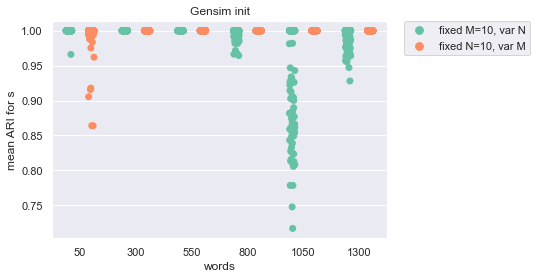

In [125]:
sns.set(font_scale=1)
f=scatt_plot_mean_ari_s_comb(mult_ari_s_m3_N,mult_ari_s_m3_M,200)
f.set(title="Gensim init")

[Text(0.5, 1.0, 'Custom init')]

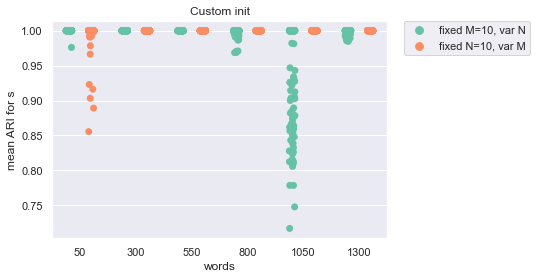

In [126]:
sns.set(font_scale=1)
f=scatt_plot_mean_ari_s_comb(mult_ari_s_m3_N_custom,mult_ari_s_m3_M_custom,200)
f.set(title="Custom init")

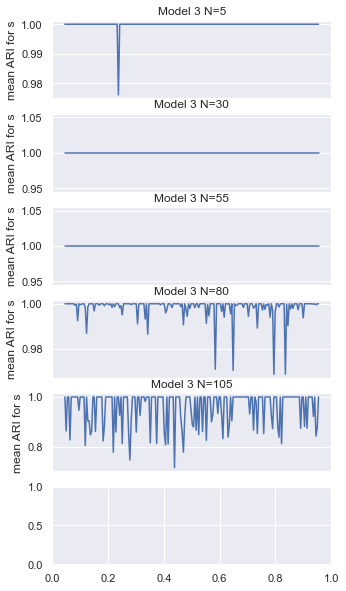

In [207]:
fig,axes = plt.subplots(6,1,figsize=(5,10))
x_ax1=np.concatenate((np.repeat("True",5),np.array(["False"])))
for num, i in enumerate(var):
    test=chains_plot_mean_ari_s_fs(mult_ari_s_m3_N_custom[f'N_{str(i)}'],f"Model 3 N={str(i)}",
                                   ax=axes[num],x_ax=x_ax1[num])


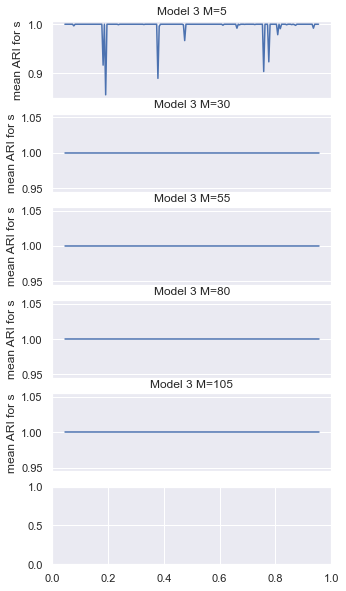

In [208]:
fig,axes = plt.subplots(6,1,figsize=(5,10))
x_ax1=np.concatenate((np.repeat("True",5),np.array(["False"])))
for num, i in enumerate(var):
    test=chains_plot_mean_ari_s_fs(mult_ari_s_m3_M_custom[f'M_{str(i)}'],f"Model 3 M={str(i)}",
                                   ax=axes[num],x_ax=x_ax1[num])

In [131]:
#scatt_plot_mean_ari_s(mult_ari_s_m3_N['N_5'],mult_ari_s_m3_N['N_30'],mult_ari_s_m3_N['N_55'],mult_ari_s_m3_N['N_80'],mult_ari_s_m3_N['N_105'],mult_ari_s_m3_N['N_130'],var=var_N)

In [132]:
#scatt_plot_mean_ari_s(mult_ari_s_m3_N_custom['N_5'],mult_ari_s_m3_N_custom['N_30'],mult_ari_s_m3_N_custom['N_55'],mult_ari_s_m3_N_custom['N_80'],mult_ari_s_m3_N_custom['N_105'],mult_ari_s_m3_N_custom['N_130'],var=var_N)

In [137]:
#scatt_plot_mean_ari_s(mult_ari_s_m3_M['M_5'],mult_ari_s_m3_M['M_30'],mult_ari_s_m3_M['M_55'],mult_ari_s_m3_M['M_80'],mult_ari_s_m3_M['M_105'],mult_ari_s_m3_M['M_130'],var=var_M)

In [136]:
#scatt_plot_mean_ari_s(mult_ari_s_m3_M_custom['M_5'],mult_ari_s_m3_M_custom['M_30'],mult_ari_s_m3_M_custom['M_55'],mult_ari_s_m3_M_custom['M_80'],mult_ari_s_m3_M_custom['M_105'],mult_ari_s_m3_M_custom['M_130'],var=var_M)

[Text(0.5, 1.0, 'Gensim Init')]

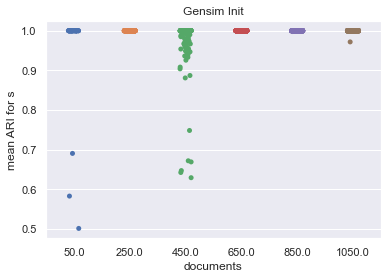

In [146]:
f=scatt_plot_mean_ari_s(mult_ari_s_m3_D['D_50'],mult_ari_s_m3_D['D_250'],mult_ari_s_m3_D['D_450'],mult_ari_s_m3_D['D_650'],
                      mult_ari_s_m3_D['D_850'],mult_ari_s_m3_D['D_1050'],var=var_D,D_case=True)
f.set(title="Gensim Init")

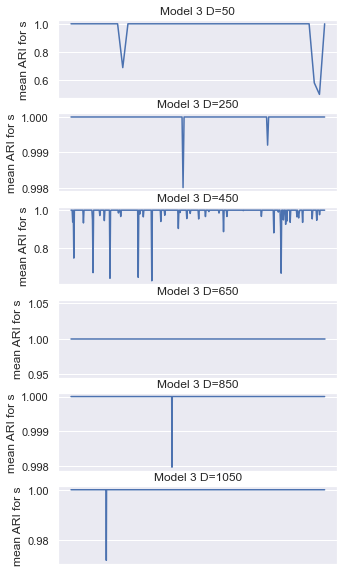

In [148]:
fig,axes = plt.subplots(6,1,figsize=(5,10))
x_ax1=np.concatenate((np.repeat("True",5),np.array(["False"])))
for num, i in enumerate(var_D):
    test=chains_plot_mean_ari_s_fs(mult_ari_s_m3_D[f'D_{str(i)}'],f"Model 3 D={str(i)}",
                                   ax=axes[num],x_ax=x_ax1[num])

[Text(0.5, 1.0, 'Custom init')]

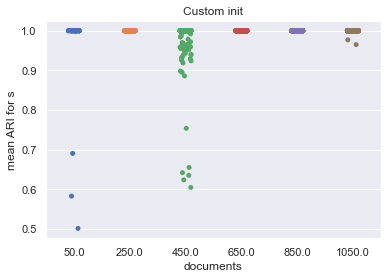

In [144]:
f=scatt_plot_mean_ari_s(mult_ari_s_m3_D_custom['D_50'],mult_ari_s_m3_D_custom['D_250'],mult_ari_s_m3_D_custom['D_450'],mult_ari_s_m3_D_custom['D_650'],
                      mult_ari_s_m3_D_custom['D_850'],mult_ari_s_m3_D_custom['D_1050'],var=var_D,D_case=True)
f.set(title="Custom init")

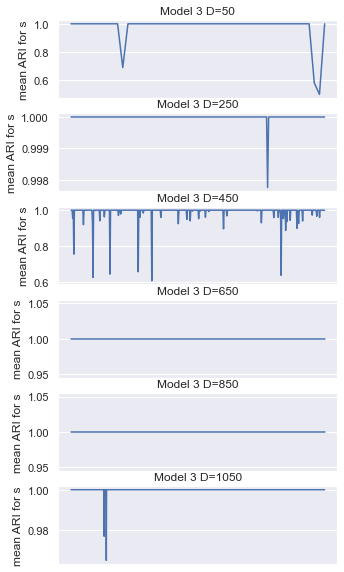

In [147]:
fig,axes = plt.subplots(6,1,figsize=(5,10))
x_ax1=np.concatenate((np.repeat("True",5),np.array(["False"])))
for num, i in enumerate(var_D):
    test=chains_plot_mean_ari_s_fs(mult_ari_s_m3_D_custom[f'D_{str(i)}'],f"Model 3 D={str(i)}",
                                   ax=axes[num],x_ax=x_ax1[num])

### Model 4

In [32]:
# Simulation results for both Gensim and Custom init
var_M_model4_custom={}
var_N_model4_custom={}
var_M_model4={}
var_N_model4={}
var=np.array(range(5,106,25))
for i in var:
    with open(f'./simul_results/fixed_structure/var_M/model_4/res_model_4_M_{str(i)}_custom.pkl','rb') as file:     
        var_M_model4_custom[f'M_{str(i)}']=pickle.load(file)
    with open(f'./simul_results/fixed_structure/var_N/model_4/res_model_4_N_{str(i)}_custom.pkl','rb') as file:     
        var_N_model4_custom[f'N_{str(i)}']=pickle.load(file)
    with open(f'./simul_results/fixed_structure/var_M/model_4/res_model_4_M_{str(i)}.pkl','rb') as file:     
        var_M_model4[f'M_{str(i)}']=pickle.load(file)
    with open(f'./simul_results/fixed_structure/var_N/model_4/res_model_4_N_{str(i)}.pkl','rb') as file:     
        var_N_model4[f'N_{str(i)}']=pickle.load(file)

In [33]:
# M=30 Custom Init no burn-in
with open('./simul_results/fixed_structure/var_M/model_4/res_model_4_M_30_custom_no_burn.pkl','rb') as file:
    var_M_30_model4_custom_noburn=pickle.load(file)

In [34]:
# Revised simulated data for fixed psi to get distinct distrib of command topics under each session topic
with open('./simul_results/fixed_structure/var_M/model_4/res_model_4_M_30_rev_psi_custom.pkl','rb') as file:
    var_M_30_model4_custom_rev_psi=pickle.load(file)

In [68]:
#### MH step for label z test ####
with open(f'./simul_results/fixed_structure/var_M/model_4/res_model_4_M_105_gensim_MH_label_z.pkl','rb') as file:     
    test_m4=pickle.load(file)

In [35]:
# VARYING D for both Gensim and Custom init
# Simulation results
var_D_model4_custom={}
var_D_model4={}
var_D=np.array(range(50,1051,200))
for i in var_D:
    with open(f'./simul_results/fixed_structure/var_D/model_4/res_model_4_D_{str(i)}_custom.pkl','rb') as file:     
        var_D_model4_custom[f'D_{str(i)}']=pickle.load(file)
    with open(f'./simul_results/fixed_structure/var_D/model_4/res_model_4_D_{str(i)}.pkl','rb') as file:     
        var_D_model4[f'D_{str(i)}']=pickle.load(file)

In [69]:
# Simulated data
var_M_model4_data={}
var_N_model4_data={}
for i in var:
    with open(f'./simulated_data/fixed_structure/var_M/model_4/data_m4_M_{str(i)}.pkl','rb') as file:     
        var_M_model4_data[f'M_{str(i)}']=pickle.load(file)  
    with open(f'./simulated_data/fixed_structure/var_N/model_4/data_m4_N_{str(i)}.pkl','rb') as file:     
        var_N_model4_data[f'N_{str(i)}']=pickle.load(file)

In [37]:
# VARYING D
# Simulated data
var_D_model4_data={}
for i in var_D:
    with open(f'./simulated_data/fixed_structure/var_D/model_4/data_m4_D_{str(i)}.pkl','rb') as file:     
        var_D_model4_data[f'D_{str(i)}']=pickle.load(file)

In [16]:
var=np.array(range(5,106,25))

In [17]:
var

array([  5,  30,  55,  80, 105])

In [129]:
'''for i in var:
    print(i)
    print(var_N_model4[f'N_{str(i)}'][1])'''

"for i in var:\n    print(i)\n    print(var_N_model4[f'N_{str(i)}'][1])"

In [90]:
(var_M_model4['M_30'][0]['t'][8]==var_M_model4['M_30'][0]['t'][8]).all()

True

In [154]:
var_M_model4_custom['M_30'][0]['change_t_counter']

array([2581,   36,   27,   31,   21,   26,   17,   24,   25,   28,   23,
         29,   23,   25,   27,   23,   22,   24,   27,   27,   24,   22,
         24,   28,   25,   22,   24,   25,   27,   29,   25,   31,   26,
         22,   19,   25,   29,   23,   18,   21,   29,   31,   18,   33,
         24,   26,   23,   23,   24,   25,   30,   35,   25,   30,   25,
         39,   14,   24,   25,   22,   18,   23,   27,   27,   22,   28,
         29,   31,   28,   17,   23,   25,   32,   23,   29,   29,   30,
         31,   25,   25,   28,   30,   22,   28,   23,   33,   27,   29,
         24,   28,   31,   31,   30,   34,   29,   30,   21,   25,   27,
         28,   30,   31,   31,   25,   33,   21,   23,   22,   26,   21,
         23,   30,   24,   33,   22,   32,   23,   21,   24,   27,   27,
         26,   20,   24,   24,   28,   29,   24,   30,   27,   33,   27,
         20,   26,   25,   27,   30,   27,   28,   25,   28,   23,   30,
         28,   33,   19,   29,   35,   40,   30,   

[Text(0.5, 1.0, 'Gensim Init')]

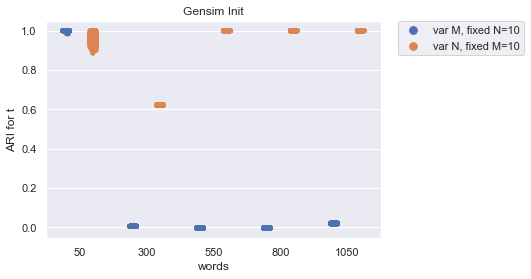

In [155]:
f=scatt_plot_ari_t_fs_comb(sim_res_dic_M=var_M_model4,data_dic_M=var_M_model4_data,sim_res_dic_N=var_N_model4,
                         data_dic_N=var_N_model4_data,var_list=var)
f.set(title="Gensim Init")

[Text(0.5, 1.0, 'Custom Init')]

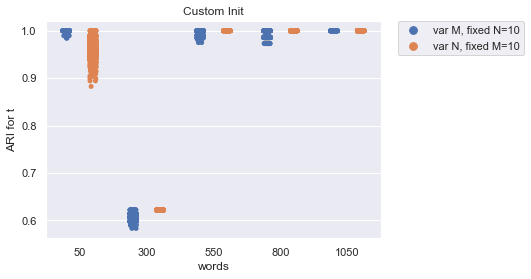

In [156]:
f=scatt_plot_ari_t_fs_comb(sim_res_dic_M=var_M_model4_custom,data_dic_M=var_M_model4_data,sim_res_dic_N=var_N_model4_custom,
                         data_dic_N=var_N_model4_data,var_list=var)
f.set(title="Custom Init")

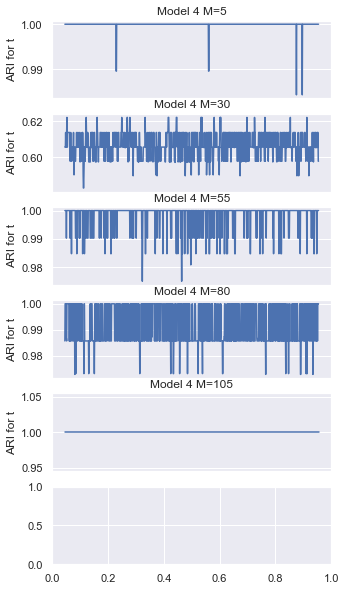

In [157]:
fig,axes = plt.subplots(6,1,figsize=(5,10))
x_ax1=np.concatenate((np.repeat("True",5),np.array(["False"])))
for num, i in enumerate(var):
    test=chains_plot_ari_t_fs_comb(var_M_model4_custom[f'M_{str(i)}'],var_M_model4_data[f'M_{str(i)}'],f"Model 4 M={str(i)}",
                                   ax=axes[num],x_ax=x_ax1[num])
    

<AxesSubplot:title={'center':'Model 4 Custom init no burn-in'}, xlabel='itearations', ylabel='ARI for t'>

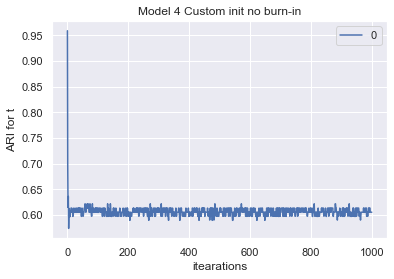

In [205]:
# Fixing psi to get distinct distrib of command topics and re-simulate data for M=30
sns.set(font_scale=1)
cust_M_30_noburn=ari_trace_fun(var_M_model4_data['M_30']['t'],var_M_30_model4_custom_noburn[0]['t'])
pd.DataFrame(cust_M_30_noburn).plot(xlabel = "itearations",ylabel="ARI for t",title="Model 4 Custom init no burn-in")

<AxesSubplot:title={'center':'Model 4 Custom init rev psi'}, xlabel='itearations', ylabel='ARI for t'>

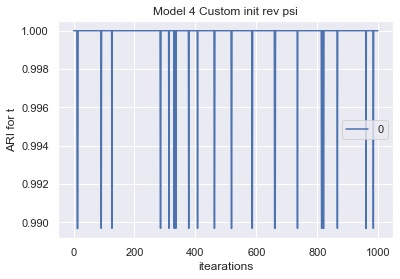

In [203]:
# Fixing psi to get distinct distrib of command topics and re-simulate data for M=30
sns.set(font_scale=1)
rev_M_30=ari_trace_fun(var_M_model4_data['M_30']['t'],var_M_30_model4_custom_rev_psi[0]['t'])
pd.DataFrame(rev_M_30).plot(xlabel = "itearations",ylabel="ARI for t",title="Model 4 Custom init rev psi")

<AxesSubplot:title={'center':'Model 4'}, xlabel='itearations', ylabel='ARI'>

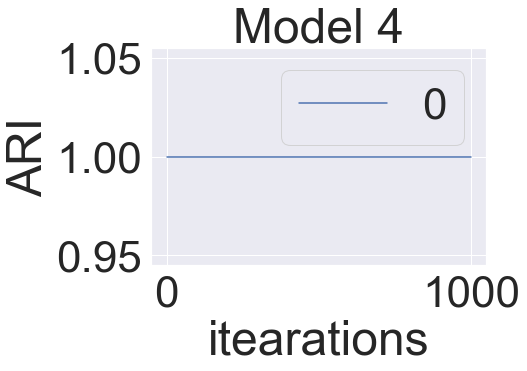

In [70]:
ari_trace4=ari_trace_fun(var_M_model4_data['M_105']['t'],test_m4[0]['t'])
pd.DataFrame(ari_trace4).plot(xlabel = "itearations",ylabel="ARI",title="Model 4")

In [162]:
var_M_model4_custom['M_30'][1]

{'data_dir': './simulated_data/fixed_structure/var_M/model_4/data_m4_M_30.pkl',
 'K': 20,
 'H': 40,
 'V': 0,
 'fixed_H': True,
 'fixed_K': True,
 'fixed_V': True,
 'secondary_topic': True,
 'command_level_topics': True,
 'gamma': 1.0,
 'eta': 1.0,
 'alpha': 1.0,
 'alpha_zero': 1.0,
 'tau': 1.0,
 'iterations': 100000,
 'burn': 10000,
 'size': 10,
 'verbose': True,
 'calc_ll': True,
 'rand_alloc': False,
 'jupy_out': False,
 'return_t': True,
 'return_s': True,
 'return_z': True,
 'thinning': 100,
 'return_change_t': True,
 'return_change_s': True,
 'return_change_z': True,
 'mod_init': 'custom',
 'chunk': 2000,
 'passes': 100,
 'gen_iter': 1000,
 'eval_step': None,
 'K_init': None,
 'H_init': None,
 'save_dir': './simul_results/fixed_structure/var_M/model_4/res_model_4_M_30_custom.pkl'}

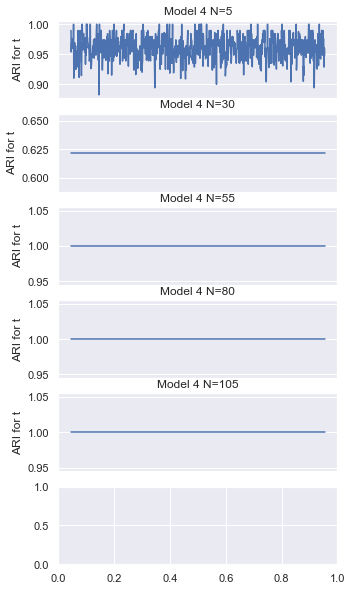

In [158]:
fig,axes = plt.subplots(6,1,figsize=(5,10))
x_ax1=np.concatenate((np.repeat("True",5),np.array(["False"])))
for num, i in enumerate(var):
    test=chains_plot_ari_t_fs_comb(var_N_model4_custom[f'N_{str(i)}'],var_N_model4_data[f'N_{str(i)}'],f"Model 4 N={str(i)}",
                                   ax=axes[num],x_ax=x_ax1[num])

[Text(0.5, 1.0, 'Gensim Init')]

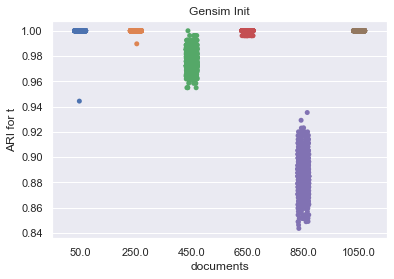

In [163]:
f=scatt_plot_ari_t_fs_comb(sim_res_dic_D=var_D_model4,data_dic_D=var_D_model4_data,var_D=var_D,D_case=True)
f.set(title="Gensim Init")

[Text(0.5, 1.0, 'Custom Init')]

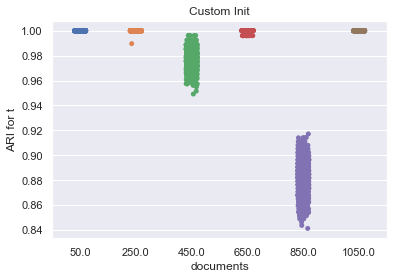

In [164]:
f=scatt_plot_ari_t_fs_comb(sim_res_dic_D=var_D_model4_custom,data_dic_D=var_D_model4_data,var_D=var_D,D_case=True)
f.set(title="Custom Init")

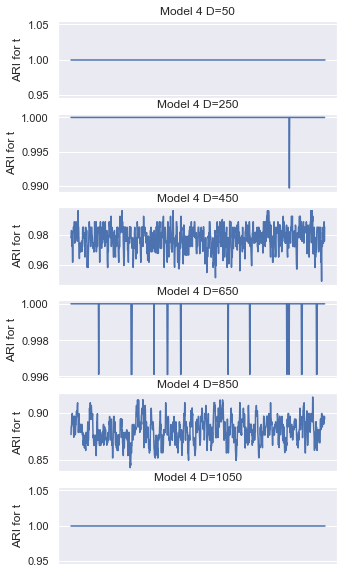

In [165]:
fig,axes = plt.subplots(6,1,figsize=(5,10))
x_ax1=np.concatenate((np.repeat("True",5),np.array(["False"])))
for num, i in enumerate(var_D):
    test=chains_plot_ari_t_fs_comb(var_D_model4_custom[f'D_{str(i)}'],var_D_model4_data[f'D_{str(i)}'],f"Model 4 D={str(i)}",
                                   ax=axes[num],x_ax=x_ax1[num])

In [132]:
'''import tqdm
mult_ari_m4_D_50=np.zeros(shape=(len(var_D_model4_data['D_50']['s']),len(var_D_model4['D_50'][0]['t'])))
for i in tqdm.tqdm(range(len(var_D_model4_data['D_50']['s']))):
    mult_ari_m4_D_50[i]=ari_trace_fun(var_D_model4_data['D_50']['s'][i],var_D_model4['D_50'][0]['s'][i])
with open('./simul_results/fixed_structure/var_D/model_4/res_model_4_D_50_ARI_s_custom.pkl','wb') as file:
    pickle.dump(mult_ari_m4_D_50,file,protocol=pickle.HIGHEST_PROTOCOL)

mult_ari_m4_D_250=np.zeros(shape=(len(var_D_model4_data['D_250']['s']),len(var_D_model4['D_250'][0]['t'])))
for i in tqdm.tqdm(range(len(var_D_model4_data['D_250']['s']))):
    mult_ari_m4_D_250[i]=ari_trace_fun(var_D_model4_data['D_250']['s'][i],var_D_model4['D_250'][0]['s'][i])
with open('./simul_results/fixed_structure/var_D/model_4/res_model_4_D_250_ARI_s_custom.pkl','wb') as file:
    pickle.dump(mult_ari_m4_D_250,file,protocol=pickle.HIGHEST_PROTOCOL)

mult_ari_m4_D_450=np.zeros(shape=(len(var_D_model4_data['D_450']['s']),len(var_D_model4['D_450'][0]['t'])))
for i in tqdm.tqdm(range(len(var_D_model4_data['D_450']['s']))):
    mult_ari_m4_D_450[i]=ari_trace_fun(var_D_model4_data['D_450']['s'][i],var_D_model4['D_450'][0]['s'][i])
with open('./simul_results/fixed_structure/var_D/model_4/res_model_4_D_450_ARI_s_custom.pkl','wb') as file:
    pickle.dump(mult_ari_m4_D_450,file,protocol=pickle.HIGHEST_PROTOCOL)

mult_ari_m4_D_650=np.zeros(shape=(len(var_D_model4_data['D_650']['s']),len(var_D_model4['D_650'][0]['t'])))
for i in tqdm.tqdm(range(len(var_D_model4_data['D_650']['s']))):
    mult_ari_m4_D_650[i]=ari_trace_fun(var_D_model4_data['D_650']['s'][i],var_D_model4['D_650'][0]['s'][i])
with open('./simul_results/fixed_structure/var_D/model_4/res_model_4_D_650_ARI_s_custom.pkl','wb') as file:
    pickle.dump(mult_ari_m4_D_650,file,protocol=pickle.HIGHEST_PROTOCOL)

mult_ari_m4_D_850=np.zeros(shape=(len(var_D_model4_data['D_850']['s']),len(var_D_model4['D_850'][0]['t'])))
for i in tqdm.tqdm(range(len(var_D_model4_data['D_850']['s']))):
    mult_ari_m4_D_850[i]=ari_trace_fun(var_D_model4_data['D_850']['s'][i],var_D_model4['D_850'][0]['s'][i])
with open('./simul_results/fixed_structure/var_D/model_4/res_model_4_D_850_ARI_s_custom.pkl','wb') as file:
    pickle.dump(mult_ari_m4_D_850,file,protocol=pickle.HIGHEST_PROTOCOL)

mult_ari_m4_D_1050=np.zeros(shape=(len(var_D_model4_data['D_1050']['s']),len(var_D_model4['D_1050'][0]['t'])))
for i in tqdm.tqdm(range(len(var_D_model4_data['D_1050']['s']))):
    mult_ari_m4_D_1050[i]=ari_trace_fun(var_D_model4_data['D_1050']['s'][i],var_D_model4['D_1050'][0]['s'][i])
with open('./simul_results/fixed_structure/var_D/model_4/res_model_4_D_1050_ARI_s_custom.pkl','wb') as file:
    pickle.dump(mult_ari_m4_D_1050,file,protocol=pickle.HIGHEST_PROTOCOL)'''

100%|██████████| 1050/1050 [05:27<00:00,  3.21it/s]


In [166]:
def run_ari_s(case,var_M_model4_data,var_M_model4): # case: string
    mult_ari_m4_M=np.zeros(shape=(len(var_M_model4_data[case]['s']),len(var_M_model4[case][0]['t'])))
    for i in tqdm.tqdm(range(len(var_M_model4_data[case]['s']))):
        mult_ari_m4_M[i]=ari_trace_fun(var_M_model4_data[case]['s'][i],var_M_model4[case][0]['s'][i])
    with open(f'./simul_results/fixed_structure/var_M/model_4/res_model_4_{case}_ARI_s_custom.pkl','wb') as file:
        pickle.dump(mult_ari_m4_M,file,protocol=pickle.HIGHEST_PROTOCOL)


In [63]:
'''for i in var_M:
    run_ari_s(f'M_{i}',var_M_model4_data,var_M_model4)'''

"for i in var_M:\n    run_ari_s(f'M_{i}',var_M_model4_data,var_M_model4)"

In [167]:
def scatt_plot_mean_ari_s(mult_ari_1,mult_ari_2,mult_ari_3,mult_ari_4,mult_ari_5,mult_ari_6,var,D_case=False,ax=None): # var is either var_M/var_N or var_D
    mean_ari_5=np.mean(mult_ari_1, axis=1)
    mean_ari_30=np.mean(mult_ari_2, axis=1)
    mean_ari_55=np.mean(mult_ari_3, axis=1)
    mean_ari_80=np.mean(mult_ari_4, axis=1)
    mean_ari_105=np.mean(mult_ari_5, axis=1)
    mean_ari_130=np.mean(mult_ari_6, axis=1)
    r3=np.hstack([mean_ari_5,mean_ari_30,mean_ari_55,mean_ari_80,mean_ari_105,mean_ari_130])
    init3=np.hstack([np.repeat(var[0],len(mean_ari_5)),np.repeat(var[1],len(mean_ari_30)),np.repeat(var[2],len(mean_ari_55)),
                    np.repeat(var[3],len(mean_ari_80)),np.repeat(var[4],len(mean_ari_105)),np.repeat(var[5],len(mean_ari_130))])
    df3=pd.DataFrame([r3,init3]).T
    if D_case:
        df3.columns=["mean ARI for s","documents"]
        g3 = sns.stripplot(x="documents", y="mean ARI for s", data=df3,ax=ax) 
    else:
        df3.columns=["mean ARI for s","words"]
        g3 = sns.stripplot(x="words", y="mean ARI for s", data=df3,ax=ax)
    return(g3)

In [174]:
def scatt_plot_mean_ari_s_alt(mult_ari_1,mult_ari_2,mult_ari_3,mult_ari_4,mult_ari_5,var,D_case=False,ax=None): # var is either var_M/var_N or var_D
    mean_ari_5=np.mean(mult_ari_1, axis=1)
    mean_ari_30=np.mean(mult_ari_2, axis=1)
    mean_ari_55=np.mean(mult_ari_3, axis=1)
    mean_ari_80=np.mean(mult_ari_4, axis=1)
    mean_ari_105=np.mean(mult_ari_5, axis=1)
    r3=np.hstack([mean_ari_5,mean_ari_30,mean_ari_55,mean_ari_80,mean_ari_105])
    init3=np.hstack([np.repeat(var[0],len(mean_ari_5)),np.repeat(var[1],len(mean_ari_30)),np.repeat(var[2],len(mean_ari_55)),
                    np.repeat(var[3],len(mean_ari_80)),np.repeat(var[4],len(mean_ari_105))])
    df3=pd.DataFrame([r3,init3*10]).T
    if D_case:
        df3.columns=["mean ARI for s","documents"]
        g3 = sns.stripplot(x="documents", y="mean ARI for s", data=df3,ax=ax) 
    else:
        df3.columns=["mean ARI for s","words"]
        g3 = sns.stripplot(x="words", y="mean ARI for s", data=df3,ax=ax)
    return(g3)

In [169]:
# ARI for s for both Gensim and Custom init
mult_ari_s_m4_N={}
mult_ari_s_m4_N_custom={}
for i in var: 
    with open(f'./simul_results/fixed_structure/var_N/model_4/res_model_4_N_{str(i)}_ARI_s_custom.pkl','rb') as file:     
        mult_ari_s_m4_N_custom[f'N_{str(i)}']=pickle.load(file)
    with open(f'./simul_results/fixed_structure/var_N/model_4/res_model_4_N_{str(i)}_ARI_s.pkl','rb') as file:     
        mult_ari_s_m4_N[f'N_{str(i)}']=pickle.load(file)

In [170]:
# ARI for s for both Gensim and Custom init
mult_ari_s_m4_M={}
mult_ari_s_m4_M_custom={}
for i in var: 
    with open(f'./simul_results/fixed_structure/var_M/model_4/res_model_4_M_{str(i)}_ARI_s_custom.pkl','rb') as file:     
        mult_ari_s_m4_M_custom[f'M_{str(i)}']=pickle.load(file)
    with open(f'./simul_results/fixed_structure/var_M/model_4/res_model_4_M_{str(i)}_ARI_s.pkl','rb') as file:     
        mult_ari_s_m4_M[f'M_{str(i)}']=pickle.load(file)

In [171]:
# ARI for s for both Gensim and Custom init
mult_ari_s_m4_D={}
mult_ari_s_m4_D_custom={}
for i in var_D: 
    with open(f'./simul_results/fixed_structure/var_D/model_4/res_model_4_D_{str(i)}_ARI_s_custom.pkl','rb') as file:     
        mult_ari_s_m4_D_custom[f'D_{str(i)}']=pickle.load(file)
    with open(f'./simul_results/fixed_structure/var_D/model_4/res_model_4_D_{str(i)}_ARI_s.pkl','rb') as file:     
        mult_ari_s_m4_D[f'D_{str(i)}']=pickle.load(file)

[Text(0.5, 1.0, 'Gensim Init')]

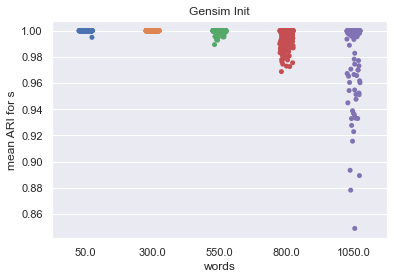

In [175]:
f=scatt_plot_mean_ari_s_alt(mult_ari_s_m4_N['N_5'],mult_ari_s_m4_N['N_30'],mult_ari_s_m4_N['N_55'],mult_ari_s_m4_N['N_80'],mult_ari_s_m4_N['N_105'],var=var_N)
f.set(title="Gensim Init")

[Text(0.5, 1.0, 'Custom Init')]

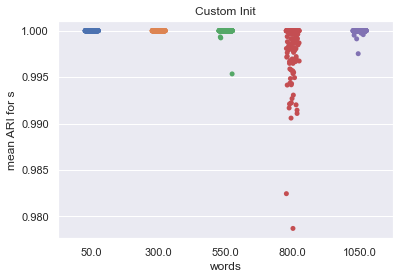

In [176]:
f=scatt_plot_mean_ari_s_alt(mult_ari_s_m4_N_custom['N_5'],mult_ari_s_m4_N_custom['N_30'],mult_ari_s_m4_N_custom['N_55'],mult_ari_s_m4_N_custom['N_80'],mult_ari_s_m4_N_custom['N_105'],var=var_N)
f.set(title="Custom Init")

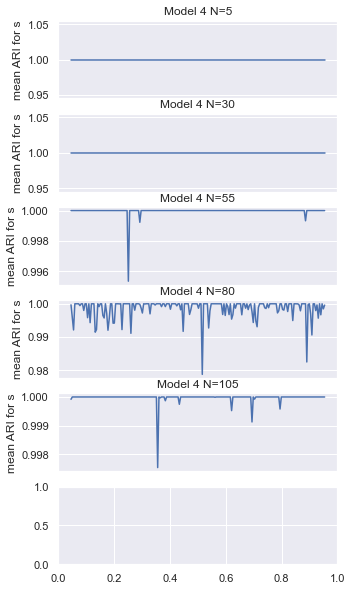

In [177]:
fig,axes = plt.subplots(6,1,figsize=(5,10))
x_ax1=np.concatenate((np.repeat("True",5),np.array(["False"])))
for num, i in enumerate(var):
    test=chains_plot_mean_ari_s_fs(mult_ari_s_m4_N_custom[f'N_{str(i)}'],f"Model 4 N={str(i)}",
                                   ax=axes[num],x_ax=x_ax1[num])

[Text(0.5, 1.0, 'Gensim Init')]

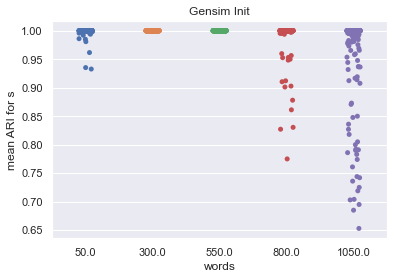

In [178]:
f=scatt_plot_mean_ari_s_alt(mult_ari_s_m4_M['M_5'],mult_ari_s_m4_M['M_30'],mult_ari_s_m4_M['M_55'],mult_ari_s_m4_M['M_80'],mult_ari_s_m4_M['M_105'],var=var_M)
f.set(title="Gensim Init")

[Text(0.5, 1.0, 'Custom Init')]

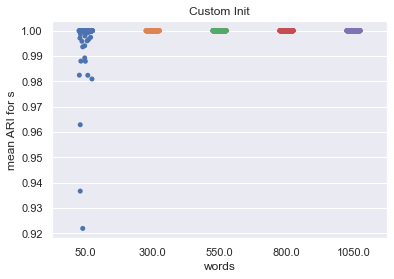

In [179]:
f=scatt_plot_mean_ari_s_alt(mult_ari_s_m4_M_custom['M_5'],mult_ari_s_m4_M_custom['M_30'],mult_ari_s_m4_M_custom['M_55'],mult_ari_s_m4_M_custom['M_80'],mult_ari_s_m4_M_custom['M_105'],var=var_M)
f.set(title="Custom Init")

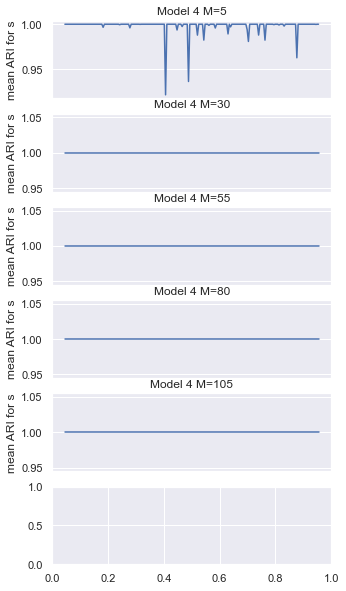

In [180]:
fig,axes = plt.subplots(6,1,figsize=(5,10))
x_ax1=np.concatenate((np.repeat("True",5),np.array(["False"])))
for num, i in enumerate(var):
    test=chains_plot_mean_ari_s_fs(mult_ari_s_m4_M_custom[f'M_{str(i)}'],f"Model 4 M={str(i)}",
                                   ax=axes[num],x_ax=x_ax1[num])

In [73]:
test_m4[0].keys()

dict_keys(['loglik', 't', 'z', 'change_t_counter', 'change_z_counter'])

In [71]:
mult_ari_m4_M=np.zeros(shape=(len(var_M_model4_data['M_105']['s']),len(test_m4[0]['t'])))
for i in tqdm.tqdm(range(len(var_M_model4_data['M_105']['s']))):
    mult_ari_m4_M[i]=ari_trace_fun(var_M_model4_data['M_105']['s'][i],test_m4[0]['s'][i])

  0%|          | 0/200 [00:00<?, ?it/s]


KeyError: 's'

[Text(0.5, 1.0, 'Gensim Init')]

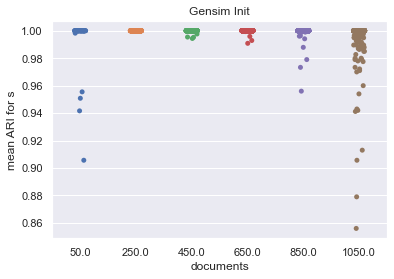

In [181]:
f=scatt_plot_mean_ari_s(mult_ari_s_m4_D['D_50'],mult_ari_s_m4_D['D_250'],mult_ari_s_m4_D['D_450'],mult_ari_s_m4_D['D_650'],mult_ari_s_m4_D['D_850'],mult_ari_s_m4_D['D_1050'],var=var_D,D_case=True)
f.set(title="Gensim Init")

[Text(0.5, 1.0, 'Custom Init')]

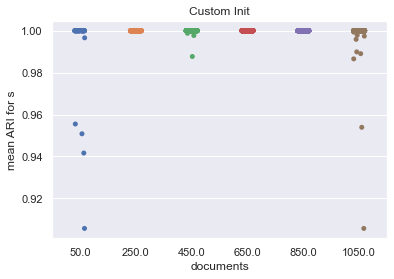

In [182]:
f=scatt_plot_mean_ari_s(mult_ari_s_m4_D_custom['D_50'],mult_ari_s_m4_D_custom['D_250'],mult_ari_s_m4_D_custom['D_450'],mult_ari_s_m4_D_custom['D_650'],mult_ari_s_m4_D_custom['D_850'],mult_ari_s_m4_D_custom['D_1050'],var=var_D,D_case=True)
f.set(title="Custom Init")

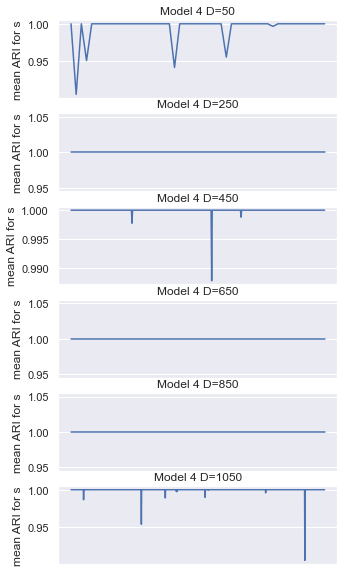

In [183]:
fig,axes = plt.subplots(6,1,figsize=(5,10))
x_ax1=np.concatenate((np.repeat("True",5),np.array(["False"])))
for num, i in enumerate(var_D):
    test=chains_plot_mean_ari_s_fs(mult_ari_s_m4_D_custom[f'D_{str(i)}'],f"Model 4 D={str(i)}",
                                   ax=axes[num],x_ax=x_ax1[num])

In [93]:
mult_ari_s_m4_M.keys()

dict_keys(['M_5', 'M_30', 'M_55', 'M_80', 'M_105'])

In [184]:
def scatt_plot_mean_ari_s_comb(mult_ari_N,mult_ari_M,D,ax=None):# D: number of docs
    mean_ari_N={}
    mean_ari_M={}
    for i in range(5,106,25):
        mean_ari_N[f'N_{str(i)}']=np.mean(mult_ari_N[f'N_{str(i)}'], axis=1)
        mean_ari_M[f'M_{str(i)}']=np.mean(mult_ari_M[f'M_{str(i)}'], axis=1)
    mean_ari_N_val=[]
    mean_ari_M_val=[]
    for i in mean_ari_N.values():
        mean_ari_N_val.extend(i)
    for i in mean_ari_M.values():
        mean_ari_M_val.extend(i)
    r3=np.hstack([mean_ari_N_val,mean_ari_M_val])
    init3=np.hstack([np.repeat("50",D),np.repeat("300",D),np.repeat("550",D),
                    np.repeat("800",D),np.repeat("1050",D)])
    words=np.hstack([init3,init3])
    str_type=np.hstack([np.repeat("fixed M=10, var N",len(init3)),np.repeat("fixed N=10, var M",len(init3))])
    
    df3=pd.DataFrame([r3,words,str_type]).T
    df3.columns=["mean ARI for s","words","case"]
    g3 = sns.stripplot(x="words", y="mean ARI for s", hue="case",data=df3,ax=ax,dodge=True)
    plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
    return(g3)

<AxesSubplot:xlabel='words', ylabel='mean ARI for s'>

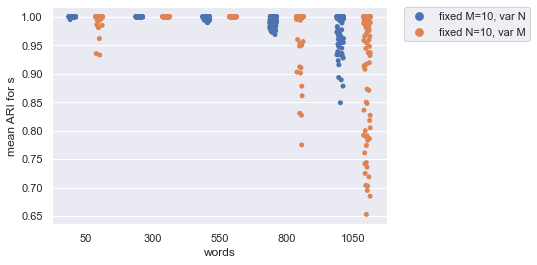

In [185]:
scatt_plot_mean_ari_s_comb(mult_ari_s_m4_N,mult_ari_s_m4_M,200)


<AxesSubplot:xlabel='words', ylabel='mean ARI for s'>

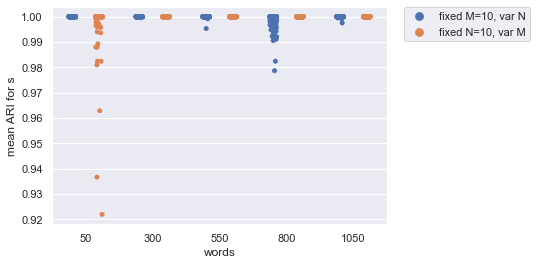

In [186]:
scatt_plot_mean_ari_s_comb(mult_ari_s_m4_N_custom,mult_ari_s_m4_M_custom,200)


In [17]:
'''c_m4_M_5=hamm_z(var_M_model4['M_5'][0]['z'],var_M_model4_data['M_5']['z'])
c_m4_M_30=hamm_z(var_M_model4['M_30'][0]['z'],var_M_model4_data['M_30']['z'])
c_m4_M_55=hamm_z(var_M_model4['M_55'][0]['z'],var_M_model4_data['M_55']['z'])
c_m4_M_80=hamm_z(var_M_model4['M_80'][0]['z'],var_M_model4_data['M_80']['z'])
c_m4_M_105=hamm_z(var_M_model4['M_105'][0]['z'],var_M_model4_data['M_105']['z'])
c_m4_M_130=hamm_z(var_M_model4['M_130'][0]['z'],var_M_model4_data['M_130']['z'])'''

100%|██████████| 200/200 [00:20<00:00,  9.67it/s]


In [18]:
'''with open('./simul_results/fixed_structure/var_M/model_4/res_model_4_M_5_Hamm_z_custom.pkl','wb') as file:
    pickle.dump(c_m4_M_5,file,protocol=pickle.HIGHEST_PROTOCOL)
with open('./simul_results/fixed_structure/var_M/model_4/res_model_4_M_30_Hamm_z_custom.pkl','wb') as file:
    pickle.dump(c_m4_M_30,file,protocol=pickle.HIGHEST_PROTOCOL)
with open('./simul_results/fixed_structure/var_M/model_4/res_model_4_M_55_Hamm_z_custom.pkl','wb') as file:
    pickle.dump(c_m4_M_55,file,protocol=pickle.HIGHEST_PROTOCOL)
with open('./simul_results/fixed_structure/var_M/model_4/res_model_4_M_80_Hamm_z_custom.pkl','wb') as file:
    pickle.dump(c_m4_M_80,file,protocol=pickle.HIGHEST_PROTOCOL)
with open('./simul_results/fixed_structure/var_M/model_4/res_model_4_M_105_Hamm_z_custom.pkl','wb') as file:
    pickle.dump(c_m4_M_105,file,protocol=pickle.HIGHEST_PROTOCOL)
with open('./simul_results/fixed_structure/var_M/model_4/res_model_4_M_130_Hamm_z_custom.pkl','wb') as file:
    pickle.dump(c_m4_M_130,file,protocol=pickle.HIGHEST_PROTOCOL)'''

In [38]:
# Load Hamm for z for sim results for var M for both Gensim and Custom init
var_M_m4_hamm={}
var_M_m4_hamm_custom={}
for i in var:
    with open(f'./simul_results/fixed_structure/var_M/model_4/res_model_4_M_{str(i)}_Hamm_z_custom.pkl','rb') as file:     
        var_M_m4_hamm_custom[f'M_{str(i)}']=pickle.load(file)
    with open(f'./simul_results/fixed_structure/var_M/model_4/res_model_4_M_{str(i)}_Hamm_z.pkl','rb') as file:     
        var_M_m4_hamm[f'M_{str(i)}']=pickle.load(file)

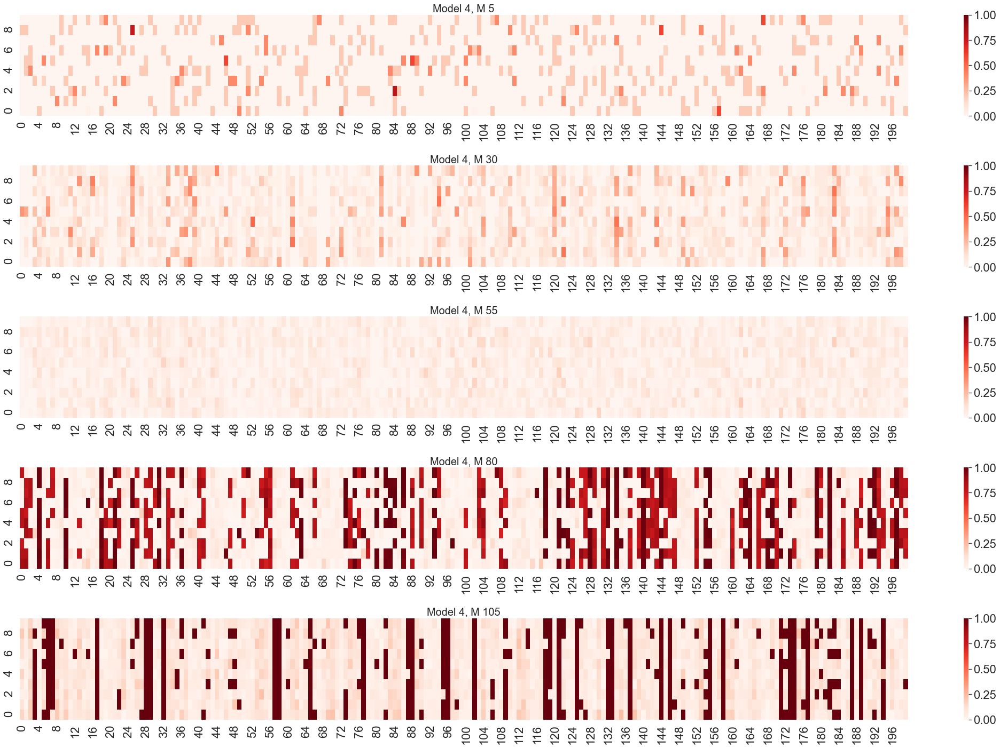

In [41]:
sns.set(font_scale=2)
fig,axes = plt.subplots(5,1,figsize=(30,20))
visual_heatmap(var_M_m4_hamm['M_5'],ax=axes[0])
visual_heatmap(var_M_m4_hamm['M_30'],ax=axes[1])
visual_heatmap(var_M_m4_hamm['M_55'],ax=axes[2])
visual_heatmap(var_M_m4_hamm['M_80'],ax=axes[3])
visual_heatmap(var_M_m4_hamm['M_105'],ax=axes[4])
#visual_heatmap(c_m4_M_130,ax=axes[5])
axes[0].set_title("Model 4, M 5", fontsize=20)
axes[1].set_title("Model 4, M 30", fontsize=20)
axes[2].set_title("Model 4, M 55", fontsize=20)
axes[3].set_title("Model 4, M 80", fontsize=20)
axes[4].set_title("Model 4, M 105", fontsize=20)
#axes[5].set_title("Model 4, M 130", fontsize=20)
fig.tight_layout()

In [47]:
def doc_comm_posit_high_Hamm(dic,cond): 
    '''function for detecting docs and command position for which size of Hamm for z high'''
    pos_list=[]
    ind_doc=0
    for i in dic.values():
        ind_comm=0
        for j in i.values():
            if j>cond:
                pos_list.append((ind_doc,ind_comm))
            ind_comm+=1
        ind_doc+=1
    return pos_list

In [134]:
test=doc_comm_posit_high_Hamm(var_M_m4_hamm['M_105'],0.75)

In [135]:
comm_top=[]
for i in range(1,len(test)):
    comm_top.append(var_M_model4_data['M_105']['s'][test[i][0]][test[i][1]])

In [136]:
Counter(comm_top)

Counter({0: 450})

In [137]:
docs=doc_posit_high_Hamm(var_M_m4_hamm['M_105'],0.75)

In [138]:
Counter(var_M_model4_data['M_80']['t'][docs])

Counter({0: 5, 3: 12, 1: 12, 2: 6})

#### short draft for function for MH label z in topic model class

In [162]:
test2={key: np.where(val==1)[0] for key,val in var_M_model4_data['M_80']['s'].items() if np.where(val==1)[0].size!=0}

In [179]:
r1=0
r2=np.array([0,1,2,4,5,9])
np.array(np.meshgrid(r1,r2)).T.reshape(-1,2)

array([[0, 0],
       [0, 1],
       [0, 2],
       [0, 4],
       [0, 5],
       [0, 9]])

In [227]:
from operator import itemgetter
dict(zip(comm_ind,itemgetter(*comm_ind)(var_M_model4_data['M_80']['z'][0])))

{1: array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
        1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
        1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
        1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]),
 2: array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0,
        1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1,
        1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
        1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]),
 5: array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
        1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
        1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
        1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1])}

In [ ]:
INDEX = 1
COMB = []
for key,val in var_M_model4_data['M_80']['s'].items():
    if np.where(val==INDEX)[0].size!=0:
        inds = np.where(val==INDEX)[0]
        r1=key
        combinations = np.array(np.meshgrid(r1,inds)).T.reshape(-1,2)
    COMB.extend(combinations)
COMB = np.array(COMB)

In [252]:
moves = ['t', 'split_merge_session']
moves_probs = [5, 1]
if True:
    moves += ['s', 'split_merge_command']
    moves_probs += [5, 2]
if True:
    moves += ['z','label_switch_z']
    moves_probs += [5,1]
moves_probs /= np.sum(moves_probs)

In [256]:
moves_probs

array([0.26315789, 0.05263158, 0.26315789, 0.10526316, 0.26315789,
       0.05263158])

In [6]:
np.random.exponential(1)

0.8574526385711717

In [5]:
test=np.array([1,1,2,2,3])
test2=np.array([0,1,1,1,1])
test3=np.array([2,2,2,1,1])
test=test-test2+test3

In [6]:
test

array([3, 2, 3, 2, 3])

#### end of short draft

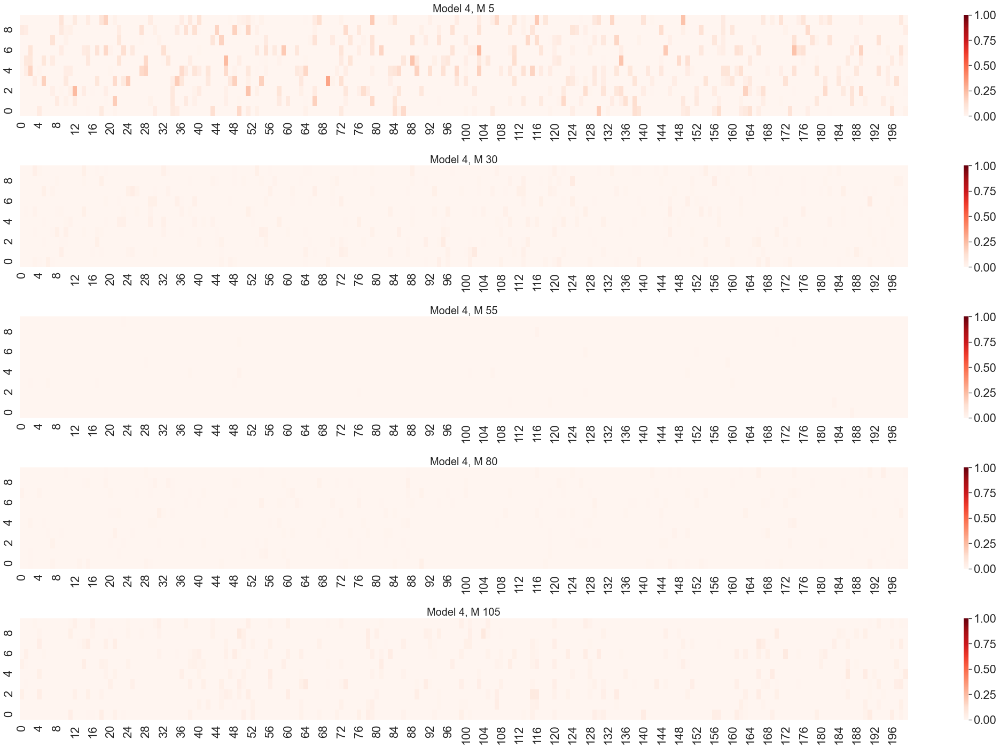

In [189]:
sns.set(font_scale=2)
fig,axes = plt.subplots(5,1,figsize=(30,20))
visual_heatmap(var_M_m4_hamm_custom['M_5'],ax=axes[0])
visual_heatmap(var_M_m4_hamm_custom['M_30'],ax=axes[1])
visual_heatmap(var_M_m4_hamm_custom['M_55'],ax=axes[2])
visual_heatmap(var_M_m4_hamm_custom['M_80'],ax=axes[3])
visual_heatmap(var_M_m4_hamm_custom['M_105'],ax=axes[4])
#visual_heatmap(c_m4_M_130,ax=axes[5])
axes[0].set_title("Model 4, M 5", fontsize=20)
axes[1].set_title("Model 4, M 30", fontsize=20)
axes[2].set_title("Model 4, M 55", fontsize=20)
axes[3].set_title("Model 4, M 80", fontsize=20)
axes[4].set_title("Model 4, M 105", fontsize=20)
#axes[5].set_title("Model 4, M 130", fontsize=20)
fig.tight_layout()

In [23]:
'''c_m4_N_5=hamm_z(var_N_model4['N_5'][0]['z'],var_N_model4_data['N_5']['z'])
c_m4_N_30=hamm_z(var_N_model4['N_30'][0]['z'],var_N_model4_data['N_30']['z'])
c_m4_N_55=hamm_z(var_N_model4['N_55'][0]['z'],var_N_model4_data['N_55']['z'])
c_m4_N_80=hamm_z(var_N_model4['N_80'][0]['z'],var_N_model4_data['N_80']['z'])
c_m4_N_105=hamm_z(var_N_model4['N_105'][0]['z'],var_N_model4_data['N_105']['z'])
#c_m4_M_130=hamm_z(var_M_model4['M_130'][0]['z'],var_M_model4_data['M_130']['z'])''''''

100%|██████████| 200/200 [03:25<00:00,  1.03s/it]


In [24]:
'''with open('./simul_results/fixed_structure/var_N/model_4/res_model_4_N_5_Hamm_z_custom.pkl','wb') as file:
    pickle.dump(c_m4_N_5,file,protocol=pickle.HIGHEST_PROTOCOL)
with open('./simul_results/fixed_structure/var_N/model_4/res_model_4_N_30_Hamm_z_custom.pkl','wb') as file:
    pickle.dump(c_m4_N_30,file,protocol=pickle.HIGHEST_PROTOCOL)
with open('./simul_results/fixed_structure/var_N/model_4/res_model_4_N_55_Hamm_z_custom.pkl','wb') as file:
    pickle.dump(c_m4_N_55,file,protocol=pickle.HIGHEST_PROTOCOL)
with open('./simul_results/fixed_structure/var_N/model_4/res_model_4_N_80_Hamm_z_custom.pkl','wb') as file:
    pickle.dump(c_m4_N_80,file,protocol=pickle.HIGHEST_PROTOCOL)
with open('./simul_results/fixed_structure/var_N/model_4/res_model_4_N_105_Hamm_z_custom.pkl','wb') as file:
    pickle.dump(c_m4_N_105,file,protocol=pickle.HIGHEST_PROTOCOL)
#with open('./simul_results/fixed_structure/var_M/model_4/res_model_4_M_130_Hamm_z.pkl','wb') as file:
#    pickle.dump(c_m4_M_130,file,protocol=pickle.HIGHEST_PROTOCOL)'''

In [190]:
# Load Hamm for z for sim results for var N for both Gensim and Custom init
var_N_m4_hamm={}
var_N_m4_hamm_custom={}
var=np.array(range(5,106,25))
for i in var:
    with open(f'./simul_results/fixed_structure/var_N/model_4/res_model_4_N_{str(i)}_Hamm_z_custom.pkl','rb') as file:     
        var_N_m4_hamm_custom[f'N_{str(i)}']=pickle.load(file)
    with open(f'./simul_results/fixed_structure/var_N/model_4/res_model_4_N_{str(i)}_Hamm_z.pkl','rb') as file:     
        var_N_m4_hamm[f'N_{str(i)}']=pickle.load(file)

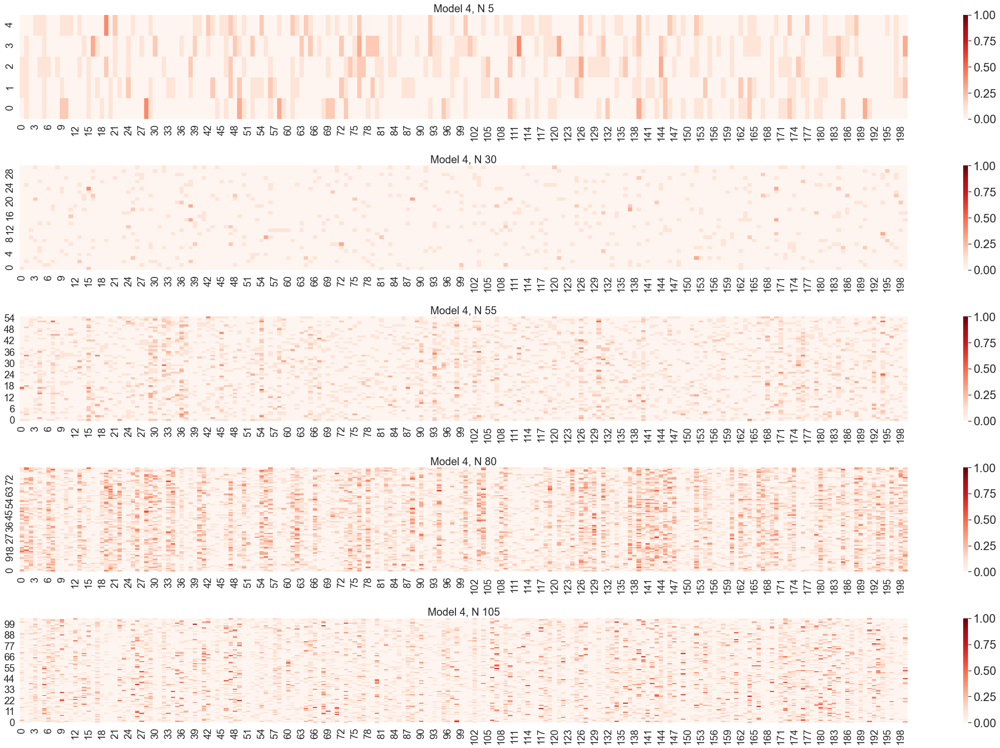

In [191]:
sns.set(font_scale=1.7)
fig,axes = plt.subplots(5,1,figsize=(30,20))
visual_heatmap(var_N_m4_hamm['N_5'],ax=axes[0])
visual_heatmap(var_N_m4_hamm['N_30'],ax=axes[1])
visual_heatmap(var_N_m4_hamm['N_55'],ax=axes[2])
visual_heatmap(var_N_m4_hamm['N_80'],ax=axes[3])
visual_heatmap(var_N_m4_hamm['N_105'],ax=axes[4])
#visual_heatmap(c_m4_M_130,ax=axes[5])
axes[0].set_title("Model 4, N 5", fontsize=20)
axes[1].set_title("Model 4, N 30", fontsize=20)
axes[2].set_title("Model 4, N 55", fontsize=20)
axes[3].set_title("Model 4, N 80", fontsize=20)
axes[4].set_title("Model 4, N 105", fontsize=20)
#axes[5].set_title("Model 4, M 130", fontsize=20)
fig.tight_layout()

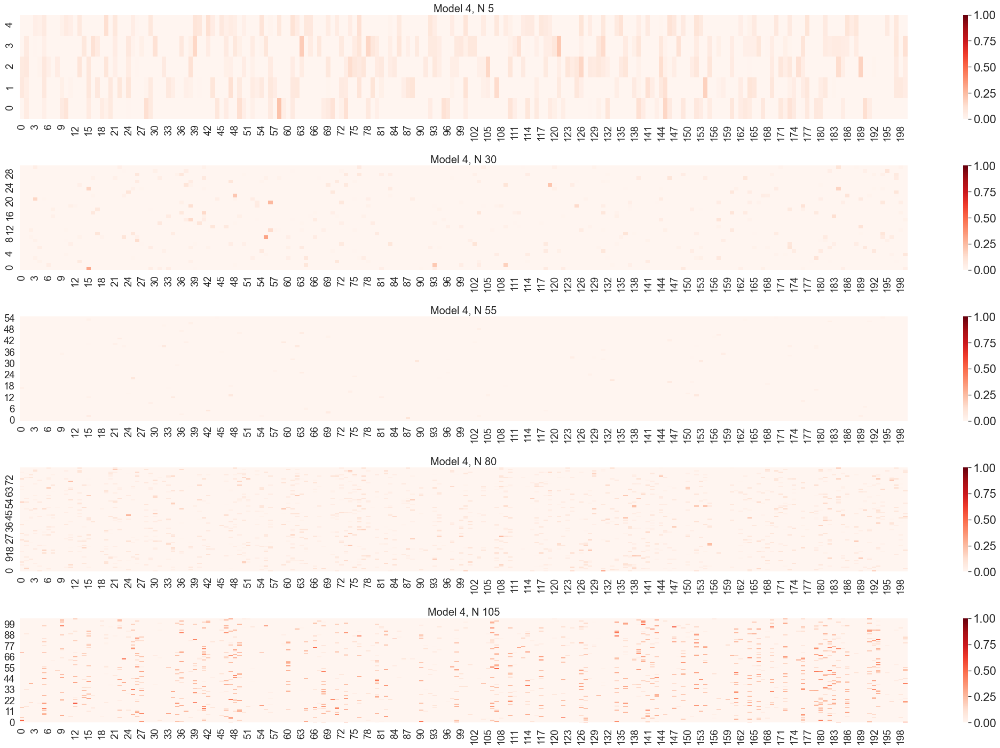

In [192]:
sns.set(font_scale=1.7)
fig,axes = plt.subplots(5,1,figsize=(30,20))
visual_heatmap(var_N_m4_hamm_custom['N_5'],ax=axes[0])
visual_heatmap(var_N_m4_hamm_custom['N_30'],ax=axes[1])
visual_heatmap(var_N_m4_hamm_custom['N_55'],ax=axes[2])
visual_heatmap(var_N_m4_hamm_custom['N_80'],ax=axes[3])
visual_heatmap(var_N_m4_hamm_custom['N_105'],ax=axes[4])
#visual_heatmap(c_m4_M_130,ax=axes[5])
axes[0].set_title("Model 4, N 5", fontsize=20)
axes[1].set_title("Model 4, N 30", fontsize=20)
axes[2].set_title("Model 4, N 55", fontsize=20)
axes[3].set_title("Model 4, N 80", fontsize=20)
axes[4].set_title("Model 4, N 105", fontsize=20)
#axes[5].set_title("Model 4, M 130", fontsize=20)
fig.tight_layout()

In [28]:
'''c_m4_D_50=hamm_z(var_D_model4['D_50'][0]['z'],var_D_model4_data['D_50']['z'])
c_m4_D_250=hamm_z(var_D_model4['D_250'][0]['z'],var_D_model4_data['D_250']['z'])
c_m4_D_450=hamm_z(var_D_model4['D_450'][0]['z'],var_D_model4_data['D_450']['z'])
c_m4_D_650=hamm_z(var_D_model4['D_650'][0]['z'],var_D_model4_data['D_650']['z'])
c_m4_D_850=hamm_z(var_D_model4['D_850'][0]['z'],var_D_model4_data['D_850']['z'])
c_m4_D_1050=hamm_z(var_D_model4['D_1050'][0]['z'],var_D_model4_data['D_1050']['z'])'''

100%|██████████| 1050/1050 [01:44<00:00, 10.07it/s]


In [29]:
'''with open('./simul_results/fixed_structure/var_D/model_4/res_model_4_D_50_Hamm_z_custom.pkl','wb') as file:
    pickle.dump(c_m4_D_50,file,protocol=pickle.HIGHEST_PROTOCOL)
with open('./simul_results/fixed_structure/var_D/model_4/res_model_4_D_250_Hamm_z_custom.pkl','wb') as file:
    pickle.dump(c_m4_D_250,file,protocol=pickle.HIGHEST_PROTOCOL)
with open('./simul_results/fixed_structure/var_D/model_4/res_model_4_D_450_Hamm_z_custom.pkl','wb') as file:
    pickle.dump(c_m4_D_450,file,protocol=pickle.HIGHEST_PROTOCOL)
with open('./simul_results/fixed_structure/var_D/model_4/res_model_4_D_650_Hamm_z_custom.pkl','wb') as file:
    pickle.dump(c_m4_D_650,file,protocol=pickle.HIGHEST_PROTOCOL)
with open('./simul_results/fixed_structure/var_D/model_4/res_model_4_D_850_Hamm_z_custom.pkl','wb') as file:
    pickle.dump(c_m4_D_850,file,protocol=pickle.HIGHEST_PROTOCOL)
with open('./simul_results/fixed_structure/var_D/model_4/res_model_4_D_1050_Hamm_z_custom.pkl','wb') as file:
    pickle.dump(c_m4_D_1050,file,protocol=pickle.HIGHEST_PROTOCOL)'''

In [193]:
# Load Hamm for z for sim results for var D for both Gensim and Custom init
var_D_m4_hamm={}
var_D_m4_hamm_custom={}
for i in var_D:
    with open(f'./simul_results/fixed_structure/var_D/model_4/res_model_4_D_{str(i)}_Hamm_z_custom.pkl','rb') as file:     
        var_D_m4_hamm_custom[f'D_{str(i)}']=pickle.load(file)
    with open(f'./simul_results/fixed_structure/var_D/model_4/res_model_4_D_{str(i)}_Hamm_z.pkl','rb') as file:     
        var_D_m4_hamm[f'D_{str(i)}']=pickle.load(file)

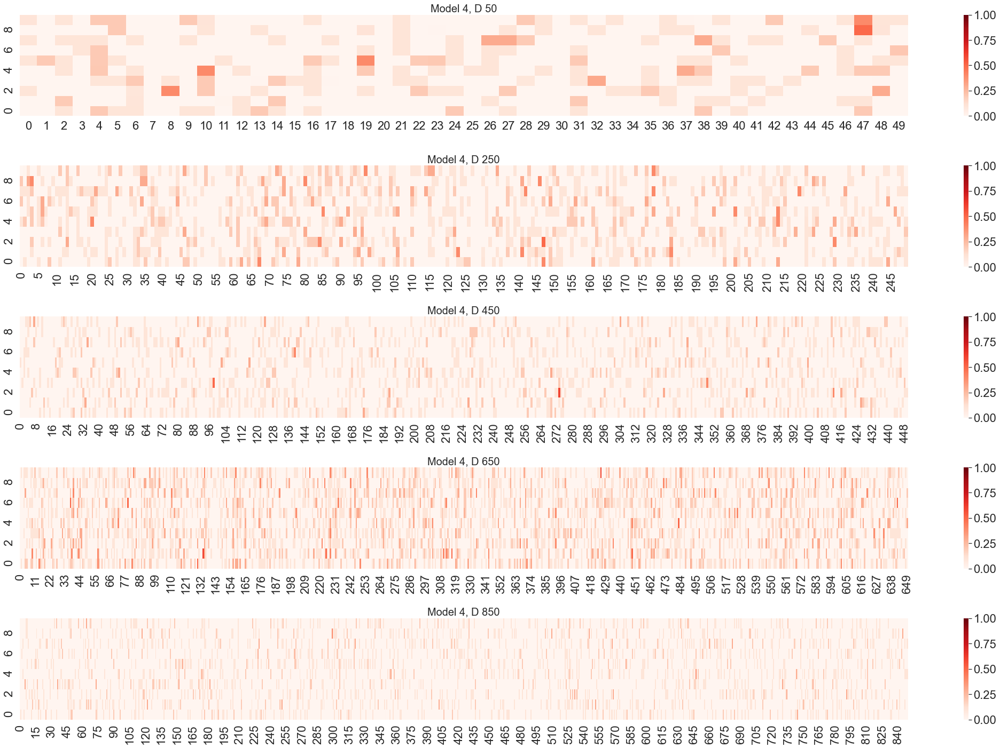

In [194]:
sns.set(font_scale=2)
fig,axes = plt.subplots(5,1,figsize=(30,20))
visual_heatmap(var_D_m4_hamm['D_50'],ax=axes[0])
visual_heatmap(var_D_m4_hamm['D_250'],ax=axes[1])
visual_heatmap(var_D_m4_hamm['D_450'],ax=axes[2])
visual_heatmap(var_D_m4_hamm['D_650'],ax=axes[3])
visual_heatmap(var_D_m4_hamm['D_850'],ax=axes[4])
#visual_heatmap(c_m4_M_130,ax=axes[5])
axes[0].set_title("Model 4, D 50", fontsize=20)
axes[1].set_title("Model 4, D 250", fontsize=20)
axes[2].set_title("Model 4, D 450", fontsize=20)
axes[3].set_title("Model 4, D 650", fontsize=20)
axes[4].set_title("Model 4, D 850", fontsize=20)
#axes[5].set_title("Model 4, M 130", fontsize=20)
fig.tight_layout()

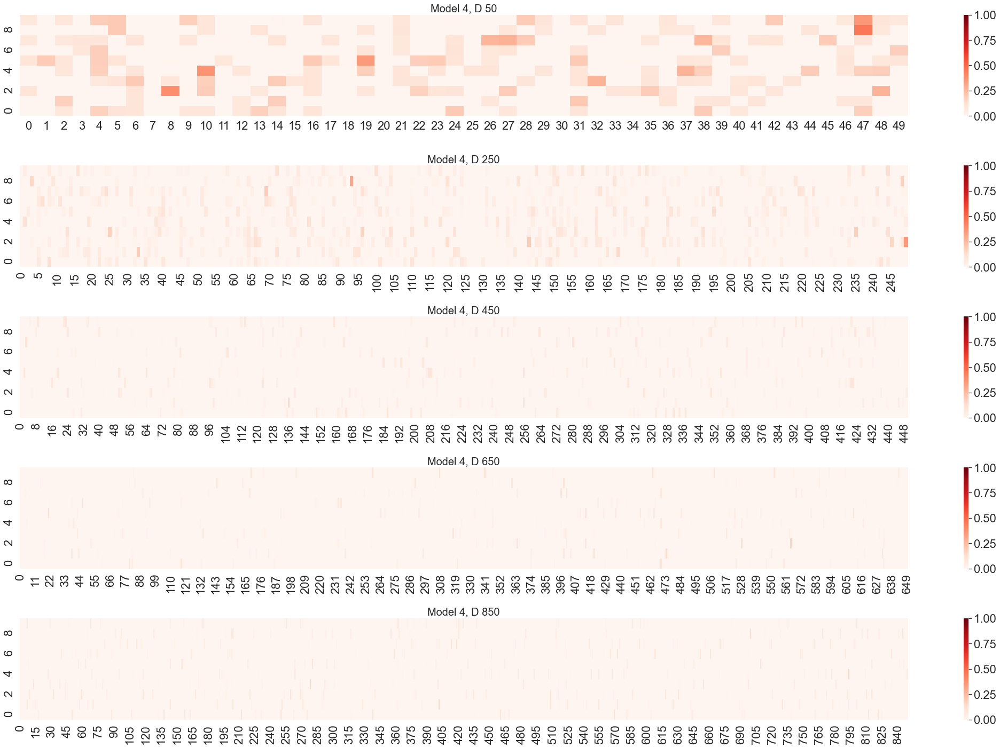

In [195]:
sns.set(font_scale=2)
fig,axes = plt.subplots(5,1,figsize=(30,20))
visual_heatmap(var_D_m4_hamm_custom['D_50'],ax=axes[0])
visual_heatmap(var_D_m4_hamm_custom['D_250'],ax=axes[1])
visual_heatmap(var_D_m4_hamm_custom['D_450'],ax=axes[2])
visual_heatmap(var_D_m4_hamm_custom['D_650'],ax=axes[3])
visual_heatmap(var_D_m4_hamm_custom['D_850'],ax=axes[4])
#visual_heatmap(c_m4_M_130,ax=axes[5])
axes[0].set_title("Model 4, D 50", fontsize=20)
axes[1].set_title("Model 4, D 250", fontsize=20)
axes[2].set_title("Model 4, D 450", fontsize=20)
axes[3].set_title("Model 4, D 650", fontsize=20)
axes[4].set_title("Model 4, D 850", fontsize=20)
#axes[5].set_title("Model 4, M 130", fontsize=20)
fig.tight_layout()

### Marginal likelihood

<AxesSubplot:xlabel='itearations', ylabel='log likelihood'>

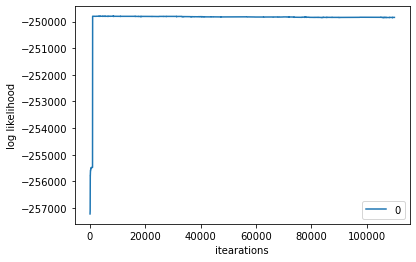

In [7]:
test=var_M_model4['M_105'][0]['loglik']
pd.DataFrame(test).plot(xlabel = "itearations",ylabel="log likelihood")

<AxesSubplot:xlabel='itearations', ylabel='log likelihood'>

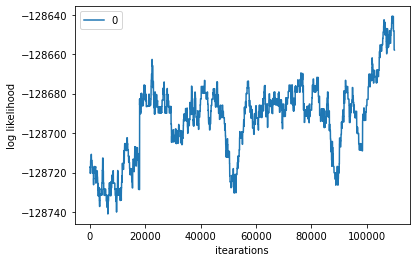

In [40]:
test2=var_M_model4_custom['M_105'][0]['loglik']
pd.DataFrame(test2).plot(xlabel = "itearations",ylabel="log likelihood")

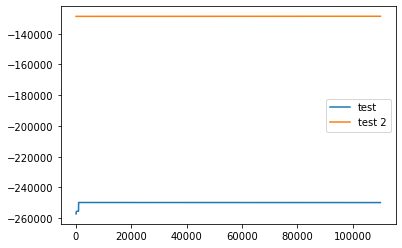

In [60]:
plt.plot(range(len(test)), test, label="test")
plt.plot(range(len(test2)), test2, label="test 2")
plt.legend()

In [12]:
w=var_M_model4_data['M_105']['w']
M = {}
for d in w:
    M[d] = [len(w[d][command]) for command in w[d]]

In [13]:
M


{0: [105, 105, 105, 105, 105, 105, 105, 105, 105, 105],
 1: [105, 105, 105, 105, 105, 105, 105, 105, 105, 105],
 2: [105, 105, 105, 105, 105, 105, 105, 105, 105, 105],
 3: [105, 105, 105, 105, 105, 105, 105, 105, 105, 105],
 4: [105, 105, 105, 105, 105, 105, 105, 105, 105, 105],
 5: [105, 105, 105, 105, 105, 105, 105, 105, 105, 105],
 6: [105, 105, 105, 105, 105, 105, 105, 105, 105, 105],
 7: [105, 105, 105, 105, 105, 105, 105, 105, 105, 105],
 8: [105, 105, 105, 105, 105, 105, 105, 105, 105, 105],
 9: [105, 105, 105, 105, 105, 105, 105, 105, 105, 105],
 10: [105, 105, 105, 105, 105, 105, 105, 105, 105, 105],
 11: [105, 105, 105, 105, 105, 105, 105, 105, 105, 105],
 12: [105, 105, 105, 105, 105, 105, 105, 105, 105, 105],
 13: [105, 105, 105, 105, 105, 105, 105, 105, 105, 105],
 14: [105, 105, 105, 105, 105, 105, 105, 105, 105, 105],
 15: [105, 105, 105, 105, 105, 105, 105, 105, 105, 105],
 16: [105, 105, 105, 105, 105, 105, 105, 105, 105, 105],
 17: [105, 105, 105, 105, 105, 105, 105, 

In [9]:
var_M_model4_data['M_105'].keys()

dict_keys(['t', 'N', 'M', 'w', 'phi', 's', 'psi', 'z', 'theta'])

In [31]:
## Get counts given initial values of t, s and z
def counts(t,s,z,K,H,V,w,M,secondary_topic,command_level_topics):
    # Session-level topics
    T = np.zeros(K, dtype=int)
    # Command-level topics
    if command_level_topics:
        S = np.zeros((K,H), dtype=int)
        W = np.zeros(shape=(H + (1 if secondary_topic else 0), V), dtype=int)
    else:
        W = np.zeros(shape=(K + (1 if secondary_topic else 0), V), dtype=int)             
    # Primary-secondary topic indicators
    if secondary_topic:
        if command_level_topics:
            M_star = np.zeros(shape=H, dtype=int)
            Z = np.zeros(shape=H, dtype=int)
        else:
            M_star = np.zeros(shape=K, dtype=int)
            Z = np.zeros(shape=K, dtype=int)
    # Initialise quantities 
    Q = Counter(t)
    for topic in Q:
        T[topic] += Q[topic]
    for doc in w:
        td = t[doc]
        if command_level_topics:
            for j in w[doc]:
                sjd = s[doc][j]
                S[td,sjd] += 1
                if secondary_topic:
                    M_star[sjd] += M[doc][j] 
                    Z[sjd] += np.sum(z[doc][j])
                    # Primary topics
                    Wjd = Counter(w[doc][j][z[doc][j] == 1])
                    for v in Wjd:
                        W[sjd + 1, v] += Wjd[v]
                    # Secondary topics
                    Wjd = Counter(w[doc][j][z[doc][j] == 0])
                    for v in Wjd:
                        W[0, v] += Wjd[v]
                else:
                    Wjd = Counter(w[doc][j])
                    for v in Wjd:
                        W[sjd, v] += Wjd[v]
        else:
            for j in w[doc]:
                if secondary_topic:
                    M_star[td] += M[doc][j] 
                    Z[td] += np.sum(z[doc][j])
                    # Primary topics
                    Wjd = Counter(w[doc][j][z[doc][j] == 1])
                    for v in Wjd:
                        W[td + 1, v] += Wjd[v]
                    # Secondary topics
                    Wjd = Counter(w[doc][j][z[doc][j] == 0])
                    for v in Wjd:
                        W[0, v] += Wjd[v]
                else:
                    Wjd = Counter(w[doc][j])
                    for v in Wjd:
                        W[td, v] += Wjd[v]
        
    out={}
    out['W']=W
    out['T']=T
    if command_level_topics:
        out['S']=S
    if secondary_topic:
        out['Z']=Z
        out['M_star']=M_star
    return out

In [33]:
counts_model4=counts(t=var_M_model4_data['M_105']['t'],s=var_M_model4_data['M_105']['s'],
                     z=var_M_model4_data['M_105']['z'],K=4,H=10,V=50,M=M,
                     w=var_M_model4_data['M_105']['w'],secondary_topic=True,command_level_topics=True)

In [34]:
def marginal_loglikelihood(K,H,T,S,W,Z,M_star,tau,eta,alpha,alpha0,gamma, command_level_topics,secondary_topic):
    ll = 0
    ll += logB(gamma + T)
    if command_level_topics:
        ll += np.sum([logB(eta + S[k]) for k in range(K)])
        ll += np.sum([logB(tau + W[h]) for h in range(H + (1 if secondary_topic else 0))])
    else:
        ll += np.sum([logB(eta + W[k]) for k in range(K + (1 if secondary_topic else 0))])
    if secondary_topic:
        ll += np.sum([logB(np.array([alpha + Z[k], alpha0 + M_star[k] - Z[k]])) for k in range(H if command_level_topics else K)])
    return ll 

In [35]:
##########################
# True marginal loglikel #
##########################
ll=marginal_loglikelihood(K=4,H=10,T=counts_model4['T'],S=counts_model4['S'],
                          W=counts_model4['W'],Z=counts_model4['Z'],M_star=counts_model4['M_star'],
                          tau=0.1,eta=0.01,alpha=20,alpha0=1,gamma=10, 
                          command_level_topics=True,secondary_topic=True)

In [36]:
np.array(test2)/round(ll)

array([1.10869497, 1.10869497, 1.10869497, ..., 1.10818332, 1.10818332,
       1.10818332])

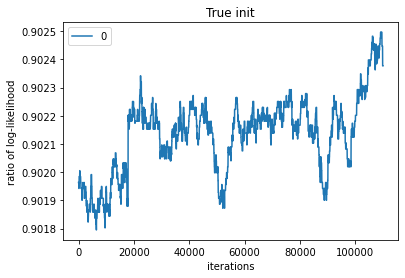

In [84]:
true_init=np.around(round(ll)/np.around(np.array(test2)),decimals=10)
f=pd.DataFrame(true_init).plot(xlabel = "iterations",ylabel="ratio of log-likelihood")
f.set(title="True init")
plt.savefig("true_init.png")

In [76]:
test[1000:]

[-249799.7650756799,
 -249799.7650756799,
 -249799.7650756799,
 -249799.7650756799,
 -249799.7650756799,
 -249799.7650756799,
 -249799.7650756799,
 -249799.7650756799,
 -249799.7650756799,
 -249799.7650756799,
 -249799.7650756799,
 -249799.7650756799,
 -249799.7650756799,
 -249799.7650756799,
 -249799.7650756799,
 -249799.7650756799,
 -249799.7650756799,
 -249799.7650756799,
 -249799.7650756799,
 -249799.7650756799,
 -249799.7650756799,
 -249799.7650756799,
 -249799.7650756799,
 -249799.7650756799,
 -249799.7650756799,
 -249799.7650756799,
 -249799.7650756799,
 -249799.7650756799,
 -249799.7650756799,
 -249799.7650756799,
 -249799.7650756799,
 -249799.7650756799,
 -249799.7650756799,
 -249799.7650756799,
 -249799.7650756799,
 -249799.7650756799,
 -249799.7650756799,
 -249799.7650756799,
 -249799.7650756799,
 -249799.7650756799,
 -249799.7650756799,
 -249799.7650756799,
 -249799.7650756799,
 -249799.7650756799,
 -249799.7650756799,
 -249799.7650756799,
 -249799.7650756799,
 -249799.7650

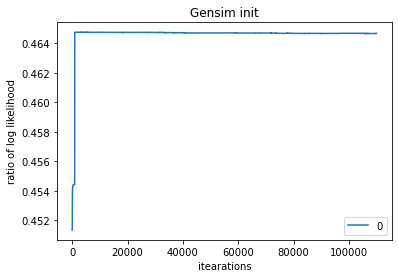

In [86]:
gensim_init=np.around(round(ll)/np.around(np.array(test)),decimals=10)
f=pd.DataFrame(gensim_init).plot(xlabel = "itearations",ylabel="ratio of log likelihood")
f.set(title="Gensim init")
plt.savefig("gensim_init.png")

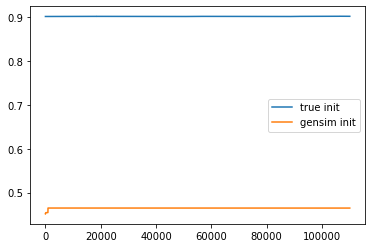

In [83]:
plt.plot(range(len(true_init)), true_init, label="true init")
plt.plot(range(len(gensim_init)), gensim_init, label="gensim init")
plt.legend()